In [4]:
import pandas as pd
from sklearn.linear_model import ElasticNet
import numpy as np
import seaborn as sns
from sklearn import metrics

## Pour ignorer les erreurs de convergence
# from sklearn.utils.testing import ignore_warnings
# from sklearn.exceptions import ConvergenceWarning

In [5]:
# from google.colab import drive
# drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


## Import Data

In [ ]:
y = pd.read_csv('Data/Target_Data.csv', index_col = 'Unnamed: 0')
X = pd.read_csv('Data/Wind_Data.csv', index_col = 'Unnamed: 0')

In [6]:
# y = pd.read_csv('/content/gdrive/MyDrive/Deep Learning/Data/Target_Data.csv', index_col = 'Unnamed: 0')
# X = pd.read_csv('/content/gdrive/MyDrive/Deep Learning/Data/Wind_Data.csv', index_col = 'Unnamed: 0')


Data information : 

 - For the training data, each line corresponds to all the wind data of each considered station between a time t and a time t - 24h. Knowing that 178 stations have been selected and that the time step is hourly, there are 178*24 = 4272 features for each example. 
 - For the labels to be predicted, each line corresponds to the load factor between time t + 1h and time t + 4h, i.e. 4 values to predict.


In [7]:
def split(X, y, val_size = 0.1, test_size = 0.2):
    
    m = X.shape[0] ## nombre d'exemples
    indice_bas_test = int(m*(1 - test_size))
    indice_haut_test = int(m)

    X_train_val = X[:indice_bas_test]
    y_train_val = y[:indice_bas_test]
    X_test = X[indice_bas_test:indice_haut_test]
    y_test = y[indice_bas_test:indice_haut_test]

    m_train_val = X_train_val.shape[0]
    indice_bas_val = int(m_train_val*(1 - val_size))
    indice_haut_val = int(m_train_val)

    X_train = X_train_val[:indice_bas_val]
    y_train = y_train_val[:indice_bas_val]
    X_val = X_train_val[indice_bas_val:indice_haut_val]
    y_val = y_train_val[indice_bas_val:indice_haut_val]

    return [X_train_val, X_train, X_val, X_test, y_train_val, y_train , y_val, y_test]
    
X_train_val, X_train, X_val, X_test, y_train_val, y_train , y_val, y_test = split(X, y)

In [8]:
print('X_train_val shape : ',X_train_val.shape)
print('X_train shape : ',X_train.shape)
print('X_val shape : ',X_val.shape)
print('X_test shape : ',X_test.shape)
print('y_train_val shape : ',y_train_val.shape)
print('y_train shape : ',y_train.shape)
print('y_val shape : ',y_val.shape)
print('y_test shape : ',y_test.shape)

X_train_val shape :  (4068, 4272)
X_train shape :  (3661, 4272)
X_val shape :  (407, 4272)
X_test shape :  (1017, 4272)
y_train_val shape :  (4068, 4)
y_train shape :  (3661, 4)
y_val shape :  (407, 4)
y_test shape :  (1017, 4)


### Evaluation



In [9]:

def mean_absolute_percentage_error(y_true, y_pred): 
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


def model_evaluate(model, X, y):

  y_pred = model.predict(X)
  y_array = y.values

  y_true_ravel = np.ravel(y_array)
  y_pred_ravel = np.ravel(y_pred)

  print(y_true_ravel)
  print(y_pred_ravel)

  biais_array = y_pred_ravel - y_true_ravel

  ecart_relatif = (abs(y_pred_ravel - y_true_ravel) / y_true_ravel)*100
  sns.set(rc={'figure.figsize':(12,4)})

  print(f'Variance Score = {metrics.explained_variance_score(y_true_ravel, y_pred_ravel)}')
  print(f'Bias Mean = {biais_array.mean()}')
  print(f'r2 score = {metrics.r2_score(y_true_ravel, y_pred_ravel)}')
  print(f'RMSE score = {metrics.mean_squared_error(y_true_ravel, y_pred_ravel)}')

  print(f'Mean Absolute Percentage Error = {mean_absolute_percentage_error(y_true_ravel, y_pred_ravel)}')
  sns.histplot(x = biais_array, kde = True)
  sns.jointplot(x=y_pred_ravel, y=y_true_ravel, kind="reg", color="#4CB391", height = 12)

In [10]:
import tensorflow as tf
from tensorflow import keras
from keras.layers import Dense,Dropout,SimpleRNN,LSTM, GRU, Bidirectional
from keras.models import Sequential
from sklearn.metrics import r2_score
from keras import optimizers
from tensorflow.keras import layers

In [11]:
def training(X, y, batch_size, epochs, modele, name, loss, optimizer, checkpoint = True, tensorboard = True):

  modele.compile(
      loss = loss,
      optimizer = optimizer
  )

  if tensorboard:
    log_fit = 'Results/logs/fit' +'/'+ name
    tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_fit, histogram_freq=1)
  
  dir_model_h5 = 'Results/'+name+'.h5'

  if checkpoint:
    checkpoint_cb = keras.callbacks.ModelCheckpoint(dir_model_h5, save_best_only=True)

  history = modele.fit(X, y, batch_size=batch_size, epochs=epochs, validation_data=(X_val, y_val), callbacks=[checkpoint_cb,tensorboard_cb])

  return [history, dir_model_h5]


In [12]:
def model_evaluateb(model, X, y):

  y_pred = model.predict(X)
  y_array = y.values

  y_true_ravel = np.ravel(y_array)
  y_pred_ravel = np.ravel(y_pred)

  print(y_true_ravel)
  print(y_pred_ravel)

  biais_array = y_pred_ravel - y_true_ravel

  ecart_relatif = (abs(y_pred_ravel - y_true_ravel) / y_true_ravel)*100
  sns.set(rc={'figure.figsize':(12,4)})

  print(f'Variance Score = {metrics.explained_variance_score(y_true_ravel, y_pred_ravel)}')
  print(f'Moyenne des biais = {biais_array.mean()}')
  print(f'r2 score = {metrics.r2_score(y_true_ravel, y_pred_ravel)}')
  print(f'RMSE score = {metrics.mean_squared_error(y_true_ravel, y_pred_ravel)}')

  print(f'Mean Absolute Percentage Error = {mean_absolute_percentage_error(y_true_ravel, y_pred_ravel)}')
  sns.histplot(x = biais_array, kde = True)
  sns.jointplot(x=y_pred_ravel, y=y_true_ravel, kind="reg", color="#4CB391", height = 12)

### Old Models

In [ ]:
def create_model(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',dropout = True, dropout_rate = 0.1):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)

    model.add(layers.Input(shape = (inputs_shape,)))

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]

In [ ]:
model, name = create_model(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128), 
                           dropout = True)

Model: "model_EDF_1024_512_256_128_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1024)              4375552   
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dropout_2 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)           

In [ ]:
version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train, y_train, 
                                 batch_size = 8, 
                                 epochs = 50, 
                                 modele = model, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

KeyboardInterrupt: ignored

In [ ]:
model_drop2, name = create_model(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           dropout_rate= 0.05)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train, y_train, 
                                 batch_size = 8, 
                                 epochs = 50, 
                                 modele = model_drop2, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_drop2, X_test, y_test)

In [ ]:
X_train

In [ ]:
# X_train_2 = X_train.to_numpy()
# X_train_2=X_train_2.reshape((int(X_train.shape[0]), 24, int(X_train.shape[1]/24)))
# X_train_2.shape
X_train_2 = X_train.to_numpy()
X_train_2=X_train_2.reshape((int(X_train.shape[0]),  int(X_train.shape[1]),1))
X_train_2.shape
# import tensorflow as tf
# import numpy as np

# x = tf.random.normal((3000,1000,1))
# y = np.random.randint(1,2,3000)

# tf.keras.layers.Conv1D(10,2,input_shape=(3000,1000))(x)

# m=tf.keras.models.Sequential([
#                               tf.keras.layers.Conv1D(10,2,input_shape=(1000,1)),
#                               tf.keras.layers.Flatten(),
#                               tf.keras.layers.Dense(1)
#                               ])

# m.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
# m.fit(x,y,epochs=2)


# X_train_series = X_train.values.reshape((X_train.shape[0], X_train.shape[1], 1))
# X_valid_series = X_valid.values.reshape((X_valid.shape[0], X_valid.shape[1], 1))
# print('Train set shape', X_train_series.shape)
# print('Validation set shape', X_valid_series.shape)

# Train set shape (100746, 30, 1)
# Validation set shape (67164, 30, 1)

# model_cnn = Sequential()
# model_cnn.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train_series.shape[1], X_train_series.shape[2])))
# model_cnn.add(MaxPooling1D(pool_size=2))
# model_cnn.add(Flatten())
# model_cnn.add(Dense(50, activation='relu'))
# model_cnn.add(Dense(1))
# model_cnn.compile(loss='mse', optimizer=adam)
# model_cnn.summary()

(3661, 4272, 1)

In [ ]:
def create_model_conv(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',dropout = True, dropout_rate = 0.1):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    name += '_conv1d_conv1d_flatten'
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)
    # input_shape = (8, 3661, 4272)
    # model.add(layers.Input(shape = (inputs_shape,)))
    # model.add(layers.Reshape((4272, 1), (3661, 4272)))
    # model.add(layers.Conv1D(filters = 64, kernel_size = 6, activation = 'relu', input_shape = (None,4272, 1)))
    model.add(layers.Conv1D(filters=32, kernel_size=6, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(layers.MaxPooling1D(pool_size = 2))
    model.add(layers.Conv1D(filters=32, kernel_size=6, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(layers.MaxPooling1D(pool_size = 2))
    # model.add(Conv1D(filters = 64, kernel_size = 3, activation = 'relu'))
    # 
    model.add(layers.Flatten())

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]

Model: "model_EDF_1024__conv1d_conv1d_flatten512_256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 4267, 32)          224       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 2133, 32)         0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 2128, 32)          6176      
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 1064, 32)         0         
 1D)                                                             
                                                                 
 flatten (Flatten)           (None, 34048)             0         
                                                            

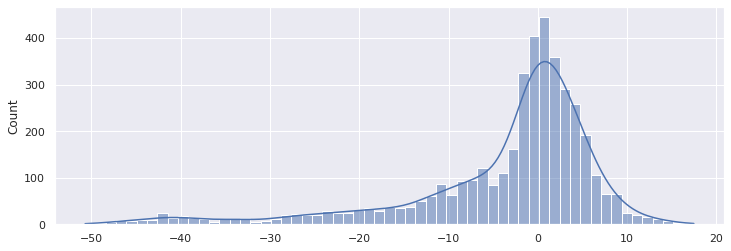

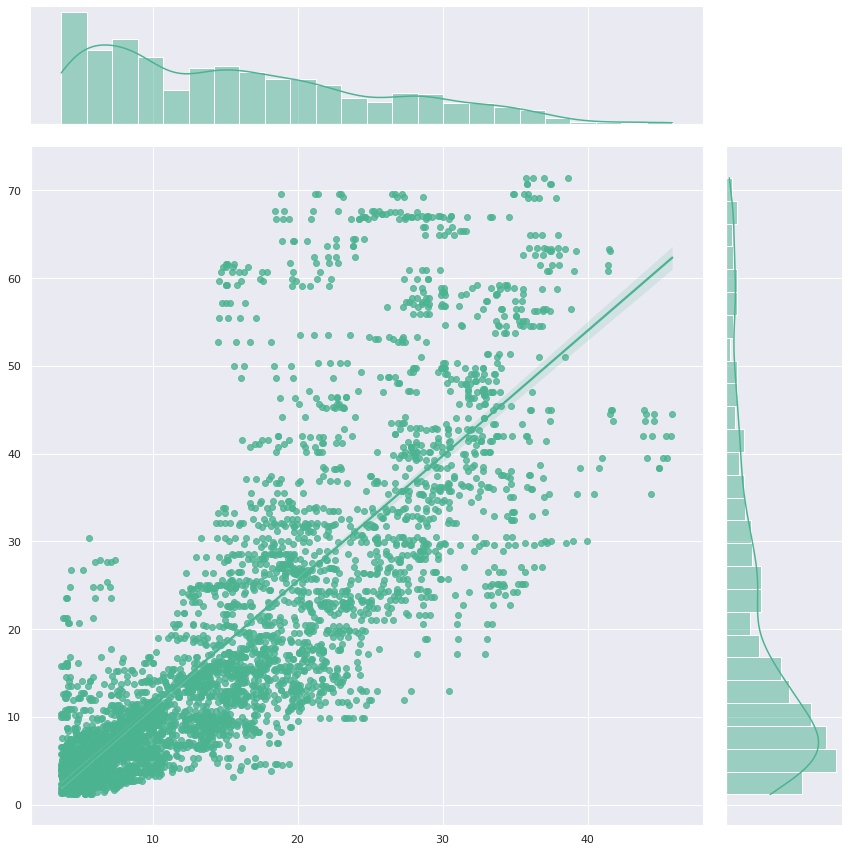

In [ ]:
model_conv, name = create_model_conv(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           dropout_rate= 0.05)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train_2, y_train, 
                                 batch_size = 8, 
                                 epochs = 50, 
                                 modele = model_conv, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_conv, X_test, y_test)

In [ ]:
*a=1

SyntaxError: ignored

In [ ]:
X_train_2 = X_train.to_numpy()
X_train_2=X_train_2.reshape((int(X_train.shape[0]),  int(X_train.shape[1]),1))
X_train_2.shape

X_train_3 = X_train.to_numpy()
X_train_3=X_train_3.reshape((int(X_train.shape[0]), 24, int(X_train.shape[1]/24)))
# print(X_train_3.shape)
# print(X_train_3[0,:,:])
X_train_3=np.transpose(X_train_3, axes=(0,2,1))
# print(X_train_3[0,:,:])
X_train_3=X_train_3.reshape((int(X_train.shape[0]),  int(X_train.shape[1]),1))

X_test_3 = X_test.to_numpy()
X_test_3=X_test_3.reshape((int(X_test.shape[0]), 24, int(X_test.shape[1]/24)))
# print(X_train_3.shape)
# print(X_train_3[0,:,:])
X_test_3=np.transpose(X_test_3, axes=(0,2,1))
# print(X_train_3[0,:,:])
X_test_3=X_test_3.reshape((int(X_test.shape[0]),  int(X_test.shape[1]),1))

# model_conv2, name = create_model_conv(inputs_shape = 4272, 
#                            outputs_shape = 4, 
#                            hidden_shape = (1024, 512, 256, 128, 64, 32, 16, 8), 
#                            dropout = True,

#                            dropout_rate= 0.05)

# version = input('Changement effectué si même réseau de neurones ou version si différent : ')
# loss = keras.losses.MSE
# optimizer = keras.optimizers.RMSprop()

# history, dir_model_h5 = training(X_train_3, y_train, 
#                                  batch_size = 24, 
#                                  epochs = 30, 
#                                  modele = model_conv2, 
#                                  name = name + '_' + version, 
#                                  loss = loss,
#                                  optimizer = optimizer)


# model_evaluate(model_conv2, X_test, y_test)



In [ ]:
np.shape(X_train_3)

(3661, 4272, 1)

In [ ]:
X_train_3[0,0:24]

array([[ 6.944],
       [ 6.111],
       [ 6.944],
       [ 7.5  ],
       [ 7.222],
       [ 6.111],
       [ 3.611],
       [ 6.667],
       [ 5.   ],
       [ 6.111],
       [ 5.556],
       [ 3.889],
       [ 4.722],
       [ 6.389],
       [ 7.778],
       [ 6.111],
       [11.111],
       [13.333],
       [ 6.111],
       [ 6.944],
       [ 5.556],
       [ 5.278],
       [ 3.889],
       [ 3.333]])

In [ ]:
def create_model_conv2(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',kernel_siz = 6,dropout = True, dropout_rate = 0.05,max_pool_size = 2):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    name += '_conv1d_conv1d_flatten'
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)
    # input_shape = (8, 3661, 4272)
    # model.add(layers.Input(shape = (inputs_shape,)))
    # model.add(layers.Reshape((4272, 1), (3661, 4272)))
    # model.add(layers.Conv1D(filters = 64, kernel_size = 6, activation = 'relu', input_shape = (None,4272, 1)))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(layers.MaxPooling1D(pool_size = 2))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(layers.MaxPooling1D(pool_size = 2))
    # model.add(Conv1D(filters = 64, kernel_size = 3, activation = 'relu'))
    # 
    model.add(layers.Flatten())

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]




model_conv3, name = create_model_conv2(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 2)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train_3, y_train, 
                                 batch_size = 12, 
                                 epochs = 30, 
                                 modele = model_conv3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv3, X_test_3, y_test)

Model: "model_EDF_512__conv1d_conv1d_flatten256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 4267, 32)          224       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 2133, 32)         0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 2128, 32)          6176      
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 1064, 32)         0         
 1D)                                                             
                                                                 
 flatten (Flatten)           (None, 34048)             0         
                                                                 

KeyboardInterrupt: ignored

In [ ]:
# Essayer de compenser l'overfitting et d'agrandir le kernel

model_conv3, name = create_model_conv2(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 2)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train_3, y_train, 
                                 batch_size = 12, 
                                 epochs = 30, 
                                 modele = model_conv3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv3, X_test_3, y_test)


In [ ]:
model_evaluate(model_conv3, X_test, y_test)

In [ ]:
Essayer conv 2d sur
X_train_4 = X_train.to_numpy()
X_train_4=X_train_3.reshape((int(X_train.shape[0]), 24, int(X_train.shape[1]/24)))

(61875, 72, 12, 1)


def basic_conv2D(n_filters=10, fsize=5, window_size=5, n_features=2):
 new_model = keras.Sequential()
 new_model.add(tf.keras.layers.Conv2D(n_filters, (1,fsize), padding=”same”, activation=”relu”, input_shape=(window_size, n_features, 1)))


 https://towardsdatascience.com/time-series-forecasting-with-2d-convolutions-4f1a0f33dff6

In [ ]:
model_evaluate(model2, X_test, y_test)

In [ ]:
model_evaluate(model2, X_test, y_test)

In [ ]:
model, name = create_model(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32), 
                           dropout = True)

Model: "model_EDF_1024_512_256_128_64_32_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 1024)              4375552   
                                                                 
 dropout_4 (Dropout)         (None, 1024)              0         
                                                                 
 dense_6 (Dense)             (None, 512)               524800    
                                                                 
 dropout_5 (Dropout)         (None, 512)               0         
                                                                 
 dense_7 (Dense)             (None, 256)               131328    
                                                                 
 dropout_6 (Dropout)         (None, 256)               0         
                                                                 
 dense_8 (Dense)     

In [ ]:
version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train, y_train, 
                                 batch_size = 8, 
                                 epochs = 50, 
                                 modele = model, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

Changement effectué si même réseau de neurones ou version si différent : Plus de couches
Epoch 1/50
458/458 [==============================] - 27s 57ms/step - loss: 256.4016 - val_loss: 159.7024
Epoch 2/50
458/458 [==============================] - 29s 63ms/step - loss: 116.1893 - val_loss: 22.9749
Epoch 3/50
458/458 [==============================] - 28s 60ms/step - loss: 96.6437 - val_loss: 27.2431
Epoch 4/50
458/458 [==============================] - 28s 61ms/step - loss: 80.3062 - val_loss: 22.2001
Epoch 5/50
458/458 [==============================] - 30s 65ms/step - loss: 68.5011 - val_loss: 20.3091
Epoch 6/50
458/458 [==============================] - 27s 60ms/step - loss: 64.1540 - val_loss: 22.3981
Epoch 7/50
458/458 [==============================] - 27s 60ms/step - loss: 65.2726 - val_loss: 39.4818
Epoch 8/50
458/458 [==============================] - 27s 59ms/step - loss: 59.5595 - val_loss: 39.7141
Epoch 9/50
458/458 [==============================] - 28s 61ms/step - loss: 

32/32 [==============================] - 1s 13ms/step
[ 9.64 11.36 12.26 ...  3.93  3.78  3.69]
[12.408611  12.229371  12.241525  ...  5.4956436  5.5603976  5.7070026]
Variance Score = 0.6510569682601676
Moyenne des biais = -4.969136170375078
r2 score = 0.5635132202759461
RMSE score = 123.11408857930266
Root Mean Absolute Percentage Error = 42.94749469120799


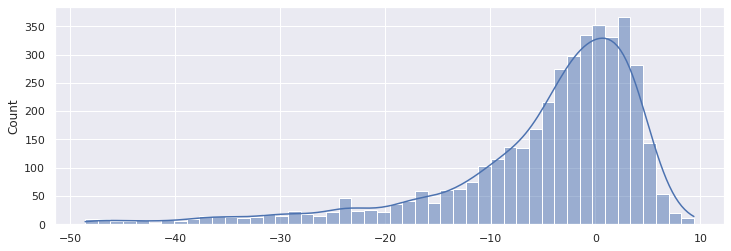

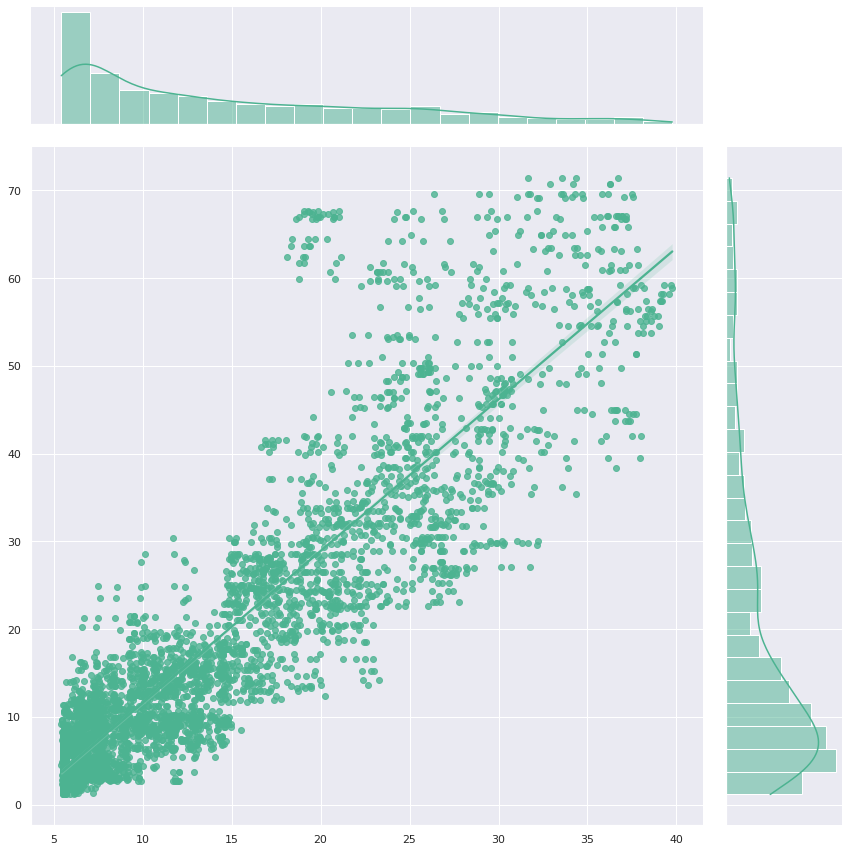

In [ ]:
model_evaluate(model, X_test, y_test)

Model: "model_EDF_1024_512_256_128_64_32_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_46 (Dense)            (None, 1024)              4375552   
                                                                 
 dropout_38 (Dropout)        (None, 1024)              0         
                                                                 
 dense_47 (Dense)            (None, 512)               524800    
                                                                 
 dropout_39 (Dropout)        (None, 512)               0         
                                                                 
 dense_48 (Dense)            (None, 256)               131328    
                                                                 
 dropout_40 (Dropout)        (None, 256)               0         
                                                                 
 dense_49 (Dense)    

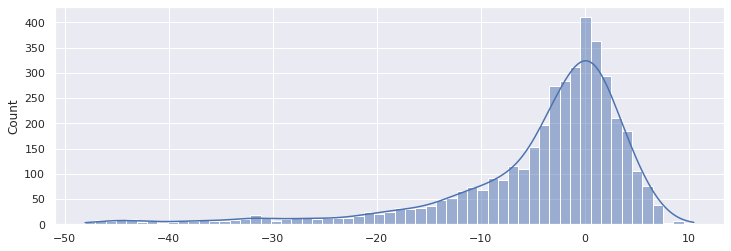

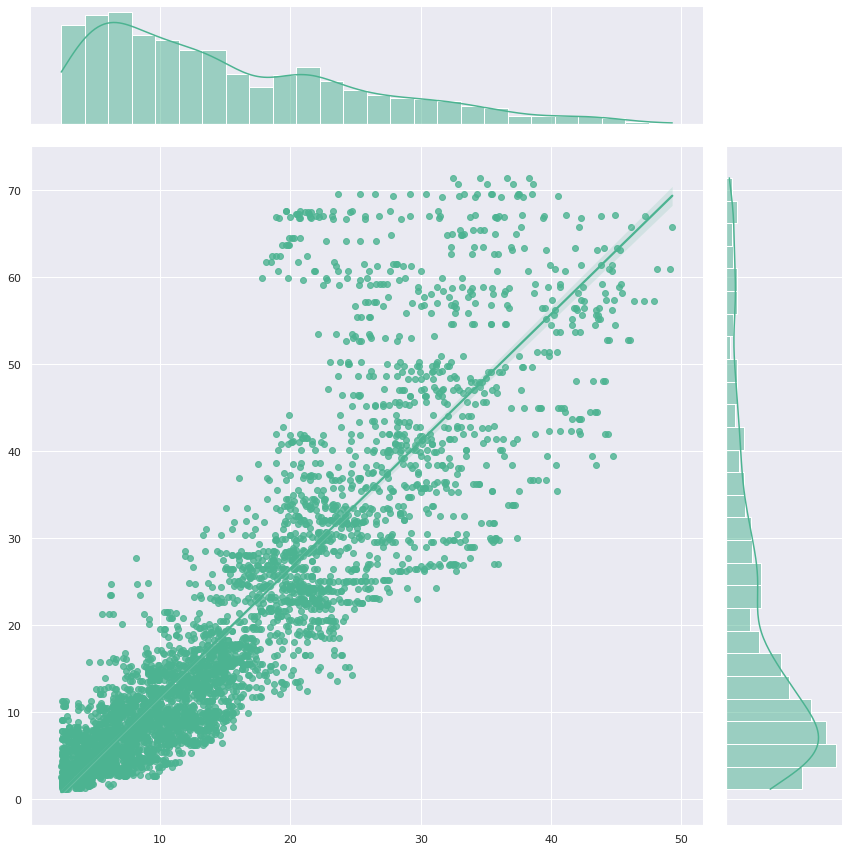

In [ ]:
model_drop, name = create_model(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32), 
                           dropout = True,
                           dropout_rate= 0.05)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train, y_train, 
                                 batch_size = 8, 
                                 epochs = 50, 
                                 modele = model_drop, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_drop, X_test, y_test)

In [ ]:
model3, name = create_model(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True)

Model: "model_EDF_1024_512_256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_37 (Dense)            (None, 1024)              4375552   
                                                                 
 dropout_30 (Dropout)        (None, 1024)              0         
                                                                 
 dense_38 (Dense)            (None, 512)               524800    
                                                                 
 dropout_31 (Dropout)        (None, 512)               0         
                                                                 
 dense_39 (Dense)            (None, 256)               131328    
                                                                 
 dropout_32 (Dropout)        (None, 256)               0         
                                                                 
 dense_40 (Dense

In [ ]:
version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train, y_train, 
                                 batch_size = 8, 
                                 epochs = 50, 
                                 modele = model3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

Changement effectué si même réseau de neurones ou version si différent : plus de couches
Epoch 1/50
458/458 [==============================] - 29s 61ms/step - loss: 370.5139 - val_loss: 39.2975
Epoch 2/50
458/458 [==============================] - 29s 63ms/step - loss: 169.1359 - val_loss: 22.0723
Epoch 3/50
458/458 [==============================] - 27s 59ms/step - loss: 129.5637 - val_loss: 20.1390
Epoch 4/50
458/458 [==============================] - 31s 68ms/step - loss: 105.9170 - val_loss: 29.4926
Epoch 5/50
458/458 [==============================] - 28s 61ms/step - loss: 95.7672 - val_loss: 20.8341
Epoch 6/50
458/458 [==============================] - 25s 54ms/step - loss: 85.9003 - val_loss: 23.4709
Epoch 7/50
458/458 [==============================] - 25s 55ms/step - loss: 80.2193 - val_loss: 27.2688
Epoch 8/50
458/458 [==============================] - 24s 52ms/step - loss: 72.6383 - val_loss: 32.6208
Epoch 9/50
458/458 [==============================] - 26s 56ms/step - loss:

32/32 [==============================] - 1s 23ms/step
[ 9.64 11.36 12.26 ...  3.93  3.78  3.69]
[14.176854  14.151363  14.153473  ...  6.0459366  6.088703   6.2962446]
Variance Score = 0.6768672499537183
Moyenne des biais = -3.0638679703475216
r2 score = 0.6435857084668936
RMSE score = 100.52909434388111
Root Mean Absolute Percentage Error = 47.00294959766691


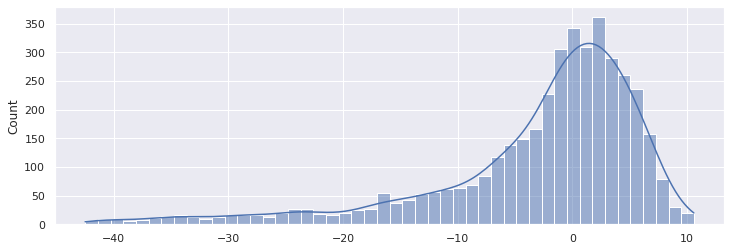

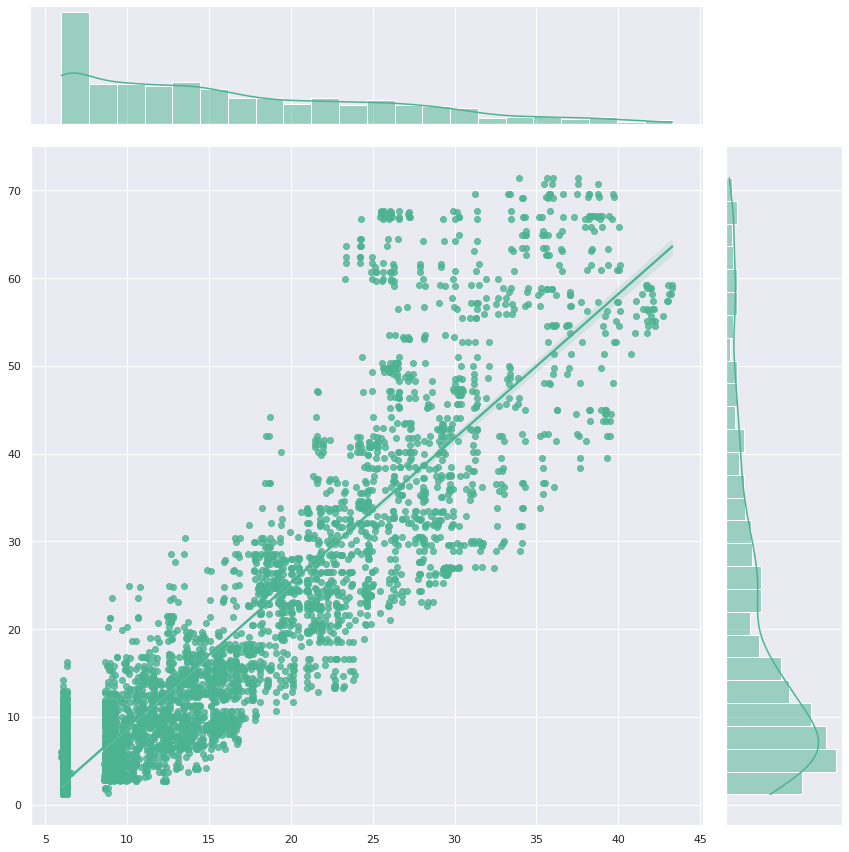

In [ ]:
model_evaluate(model3, X_test, y_test)




Model: "model_EDF_1024_512_256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_85 (Dense)            (None, 1024)              4375552   
                                                                 
 dropout_72 (Dropout)        (None, 1024)              0         
                                                                 
 dense_86 (Dense)            (None, 512)               524800    
                                                                 
 dropout_73 (Dropout)        (None, 512)               0         
                                                                 
 dense_87 (Dense)            (None, 256)               131328    
                                                                 
 dropout_74 (Dropout)        (None, 256)               0         
                                                                 
 dense_88 (Dense

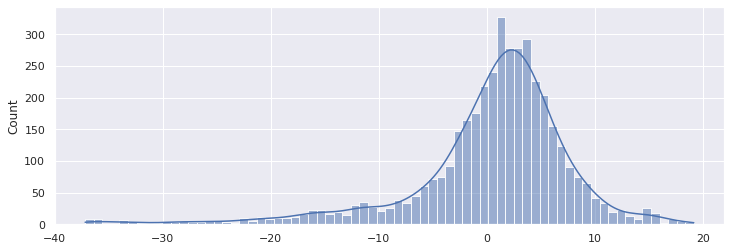

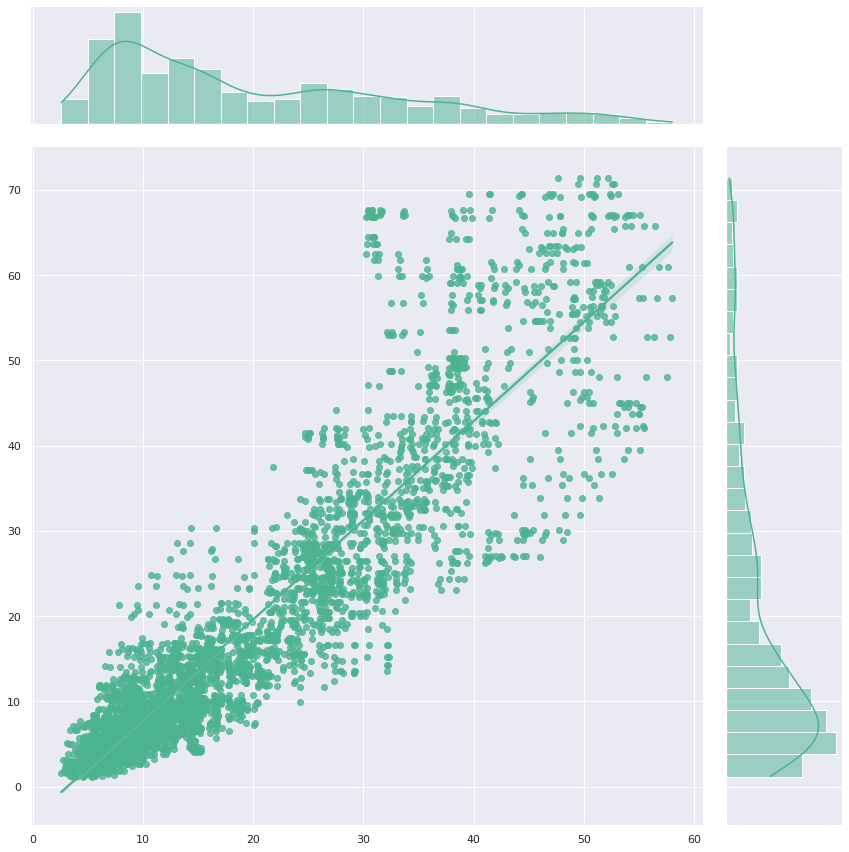

In [ ]:
def create_model(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',dropout = True, dropout_rate = 0.01):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)

    model.add(layers.Input(shape = (inputs_shape,)))

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]



model_drop, name = create_model(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train, y_train, 
                                 batch_size = 8, 
                                 epochs = 50, 
                                 modele = model_drop, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_drop, X_test, y_test)

Model: "model_EDF_2048_1024_512_256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_114 (Dense)           (None, 2048)              8751104   
                                                                 
 dropout_98 (Dropout)        (None, 2048)              0         
                                                                 
 dense_115 (Dense)           (None, 1024)              2098176   
                                                                 
 dropout_99 (Dropout)        (None, 1024)              0         
                                                                 
 dense_116 (Dense)           (None, 512)               524800    
                                                                 
 dropout_100 (Dropout)       (None, 512)               0         
                                                                 
 dense_117 

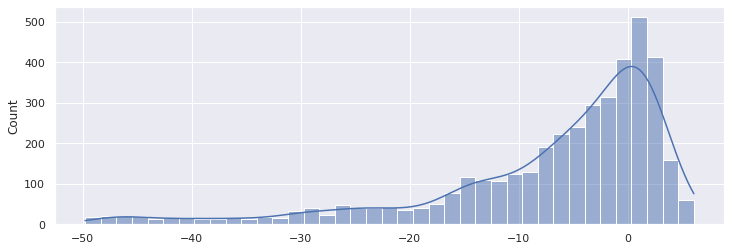

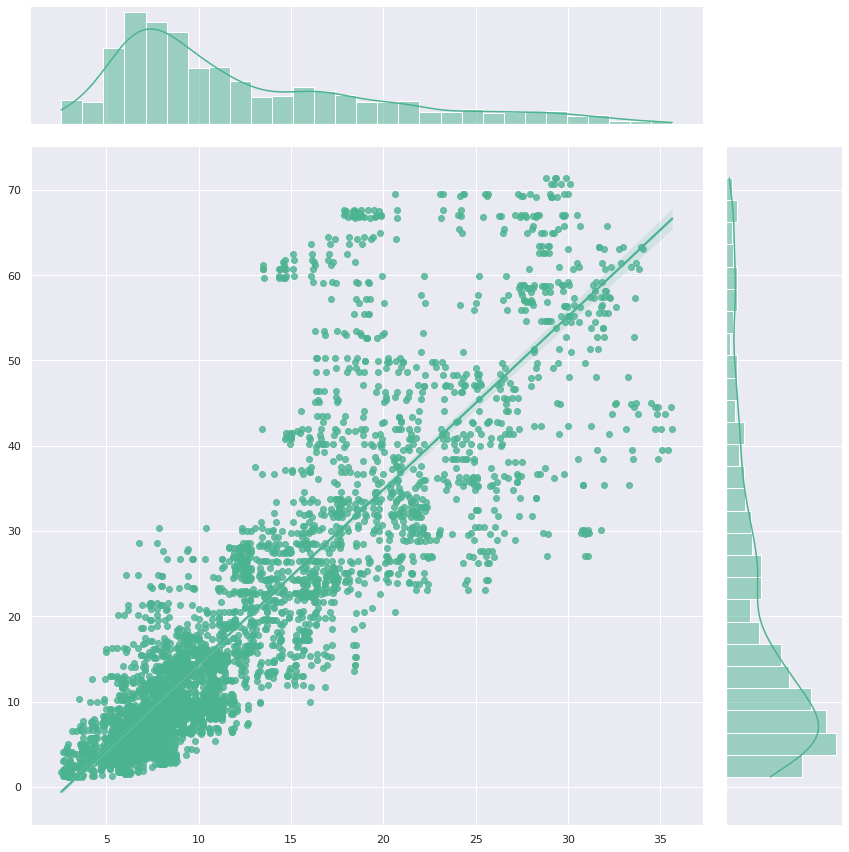

In [ ]:
model_drop, name = create_model(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (2048,1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train, y_train, 
                                 batch_size = 16, 
                                 epochs = 50, 
                                 modele = model_drop, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_drop, X_test, y_test)

In [ ]:
# model_evaluate(model_drop, X_test, y_test)

In [ ]:
def create_model_reg(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',dropout = True, dropout_rate = 0.1):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)

    model.add(layers.Input(shape = (inputs_shape,)))

    for l in range(len(hidden_shape)):
      # if hidden_shape[l] ==256:
        # model.add(layers.ActivityRegularization(l1=0.001, l2=0.000))

      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      
      if dropout:
        model.add(layers.Dropout(dropout_rate))
      
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]

In [ ]:
model_drop_reg, name = create_model_reg(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train, y_train, 
                                 batch_size = 8, 
                                 epochs = 50, 
                                 modele = model_drop_reg, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_drop_reg, X_test, y_test)

Model: "model_EDF_1024_512_256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13 (Dense)            (None, 1024)              4375552   
                                                                 
 dropout_11 (Dropout)        (None, 1024)              0         
                                                                 
 dense_14 (Dense)            (None, 512)               524800    
                                                                 
 dropout_12 (Dropout)        (None, 512)               0         
                                                                 
 dense_15 (Dense)            (None, 256)               131328    
                                                                 
 dropout_13 (Dropout)        (None, 256)               0         
                                                                 
 dense_16 (Dense

NameError: ignored

32/32 [==============================] - 1s 13ms/step
[ 9.64 11.36 12.26 ...  3.93  3.78  3.69]
[12.391922  12.330241  12.383911  ...  4.969197   5.0477486  5.2030334]
Variance Score = 0.7391025460149634
Moyenne des biais = -2.096772836401047
r2 score = 0.7235154179557859
RMSE score = 77.98437182020115
Root Mean Absolute Percentage Error = 41.58431044483733


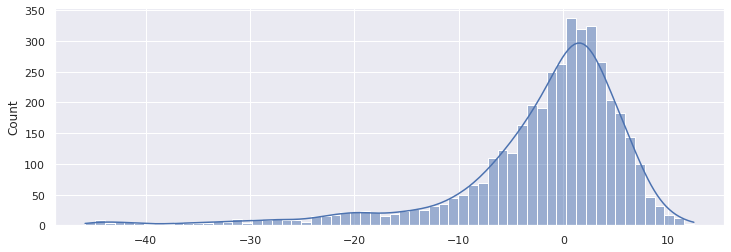

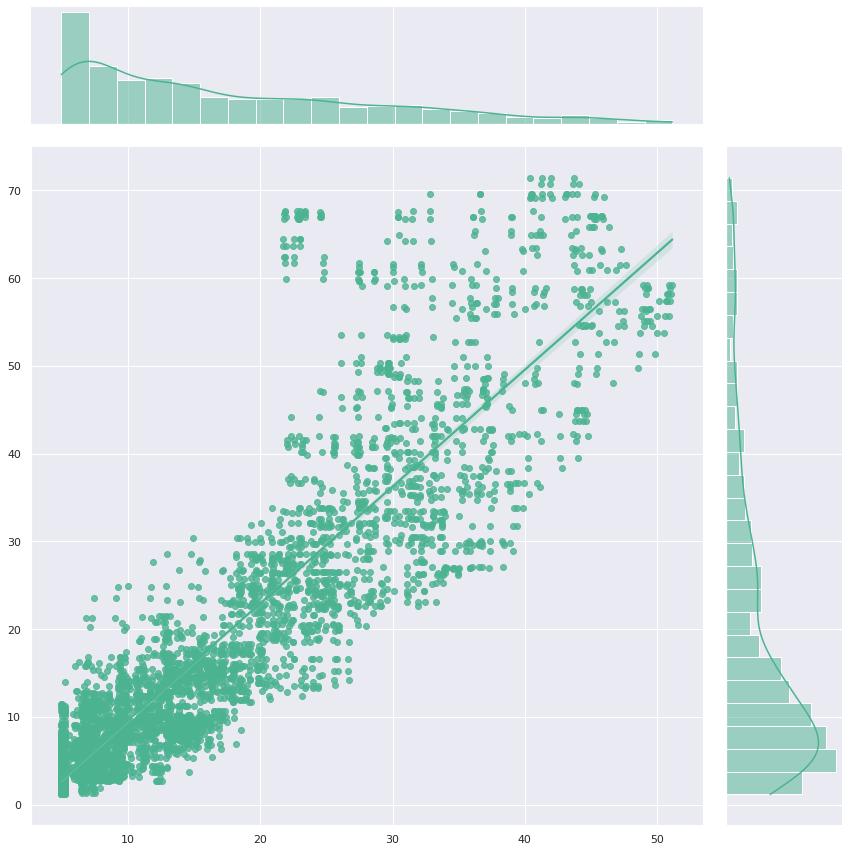

In [ ]:
model_evaluate(model_drop_reg, X_test, y_test)

In [ ]:
Next steps

https://keras.io/api/layers/regularizers/
ajouter directement de la régularization dans les couches denses

https://keras.io/api/layers/regularization_layers/
Layers dédiés à la régularisation


Add 1 / 2 conv 1d layer in the beginning, need to edit the input size
https://stackoverflow.com/questions/49739356/keras-convolutional-layer-for-1d-input

probablement besoin de passer par numpy et de changer la dim 3661, 4272  en  3661, 4272 1

https://kitchell.github.io/DeepLearningTutorial/4cnnsinkeras.html

https://stackoverflow.com/questions/70062410/input-shape-of-conv1d-layer-keras

Per the documentation, the Conv1D layer takes an input of shape
(samples, steps, input_dim). The first one is implied, so Input has
the shape (steps, input_dim). Here, "steps" is the length of your
input vector (the number of words in a sentence). If you want to keep
it variable, you can also set it to None, but then Flatten + Dense
wouldn't be legal layers

Idée avoir 



X_train2 = nombre de lignes, 24, 178


Eventuellement, ajouter la température


LSTM

model.add(tf.keras.layers.MaxPooling1D(2, padding="same"))

model.add(tf.keras.layers.LSTM(64, activation="tanh"))
model.add(tf.keras.layers.Flatten())



Model: "model_EDF_1024_512_256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_22 (Dense)            (None, 1024)              4375552   
                                                                 
 dropout_19 (Dropout)        (None, 1024)              0         
                                                                 
 dense_23 (Dense)            (None, 512)               524800    
                                                                 
 dropout_20 (Dropout)        (None, 512)               0         
                                                                 
 dense_24 (Dense)            (None, 256)               131328    
                                                                 
 dropout_21 (Dropout)        (None, 256)               0         
                                                                 
 dense_25 (Dense

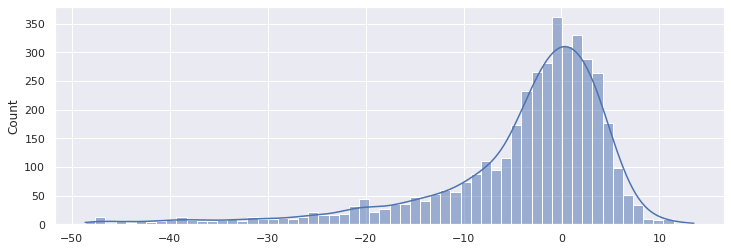

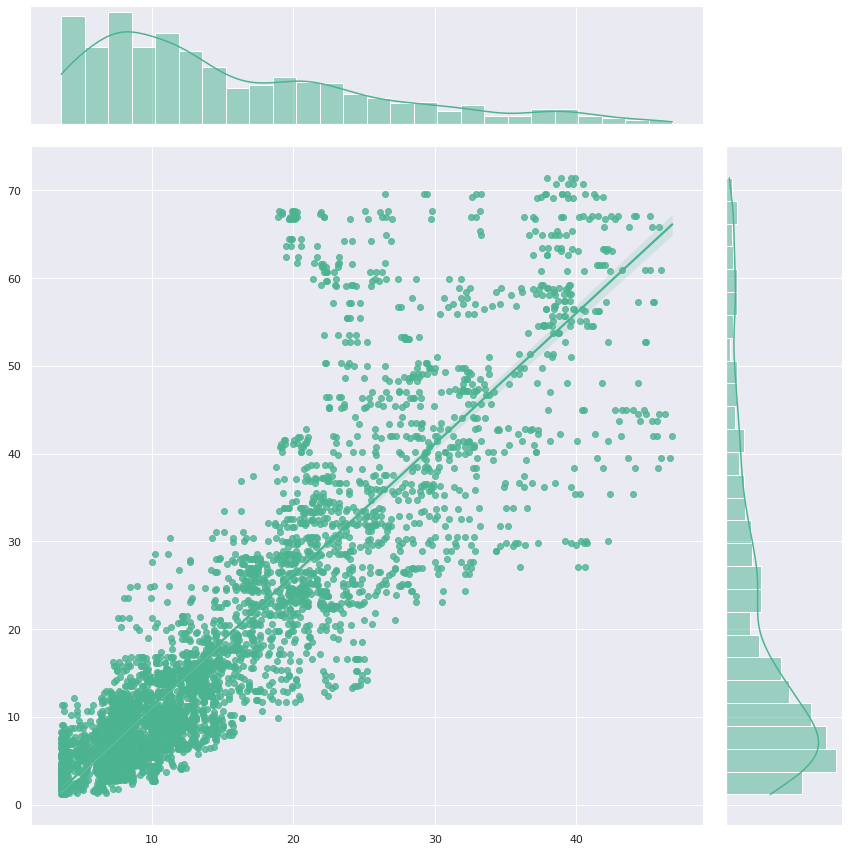

In [ ]:



model_drop, name = create_model(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)


version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train, y_train, 
                                 batch_size = 8, 
                                 epochs = 50, 
                                 modele = model_drop, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_drop, X_test, y_test)

In [ ]:
LSTM

In [ ]:
def create_model_conv(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',kernel_siz = 6,dropout = True, dropout_rate = 0.05,max_pool_size = 2):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    name += '_conv1d_conv1d_flatten'
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)
    # input_shape = (8, 3661, 4272)
    # model.add(layers.Input(shape = (inputs_shape,)))
    # model.add(layers.Reshape((4272, 1), (3661, 4272)))
    # model.add(layers.Conv1D(filters = 64, kernel_size = 6, activation = 'relu', input_shape = (None,4272, 1)))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    # model.add(layers.MaxPooling1D(pool_size = 2))

    model.add(tf.keras.layers.MaxPooling1D(2, padding="same"))

    model.add(tf.keras.layers.LSTM(64, activation="tanh"))
    # model.add(tf.keras.layers.Flatten())
    # model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    # model.add(layers.MaxPooling1D(pool_size = 2))
    # model.add(Conv1D(filters = 64, kernel_size = 3, activation = 'relu'))
    # 
    model.add(layers.Flatten())

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]

Model: "model_EDF_512__conv1d_conv1d_flatten256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 4267, 32)          224       
                                                                 
 max_pooling1d_7 (MaxPooling  (None, 2133, 32)         0         
 1D)                                                             
                                                                 
 max_pooling1d_8 (MaxPooling  (None, 1067, 32)         0         
 1D)                                                             
                                                                 
 lstm_3 (LSTM)               (None, 64)                24832     
                                                                 
 flatten_4 (Flatten)         (None, 64)                0         
                                                                 

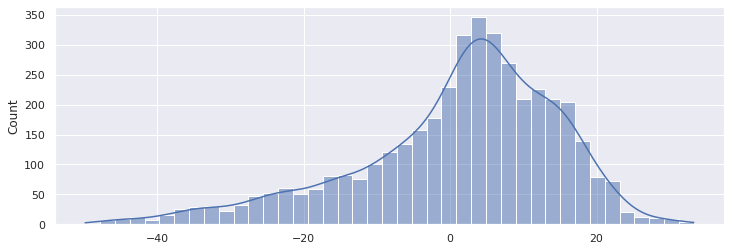

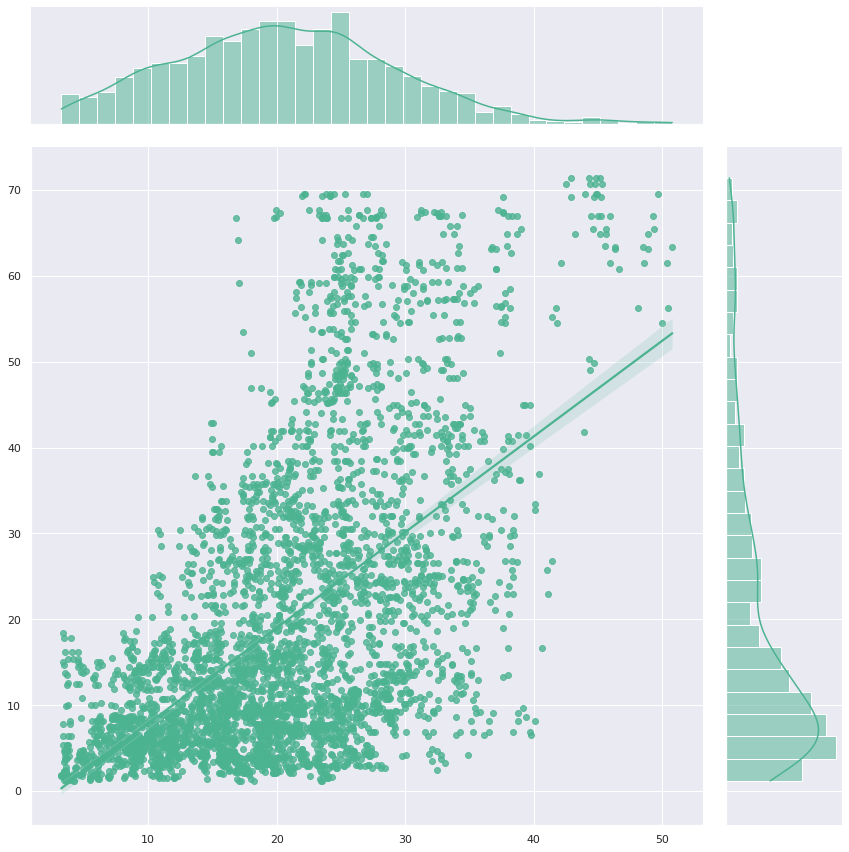

In [ ]:


model_conv_lstm, name = create_model_conv_lstm(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 2)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train_3, y_train, 
                                 batch_size = 16, 
                                 epochs = 25, 
                                 modele = model_conv_lstm, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv_lstm, X_test, y_test)

32/32 [==============================] - 6s 153ms/step
[ 9.64 11.36 12.26 ...  3.93  3.78  3.69]
[23.43434  23.264244 23.317225 ... 11.432948 11.165135 11.415269]
Variance Score = 0.4370230044134794
Moyenne des biais = -5.075924048058052
r2 score = 0.34567615559761167
RMSE score = 184.5565260653098
Root Mean Absolute Percentage Error = 63.151167030951804


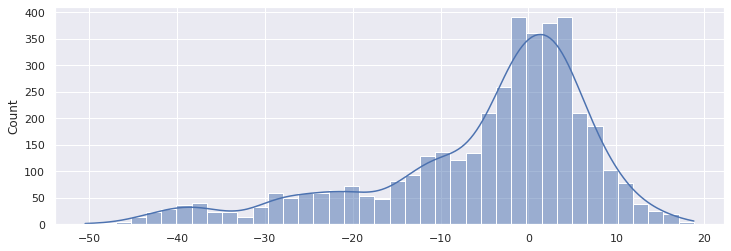

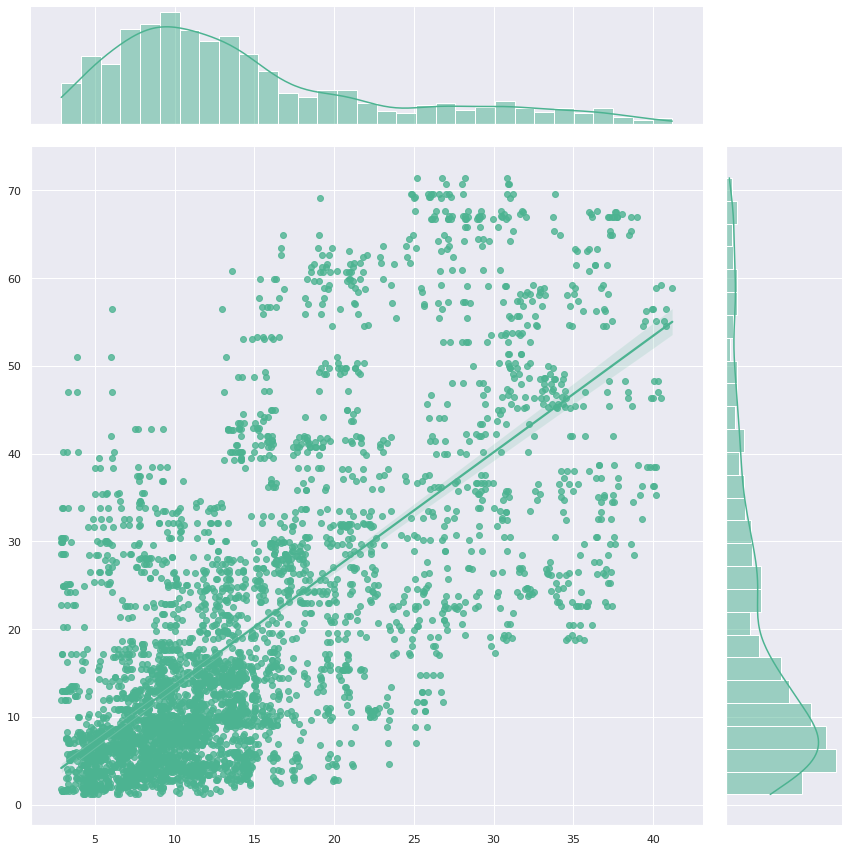

In [ ]:
model_evaluate(model_conv_lstm, X_test_3, y_test)

In [ ]:
def create_model_conv_lstm2(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',kernel_siz = 6,dropout = True, dropout_rate = 0.05,max_pool_size = 2):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    name += '_conv1d_conv1d_flatten'
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)
    # input_shape = (8, 3661, 4272)
    # model.add(layers.Input(shape = (inputs_shape,)))
    # model.add(layers.Reshape((4272, 1), (3661, 4272)))
    # model.add(layers.Conv1D(filters = 64, kernel_size = 6, activation = 'relu', input_shape = (None,4272, 1)))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(tf.keras.layers.MaxPooling1D(2, padding="same"))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(tf.keras.layers.MaxPooling1D(2, padding="same"))

    model.add(tf.keras.layers.LSTM(64, activation="tanh", return_sequences=True))
    # model.add(tf.keras.layers.LSTM(64, activation="tanh", return_sequences=True))

    model.add(layers.Flatten())

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]

Model: "model_EDF_128__conv1d_conv1d_flatten64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 4267, 32)          224       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 2134, 32)         0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 2129, 32)          6176      
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 1065, 32)         0         
 1D)                                                             
                                                                 
 lstm (LSTM)                 (None, 1065, 64)          24832     
                                                                 
 flatte

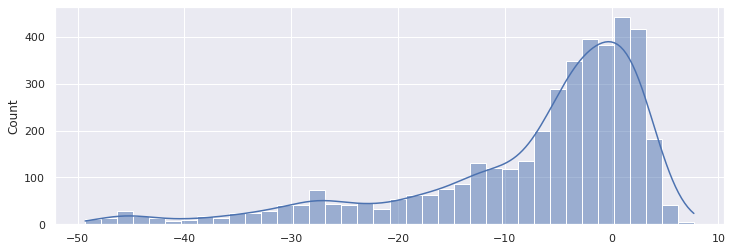

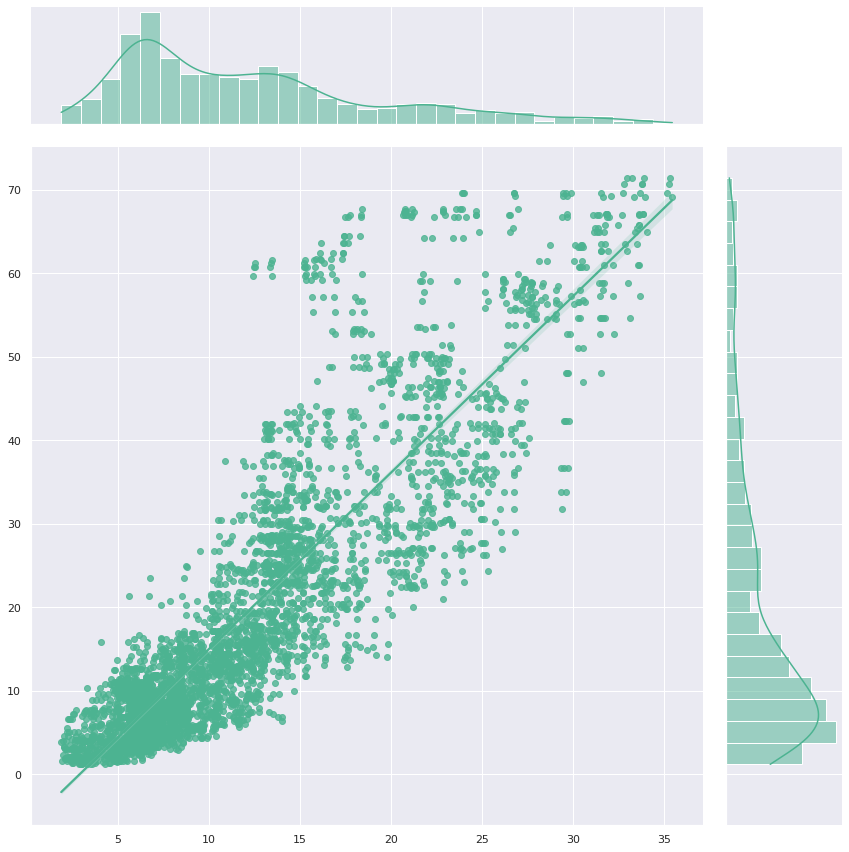

In [ ]:
model_conv_lstm2, name = create_model_conv_lstm2(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (  128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.1,
                           max_pool_size = 2)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train_3, y_train, 
                                 batch_size = 16, 
                                 epochs = 15, 
                                 modele = model_conv_lstm2, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv_lstm2, X_test_3, y_test)

In [ ]:
model_conv_lstm2, name = create_model_conv_lstm2(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (  128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.1,
                           max_pool_size = 2)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train_3, y_train, 
                                 batch_size = 16, 
                                 epochs = 25, 
                                 modele = model_conv_lstm2, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv_lstm2, X_test_3, y_test)

Model: "model_EDF_128__conv1d_conv1d_flatten64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 4267, 32)          224       
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 2134, 32)         0         
 1D)                                                             
                                                                 
 conv1d_3 (Conv1D)           (None, 2129, 32)          6176      
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 1065, 32)         0         
 1D)                                                             
                                                                 
 lstm_1 (LSTM)               (None, 1065, 64)          24832     
                                                                 
 flatte

KeyboardInterrupt: ignored

32/32 [==============================] - 7s 199ms/step
[ 9.64 11.36 12.26 ...  3.93  3.78  3.69]
[8.622256  8.485796  8.57115   ... 6.2258368 6.322427  6.425918 ]
Variance Score = 0.5562838951691014
Moyenne des biais = -7.368800964208948
r2 score = 0.3637722558270253
RMSE score = 179.45239693683442
Root Mean Absolute Percentage Error = 40.8402671664212


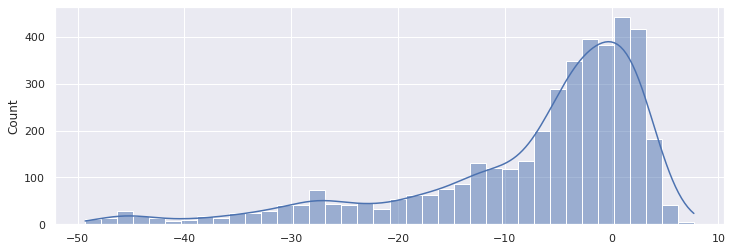

In [ ]:
model_evaluateb(model_conv_lstm2, X_test_3, y_test)






# To KEEEP for LSTM

In [ ]:

def create_model_conv2(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',kernel_siz = 6,dropout = True, dropout_rate = 0.05,max_pool_size = 2):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    name += '_conv1d_conv1d_flatten'
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)
    # input_shape = (8, 3661, 4272)
    # model.add(layers.Input(shape = (inputs_shape,)))
    # model.add(layers.Reshape((4272, 1), (3661, 4272)))
    # model.add(layers.Conv1D(filters = 64, kernel_size = 6, activation = 'relu', input_shape = (None,4272, 1)))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(layers.MaxPooling1D(pool_size = 2))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(layers.MaxPooling1D(pool_size = 2))
    # model.add(Conv1D(filters = 64, kernel_size = 3, activation = 'relu'))
    # 
    model.add(layers.Flatten())

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]


Model: "model_EDF_512__conv1d_conv1d_flatten256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_6 (Conv1D)           (None, 4267, 32)          224       
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 2133, 32)         0         
 1D)                                                             
                                                                 
 conv1d_7 (Conv1D)           (None, 2128, 32)          6176      
                                                                 
 max_pooling1d_7 (MaxPooling  (None, 1064, 32)         0         
 1D)                                                             
                                                                 
 flatten_3 (Flatten)         (None, 34048)             0         
                                                                 

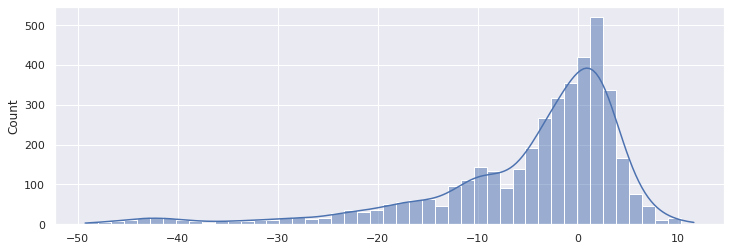

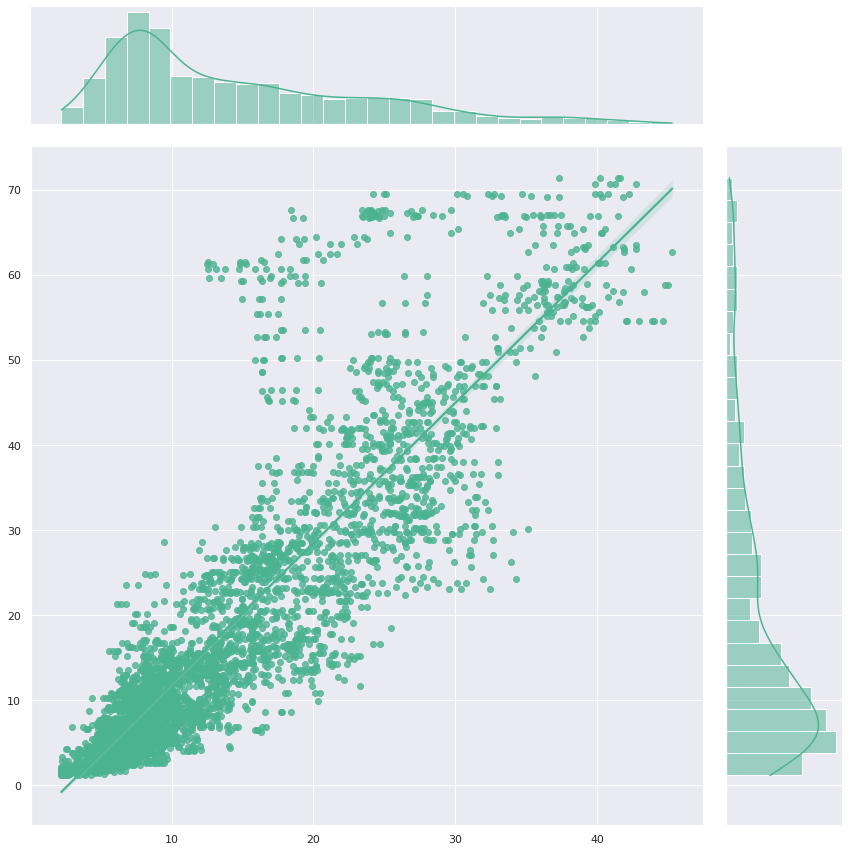

In [ ]:


def create_model_conv2(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',kernel_siz = 6,dropout = True, dropout_rate = 0.05,max_pool_size = 2):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    name += '_conv1d_conv1d_flatten'
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)
    # input_shape = (8, 3661, 4272)
    # model.add(layers.Input(shape = (inputs_shape,)))
    # model.add(layers.Reshape((4272, 1), (3661, 4272)))
    # model.add(layers.Conv1D(filters = 64, kernel_size = 6, activation = 'relu', input_shape = (None,4272, 1)))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(layers.MaxPooling1D(pool_size = 2))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(layers.MaxPooling1D(pool_size = 2))
    # model.add(Conv1D(filters = 64, kernel_size = 3, activation = 'relu'))
    # 
    model.add(layers.Flatten())

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]




model_conv3, name = create_model_conv2(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 2)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train_3, y_train, 
                                 batch_size = 12, 
                                 epochs = 30, 
                                 modele = model_conv3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv3, X_test_3, y_test)

In [ ]:
******************************************
******************************************
CONV au dessus

In [ ]:
def model_evaluateb(model, X, y):

  y_pred = model.predict(X)
  y_array = y.values

  y_true_ravel = np.ravel(y_array)
  y_pred_ravel = np.ravel(y_pred)

  print(y_true_ravel)
  print(y_pred_ravel)

  biais_array = y_pred_ravel - y_true_ravel

  ecart_relatif = (abs(y_pred_ravel - y_true_ravel) / y_true_ravel)*100
  sns.set(rc={'figure.figsize':(12,4)})

  print(f'Variance Score = {metrics.explained_variance_score(y_true_ravel, y_pred_ravel)}')
  print(f'Moyenne des biais = {biais_array.mean()}')
  print(f'r2 score = {metrics.r2_score(y_true_ravel, y_pred_ravel)}')
  print(f'RMSE score = {metrics.mean_squared_error(y_true_ravel, y_pred_ravel)}')

  print(f'Root Mean Absolute Percentage Error = {mean_absolute_percentage_error(y_true_ravel, y_pred_ravel)}')
  sns.histplot(x = biais_array, kde = True)
  sns.jointplot(x=y_pred_ravel, y=y_true_ravel, kind="reg", color="#4CB391", height = 12)

In [ ]:
LSTM

model.add(tf.keras.layers.MaxPooling1D(2, padding="same"))

model.add(tf.keras.layers.LSTM(64, activation="tanh"))
model.add(tf.keras.layers.Flatten())


    # model.add(layers.Input(shape = (inputs_shape,)))
    # model.add(LSTM(150))
    # model.add(RepeatVector(n_timesteps_in))
    # model.add(LSTM(150, return_sequences=True))


In [ ]:
y_test

,0,1,2,3
4068,9.64,11.36,12.26,13.41
4069,11.36,12.26,13.41,12.90
4070,12.26,13.41,12.90,10.61
4071,13.41,12.90,10.61,6.83
4072,12.90,10.61,6.83,4.20
...,...,...,...,...
5080,5.80,4.36,3.70,4.01
5081,4.36,3.70,4.01,4.27
5082,3.70,4.01,4.27,3.93
5083,4.01,4.27,3.93,3.78


In [ ]:
Variance Score = 0.6510569682601676
Moyenne des biais = -4.969136170375078
r2 score = 0.5635132202759461
RMSE score = 123.11408857930266
Root Mean Absolute Percentage Error = 42.94749469120799



Variance Score = 0.6910192661800201
Moyenne des biais = -4.336421062430567
r2 score = 0.6243499147336904
RMSE score = 105.95468183832928
Root Mean Absolute Percentage Error = 33.682987635307235


model_drop, name = create_model(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32), 
                           dropout = True,
                           dropout_rate= 0.05)

32/32 [==============================] - 1s 23ms/step
[ 9.64 11.36 12.26 ...  3.93  3.78  3.69]
[14.176854  14.151363  14.153473  ...  6.0459366  6.088703   6.2962446]
Variance Score = 0.6768672499537183
Moyenne des biais = -3.0638679703475216
r2 score = 0.6435857084668936
RMSE score = 100.52909434388111
Root Mean Absolute Percentage Error = 47.00294959766691



Best
model_drop, name = create_model(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32,16), 
                           dropout = True,
                           dropout_rate= 0.05)

Variance Score = 0.7038343345094525
Moyenne des biais = -2.38133616295536
r2 score = 0.6837293031678588
RMSE score = 89.20631825194373
Root Mean Absolute Percentage Error = 42.72071231633697


model_drop, name = create_model(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (2048,1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train, y_train, 
                                 batch_size = 16, 
[8.432266  8.4434805 8.435948  ... 5.4932876 5.492586  5.5931244]
Variance Score = 0.5535640172930318
Moyenne des biais = -7.08142988921384
r2 score = 0.37577486489827006
RMSE score = 176.06697876377046
Root Mean Absolute Percentage Error = 40.78728574917865


BEST
model_drop, name = create_model(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)
Variance Score = 0.7995923967768126
Moyenne des biais = 0.3974188918748554
r2 score = 0.7990324324557556
RMSE score = 56.684280169609934
Root Mean Absolute Percentage Error = 44.081613585616836



Best of 07/12 _ le meilleur sans conv ou
model_drop_reg, name = create_model_reg(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)
[ 9.64 11.36 12.26 ...  3.93  3.78  3.69]
[12.391922  12.330241  12.383911  ...  4.969197   5.0477486  5.2030334]
Variance Score = 0.7391025460149634
Moyenne des biais = -2.096772836401047
r2 score = 0.7235154179557859
RMSE score = 77.98437182020115
Root Mean Absolute Percentage Error = 41.58431044483733

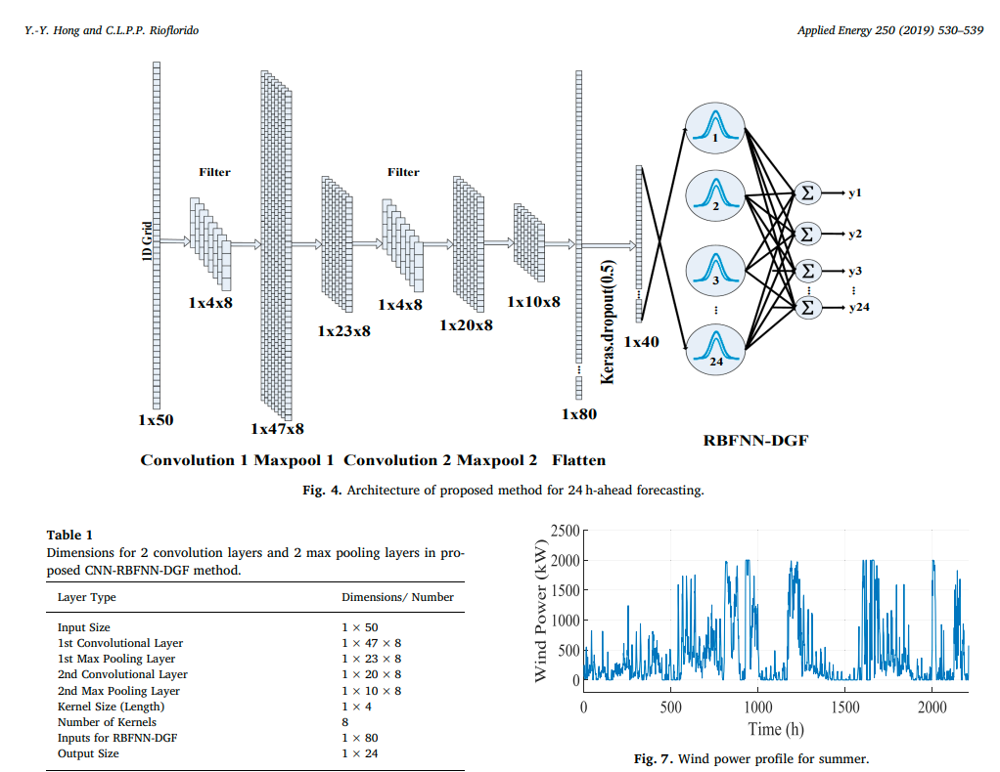

In [ ]:
X_train.shape
4272/24

178.0

In [ ]:
X_train[0:178]

In [ ]:
X_train_2 = X_train[:,0:178]

TypeError: ignored

In [ ]:
X_train.iloc[:, 0:178]

,0,1,2,3,4,5,6,7,8,9,...,168,169,170,171,172,173,174,175,176,177
0,6.944,7.778,2.268926,4.722,1.125752,2.778,1.944000,2.278643,1.729804,2.873644,...,6.389,4.334085,0.887410,7.222,3.056,5.278,5.000,3.889,1.389,3.333
1,6.111,7.500,2.350154,5.278,0.860120,3.333,2.500000,2.521918,1.661966,2.998167,...,7.222,3.667483,0.745221,6.111,3.056,5.000,4.444,3.611,0.556,4.167
2,6.944,8.333,2.595520,4.722,0.977494,2.778,2.500000,2.818527,1.658830,3.329714,...,6.111,3.896537,0.711685,4.722,3.889,7.222,3.889,4.167,0.000,4.722
3,7.500,7.778,1.503164,2.778,0.272683,2.222,2.222000,3.127415,1.558748,3.223255,...,4.167,4.114505,0.756543,4.444,3.889,4.722,3.333,3.889,0.000,3.611
4,7.222,7.778,2.266351,2.500,0.905548,1.944,0.833000,3.306019,1.893455,3.741941,...,5.278,4.040556,1.306770,4.722,5.833,6.944,3.611,4.722,0.556,3.056
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3656,2.222,3.889,2.500000,3.333,1.111000,1.111,1.315650,2.500000,3.611000,6.667000,...,3.889,3.056000,0.556000,6.389,5.278,3.056,1.389,0.556,1.389,2.222
3657,1.389,3.889,2.778000,3.611,1.111000,1.667,1.804259,4.167000,3.611000,6.111000,...,5.556,4.167000,0.833000,5.278,6.389,2.222,1.389,2.222,1.389,1.944
3658,2.222,1.944,2.222000,3.333,3.056000,1.944,1.891417,4.444000,5.000000,5.278000,...,5.000,4.444000,0.833000,6.667,4.444,3.333,2.778,2.500,1.111,3.333
3659,2.778,2.500,0.833000,4.167,3.056000,1.944,2.461625,3.611000,3.611000,5.278000,...,6.389,4.167000,0.833000,6.389,5.000,3.889,1.944,1.667,2.222,3.333


In [ ]:
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
# X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))

ValueError: ignored

Objectif

conv 1 D *2 + 
Max pooling

LSTM *2   https://www.kaggle.com/code/kmkarakaya/keras-lstm-explained-in-details/notebook

Dense

In [ ]:
def create_model_2(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',dropout = True):
    name = 'model_EDF_v2'
    # name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    
    # for index in range(1, len(hidden_shape)):
    #   name = name + str(hidden_shape[index])+ '_'
    
    # name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)
    model.add(layers.Input(shape = (inputs_shape,)))

    # model.add(tf.keras.layers.RepeatVector(12))
    # model.add(tf.keras.layers.Conv1D(178, 2, activation="relu", padding="same", name="convLayer"))

    # model.add(tf.keras.layers.Conv1D(filters=128, kernel_size=3, activation='relu', input_shape=(12, 1)))   

    # model.add(tf.keras.layers.Flatten())
    
# model.add(Conv1D(filters=128, kernel_size=2, activation='relu'))
# model.add(Conv1D(filters=128, kernel_size=2, activation='relu'))
    # model.add(tf.keras.MaxPooling1D(pool_size=2))


# https://www.kaggle.com/code/hassanamin/time-series-analysis-using-lstm-keras/notebook

    # model.add(layers.Input(shape = (inputs_shape,)))
    # model.add(LSTM(150))
    # model.add(RepeatVector(n_timesteps_in))
    # model.add(LSTM(150, return_sequences=True))

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(0.1))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]

In [ ]:
model_conv, name = create_model_2(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128), 
                           dropout = True)

ValueError: ignored

In [ ]:
version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train, y_train, 
                                 batch_size = 8, 
                                 epochs = 50, 
                                 modele = model_conv, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

Changement effectué si même réseau de neurones ou version si différent : conv
Epoch 1/50


ValueError: ignored

In [ ]:
X_train_2 = X_train.to_numpy()
X_train_2=X_train_2.reshape((int(X_train.shape[0]),  int(X_train.shape[1]),1))
X_train_2.shape

X_train_3 = X_train.to_numpy()
X_train_3=X_train_3.reshape((int(X_train.shape[0]), 24, int(X_train.shape[1]/24)))
# print(X_train_3.shape)
# print(X_train_3[0,:,:])
X_train_3=np.transpose(X_train_3, axes=(0,2,1))
# print(X_train_3[0,:,:])
X_train_3=X_train_3.reshape((int(X_train.shape[0]),  int(X_train.shape[1]),1))

X_test_3 = X_test.to_numpy()
X_test_3=X_test_3.reshape((int(X_test.shape[0]), 24, int(X_test.shape[1]/24)))
# print(X_train_3.shape)
# print(X_train_3[0,:,:])
X_test_3=np.transpose(X_test_3, axes=(0,2,1))
# print(X_train_3[0,:,:])
X_test_3=X_test_3.reshape((int(X_test.shape[0]),  int(X_test.shape[1]),1))

# model_conv2, name = create_model_conv(inputs_shape = 4272, 
#                            outputs_shape = 4, 
#                            hidden_shape = (1024, 512, 256, 128, 64, 32, 16, 8), 
#                            dropout = True,

#                            dropout_rate= 0.05)

# version = input('Changement effectué si même réseau de neurones ou version si différent : ')
# loss = keras.losses.MSE
# optimizer = keras.optimizers.RMSprop()

# history, dir_model_h5 = training(X_train_3, y_train, 
#                                  batch_size = 24, 
#                                  epochs = 30, 
#                                  modele = model_conv2, 
#                                  name = name + '_' + version, 
#                                  loss = loss,
#                                  optimizer = optimizer)


# model_evaluate(model_conv2, X_test, y_test)



# Best performing models for each category of the Poster Session

## Type 1


Model: "model_EDF_1024_512_256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_26 (Dense)            (None, 1024)              4375552   
                                                                 
 dropout_23 (Dropout)        (None, 1024)              0         
                                                                 
 dense_27 (Dense)            (None, 512)               524800    
                                                                 
 dropout_24 (Dropout)        (None, 512)               0         
                                                                 
 dense_28 (Dense)            (None, 256)               131328    
                                                                 
 dropout_25 (Dropout)        (None, 256)               0         
                                                                 
 dense_29 (Dense

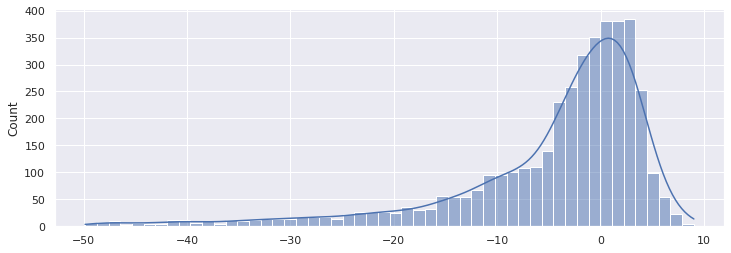

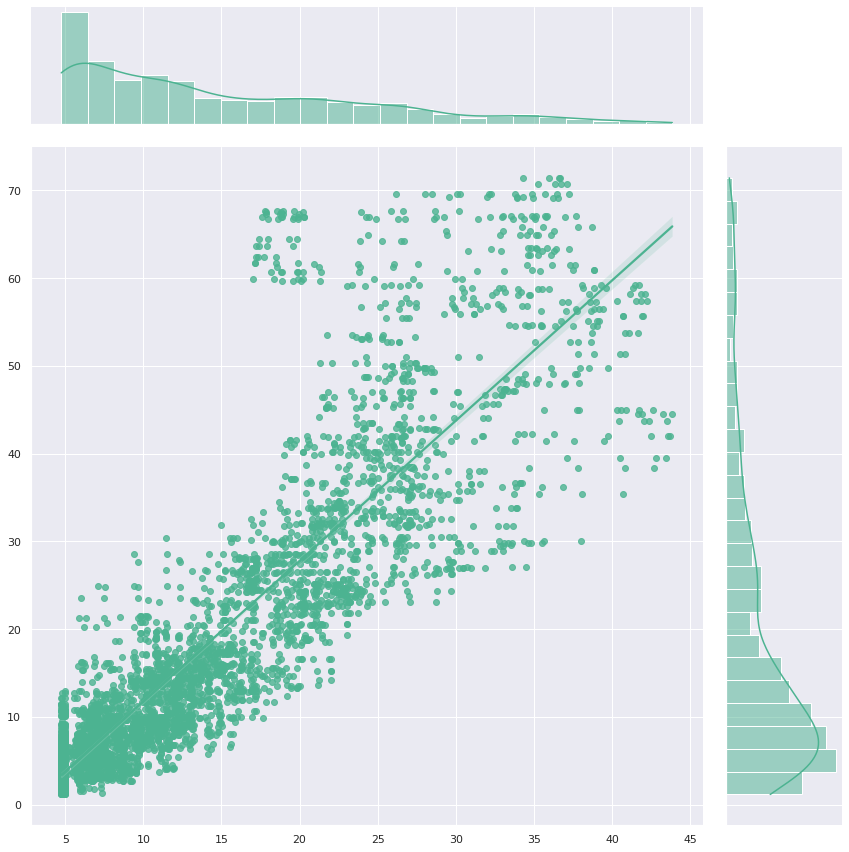

In [ ]:
def create_model(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',dropout = True, dropout_rate = 0.01):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)

    model.add(layers.Input(shape = (inputs_shape,)))

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]



model_type_1, name = create_model(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)

version = input('Version Name :')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train, y_train, 
                                 batch_size = 8, 
                                 epochs = 55, 
                                 modele = model_type_1, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_type_1, X_test, y_test)

32/32 [==============================] - 2s 27ms/step
[ 9.64 11.36 12.26 ...  3.93  3.78  3.69]
[14.216686  14.225004  14.288277  ...  3.9700332  3.988875   4.18335  ]
Variance Score = 0.6865526329249027
Moyenne des biais = -3.5483062172639332
r2 score = 0.6419145510502351
RMSE score = 101.00045574995741
Mean Absolute Percentage Error = 40.556406008639755


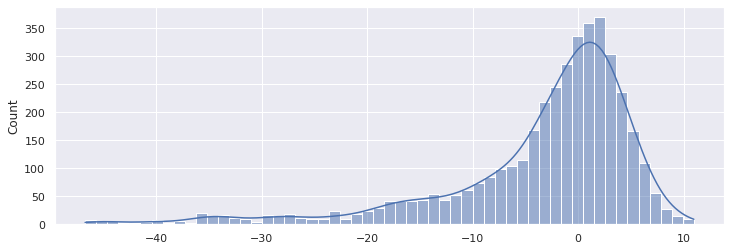

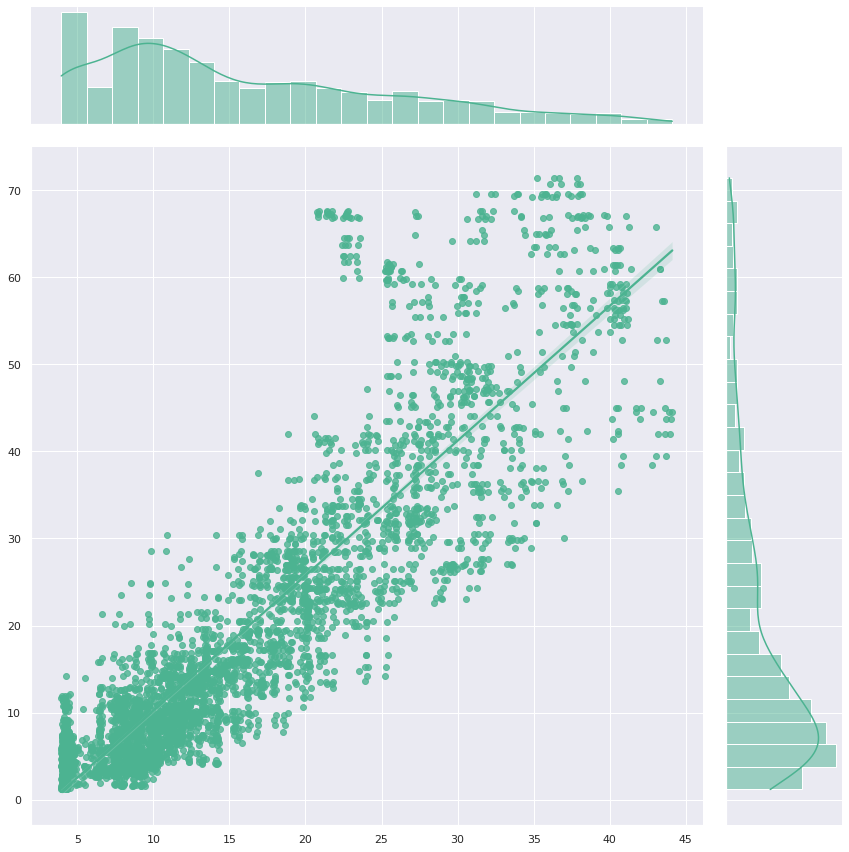

In [ ]:
model_evaluate(model_type_1, X_test, y_test)

## Type 2

In [ ]:


def create_model_conv2(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',kernel_siz = 6,dropout = True, dropout_rate = 0.05,max_pool_size = 2):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    name += '_conv1d_conv1d_flatten'
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)
    # input_shape = (8, 3661, 4272)
    # model.add(layers.Input(shape = (inputs_shape,)))
    # model.add(layers.Reshape((4272, 1), (3661, 4272)))
    # model.add(layers.Conv1D(filters = 64, kernel_size = 6, activation = 'relu', input_shape = (None,4272, 1)))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(layers.MaxPooling1D(pool_size = 2))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(layers.MaxPooling1D(pool_size = 2))
    # model.add(Conv1D(filters = 64, kernel_size = 3, activation = 'relu'))
    # 
    model.add(layers.Flatten())

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]




model_conv3, name = create_model_conv2(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 2)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train_3, y_train, 
                                 batch_size = 12, 
                                 epochs = 30, 
                                 modele = model_conv3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv3, X_test_3, y_test)

## Type 3

In [ ]:
def create_model_conv_lstm2(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',kernel_siz = 6,dropout = True, dropout_rate = 0.05,max_pool_size = 2):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    name += '_conv1d_conv1d_flatten'
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)

    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(tf.keras.layers.MaxPooling1D(2, padding="same"))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(tf.keras.layers.MaxPooling1D(2, padding="same"))

    model.add(tf.keras.layers.LSTM(64, activation="tanh", return_sequences=True))
    # model.add(tf.keras.layers.LSTM(64, activation="tanh", return_sequences=True))

    model.add(layers.Flatten())

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]


model_conv_lstm2, name = create_model_conv_lstm2(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (  128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.1,
                           max_pool_size = 2)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training(X_train_3, y_train, 
                                 batch_size = 16, 
                                 epochs = 15, 
                                 modele = model_conv_lstm2, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv_lstm2, X_test_3, y_test)




# Hour Per Hour Model evalutation

In [16]:
def model_evaluateb(model, X, y):

  # y_pred = model.predict(X)
  # y_array = y.values

  y_true_ravel = np.ravel(y)
  y_pred_ravel = np.ravel(X)
  # y_true_ravel = X
  # y_pred_ravel = y

  print(y_true_ravel)
  print(y_pred_ravel)

  biais_array = y_pred_ravel - y_true_ravel

  ecart_relatif = (abs(y_pred_ravel - y_true_ravel) / y_true_ravel)*100
  sns.set(rc={'figure.figsize':(12,4)})

  print(f'Variance Score = {metrics.explained_variance_score(y_true_ravel, y_pred_ravel)}')
  print(f'Moyenne des biais = {biais_array.mean()}')
  print(f'r2 score = {metrics.r2_score(y_true_ravel, y_pred_ravel)}')
  print(f'RMSE score = {metrics.mean_squared_error(y_true_ravel, y_pred_ravel)}')

  print(f'Mean Absolute Percentage Error = {mean_absolute_percentage_error(y_true_ravel, y_pred_ravel)}')
  sns.histplot(x = biais_array, kde = True)
  graph = sns.jointplot(x=y_pred_ravel, y=y_true_ravel, kind="reg", color="#4CB391", height = 12)
  graph.set_axis_labels('prediction', 'target', fontsize=16)

test = pd.DataFrame.to_numpy(y_test)



In [17]:
from datetime import datetime

# DatetimeIndex: 5133 entries, 2020-03-01 02:00:00 to 2020-09-30 22:00:00
# X_train_3[0,0:24]
# 2020-03-02 01:00:00   ->  3.333 = première date datframe

#datetime(year, month, day)
a = datetime(2018, 11, 28)

# datetime(year, month, day, hour, minute, second, microsecond)
b = datetime(2017, 11, 28, 23, 55, 59, 342380)

y2= pd.DataFrame.to_numpy(y)
# y[:,0]
tamp2 = np.zeros([np.shape(y2)[0],24])

for i in range(24,np.shape(y2)[0]):
  for t in range(24):
    tamp2[i,t]=y2[i-t,0]
tamp2
tamp2 = tamp2.reshape((np.shape(tamp2)[0],np.shape(tamp2)[1],1))
y2= y2[24:]
y2 = pd.DataFrame(y2)

X2=pd.DataFrame.to_numpy(X)

np.shape(X2)
X2 = X2.reshape([np.shape(X2)[0],np.shape(X2)[1],1])
np.shape(X2)



tamp = np.zeros([np.shape(X2)[0],2,1])

for i in range(np.shape(tamp)[0]):
  t=24*61+1 +i
  tamp[i,0] = np.cos(2*np.pi/(366*24)*t)
  tamp[i,1] = np.sin(2*np.pi/(366*24)*t)

X2 = np.hstack((X2,tamp2))
X2=np.hstack((X2,tamp))
X2 = X2[24:]
X_train_val, X_train, X_val, X_test, y_train_val, y_train , y_val, y_test = split(X2, y2)
X_train_2 = X_train #.to_numpy()
X_traint=X_train[:,:178*24]
X_train_3 = X_train[:,:178*24]#.to_numpy().to_numpy()
X_train_3=X_train_3.reshape((int(X_train.shape[0]), 24, int((X_train.shape[1]-26)/24)))

X_train_3=np.transpose(X_train_3, axes=(0,2,1))
X_train_3=X_train_3.reshape((int(X_train.shape[0]),  int((X_train.shape[1]-26)),1))
X_traint=X_train[:,:178*24]
X_train_4 =X_traint
X_train_4=X_train_4.reshape((int(X_train.shape[0]), 24, int((X_train.shape[1]-26)/24)))
X_train_4=np.transpose(X_train_4, axes=(0,2,1))
X_train_4=X_train_4.reshape((int(X_train.shape[0]),  int((X_train.shape[1]-26)),1))
X_train_4 = np.hstack((X_train_4,X_train[:,178*24:]))

X_test_4 = X_test[:,:178*24] #.to_numpy().to_numpy()
X_test_4=X_test_4.reshape((int(X_test.shape[0]), 24, int(X_traint.shape[1]/24)))
X_test_4=np.transpose(X_test_4, axes=(0,2,1))
X_test_4=X_test_4.reshape((int(X_test.shape[0]),  int(X_traint.shape[1]),1))
X_test_4=np.hstack((X_test_4,X_test[:,178*24:]))

X_val_4 = X_val[:,:178*24] #.to_numpy().to_numpy()
X_val_4=X_val_4.reshape((int(X_val_4.shape[0]), 24, int(X_traint.shape[1]/24)))
X_val_4=np.transpose(X_val_4, axes=(0,2,1))
X_val_4=X_val_4.reshape((int(X_val.shape[0]),  int(X_traint.shape[1]),1))
X_val_4=np.hstack((X_val_4,X_val[:,178*24:]))

In [18]:
def training_2(X, y, batch_size, epochs, modele, name, loss, optimizer, checkpoint = True, tensorboard = True):

  modele.compile(
      loss = loss,
      optimizer = optimizer
  )

  if tensorboard:
    log_fit = 'Results/logs/fit' +'/'+ name
    tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_fit, histogram_freq=1)
  
  dir_model_h5 = 'Results/'+name+'.h5'

  if checkpoint:
    checkpoint_cb = keras.callbacks.ModelCheckpoint(dir_model_h5, save_best_only=True)

  history = modele.fit(X, y, batch_size=batch_size, epochs=epochs, validation_data=(X_val_4, y_val), callbacks=[checkpoint_cb,tensorboard_cb])

  return [history, dir_model_h5]

# Parameter Tuning

## Dense model

### Dense model parameter tuning

In [ ]:
def create_model(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',dropout = True, dropout_rate = 0.01):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)

    model.add(layers.Input(shape = (inputs_shape,)))

    model.add(layers.Flatten())
    
    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]


Model: "model_EDF_1024_512_256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 4298)              0         
                                                                 
 dense_9 (Dense)             (None, 1024)              4402176   
                                                                 
 dropout_8 (Dropout)         (None, 1024)              0         
                                                                 
 dense_10 (Dense)            (None, 512)               524800    
                                                                 
 dropout_9 (Dropout)         (None, 512)               0         
                                                                 
 dense_11 (Dense)            (None, 256)               131328    
                                                                 
 dropout_10 (Dro

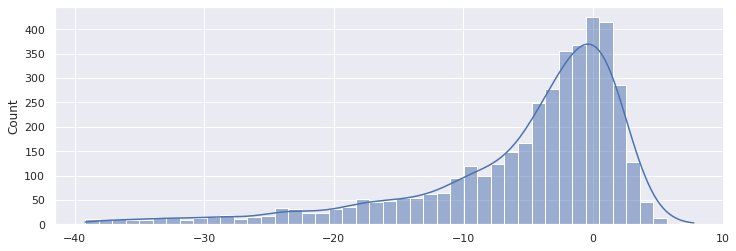

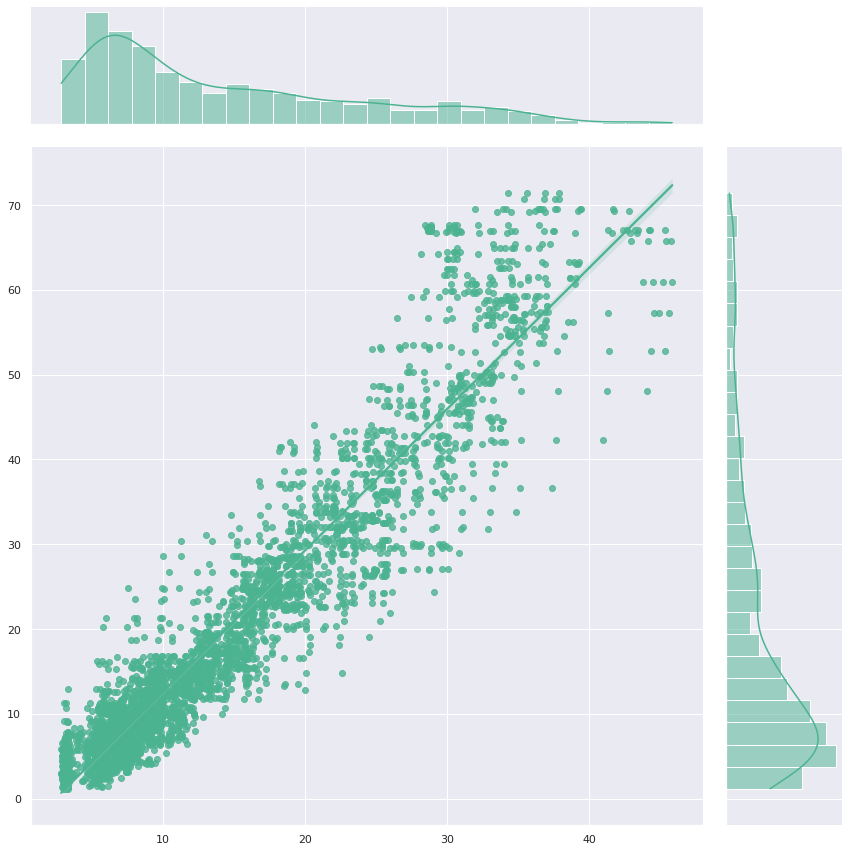

In [ ]:



model_type_1_1, name = create_model(inputs_shape = np.shape(X_train_4)[1], 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)

# version = input('Version Name :')
version = 'b20_e80'
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 20, #8 avant
                                 epochs = 80, 
                                 modele = model_type_1_1, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_type_1_1, X_test_4, y_test)

Model: "model_EDF_1024_512_256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 4298)              0         
                                                                 
 dense_18 (Dense)            (None, 1024)              4402176   
                                                                 
 dropout_16 (Dropout)        (None, 1024)              0         
                                                                 
 dense_19 (Dense)            (None, 512)               524800    
                                                                 
 dropout_17 (Dropout)        (None, 512)               0         
                                                                 
 dense_20 (Dense)            (None, 256)               131328    
                                                                 
 dropout_18 (Dro

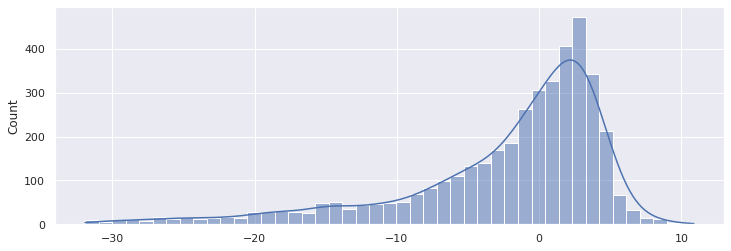

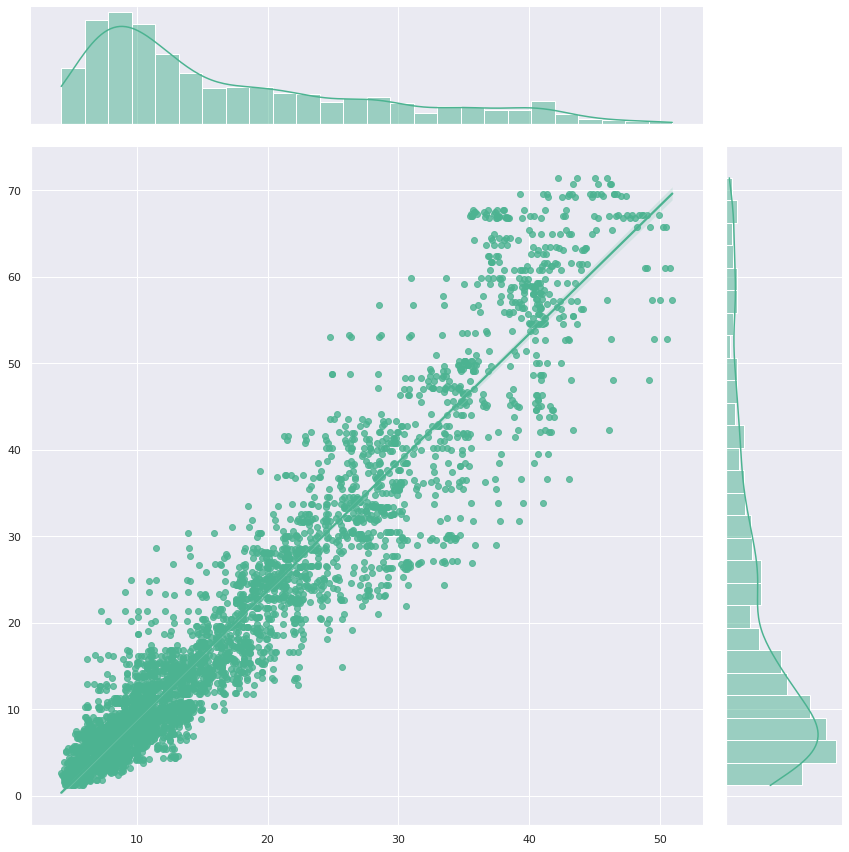

In [ ]:



model_type_1_2, name = create_model(inputs_shape = np.shape(X_train_4)[1], 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)

# version = input('Version Name :')
version = 'b12_e60'
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 12, #8 avant
                                 epochs = 60, 
                                 modele = model_type_1_2, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_type_1_2, X_test_4, y_test)

Model: "model_EDF_1024_512_256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_3 (Flatten)         (None, 4298)              0         
                                                                 
 dense_27 (Dense)            (None, 1024)              4402176   
                                                                 
 dropout_24 (Dropout)        (None, 1024)              0         
                                                                 
 dense_28 (Dense)            (None, 512)               524800    
                                                                 
 dropout_25 (Dropout)        (None, 512)               0         
                                                                 
 dense_29 (Dense)            (None, 256)               131328    
                                                                 
 dropout_26 (Dro

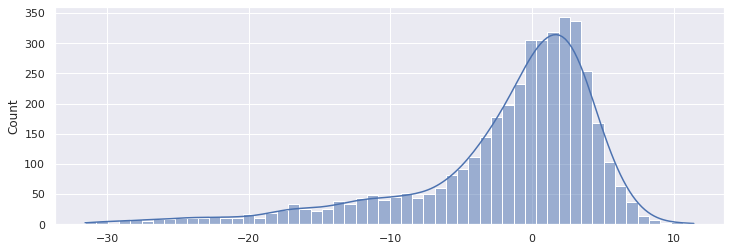

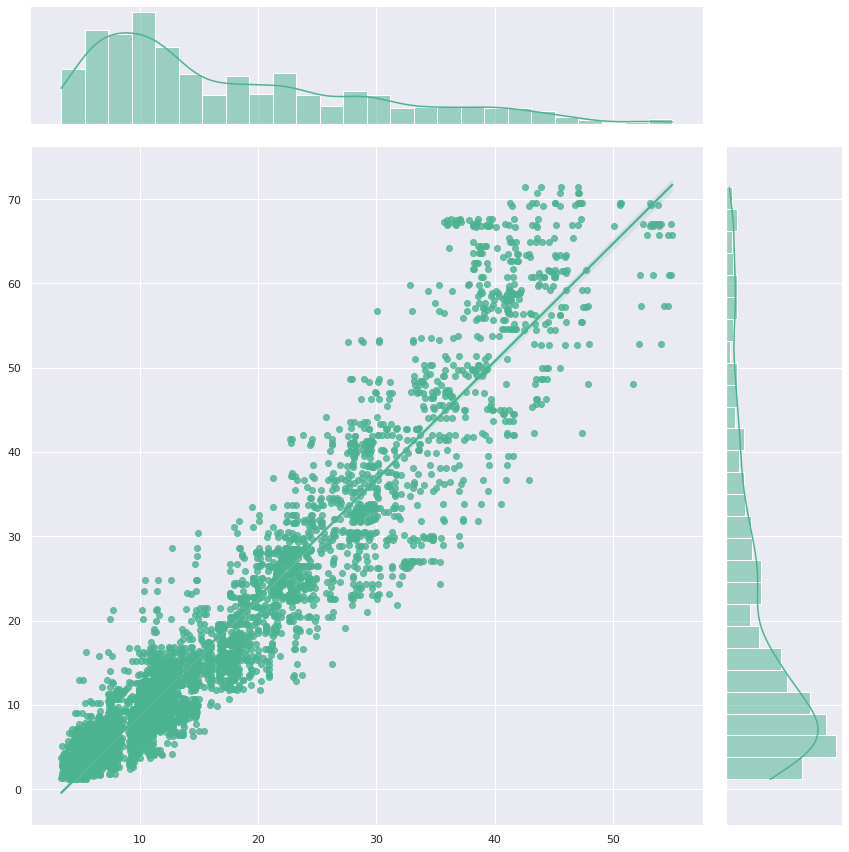

In [ ]:



model_type_1_3, name = create_model(inputs_shape = np.shape(X_train_4)[1], 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)

# version = input('Version Name :')
version = 'b20_e60'
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 8, #8 avant
                                 epochs = 50, 
                                 modele = model_type_1_3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_type_1_3, X_test_4, y_test)

Model: "model_EDF_1024_512_256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_6 (Flatten)         (None, 4298)              0         
                                                                 
 dense_54 (Dense)            (None, 1024)              4402176   
                                                                 
 dropout_48 (Dropout)        (None, 1024)              0         
                                                                 
 dense_55 (Dense)            (None, 512)               524800    
                                                                 
 dropout_49 (Dropout)        (None, 512)               0         
                                                                 
 dense_56 (Dense)            (None, 256)               131328    
                                                                 
 dropout_50 (Dro

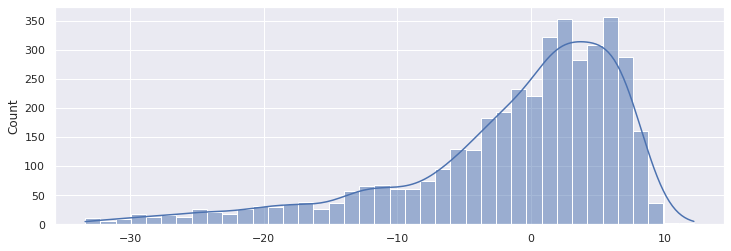

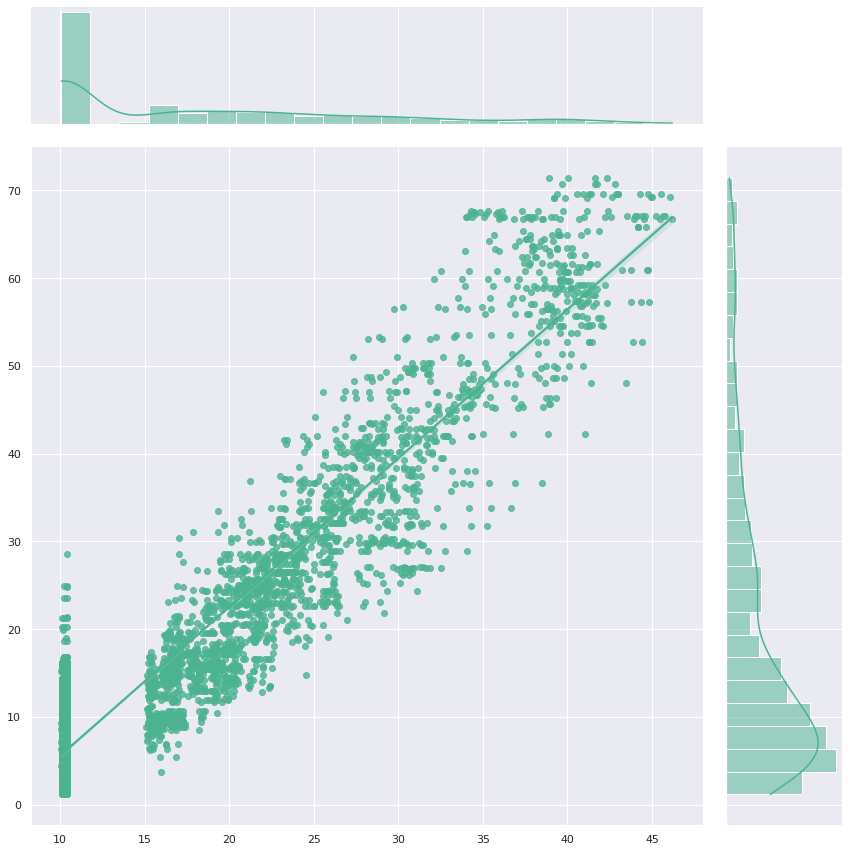

In [ ]:

model_type_1_1, name = create_model(inputs_shape = np.shape(X_train_4)[1], 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)

# version = input('Version Name :')
version = 'b2_e0'
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 2, #8 avant
                                 epochs = 30, 
                                 modele = model_type_1_1, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_type_1_1, X_test_4, y_test)

Model: "model_EDF_1024_512_256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_8 (Flatten)         (None, 4298)              0         
                                                                 
 dense_72 (Dense)            (None, 1024)              4402176   
                                                                 
 dropout_64 (Dropout)        (None, 1024)              0         
                                                                 
 dense_73 (Dense)            (None, 512)               524800    
                                                                 
 dropout_65 (Dropout)        (None, 512)               0         
                                                                 
 dense_74 (Dense)            (None, 256)               131328    
                                                                 
 dropout_66 (Dro

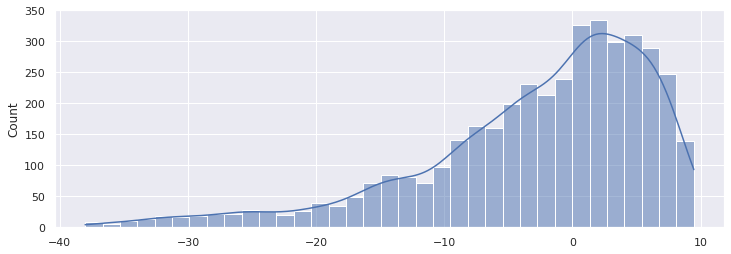

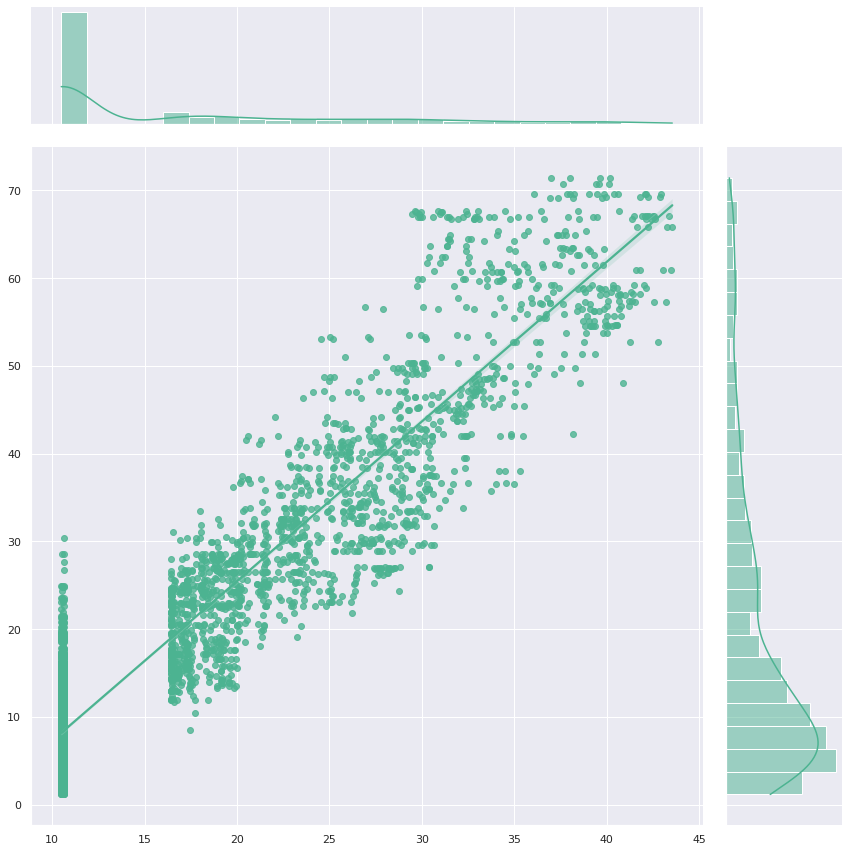

In [ ]:

model_type_1_3, name = create_model(inputs_shape = np.shape(X_train_4)[1], 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)

# version = input('Version Name :')
version = 'b2_e40'
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 2, #8 avant
                                 epochs = 40, 
                                 modele = model_type_1_3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_type_1_3, X_test_4, y_test)

Model: "model_EDF_1024_512_256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_3 (Flatten)         (None, 4298)              0         
                                                                 
 dense_31 (Dense)            (None, 1024)              4402176   
                                                                 
 dropout_27 (Dropout)        (None, 1024)              0         
                                                                 
 dense_32 (Dense)            (None, 512)               524800    
                                                                 
 dropout_28 (Dropout)        (None, 512)               0         
                                                                 
 dense_33 (Dense)            (None, 256)               131328    
                                                                 
 dropout_29 (Dro

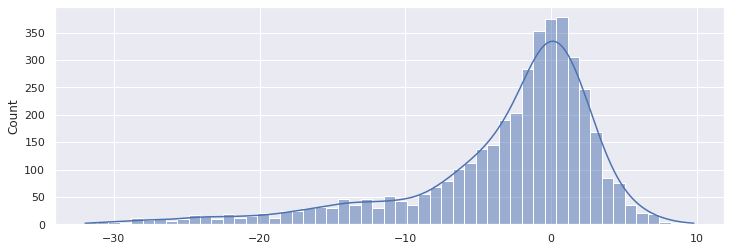

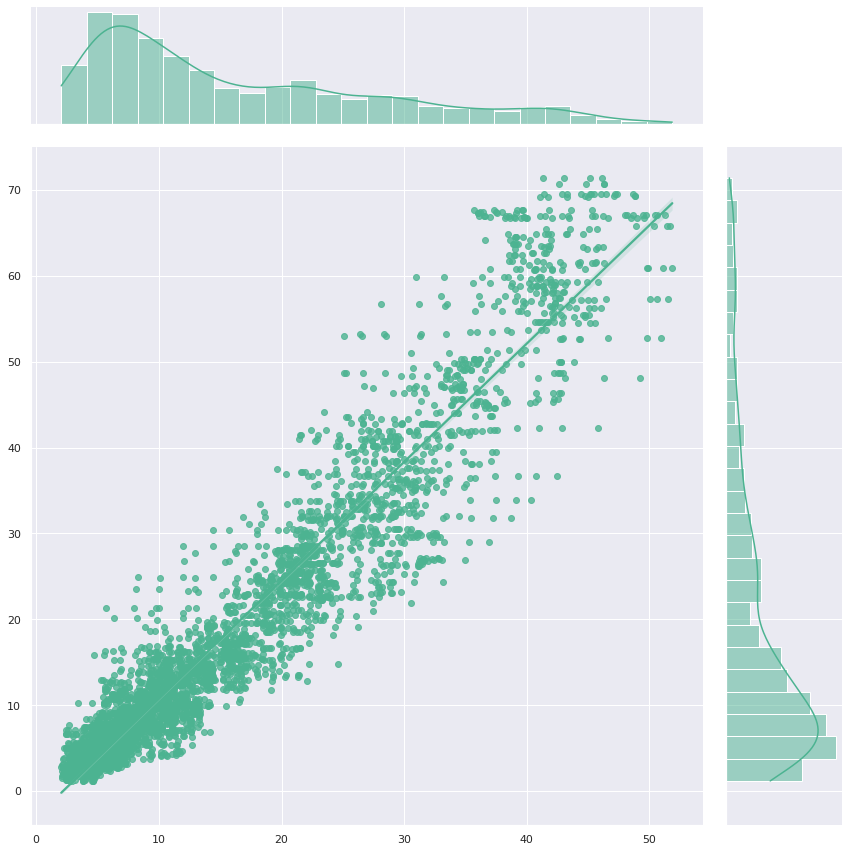

In [ ]:
def create_model(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',dropout = True, dropout_rate = 0.01):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)

    model.add(layers.Input(shape = (inputs_shape,)))

    model.add(layers.Flatten())
    
    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]



model_type_1, name = create_model(inputs_shape = np.shape(X_train_4)[1], 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)
version = "Batch size"
# version = input('Version Name :')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 12, #8 avant
                                 epochs = 50, 
                                 modele = model_type_1, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_type_1, X_test_4, y_test)

Model: "model_EDF_1024_512_256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 4298)              0         
                                                                 
 dense_5 (Dense)             (None, 1024)              4402176   
                                                                 
 dropout_4 (Dropout)         (None, 1024)              0         
                                                                 
 dense_6 (Dense)             (None, 512)               524800    
                                                                 
 dropout_5 (Dropout)         (None, 512)               0         
                                                                 
 dense_7 (Dense)             (None, 256)               131328    
                                                                 
 dropout_6 (Drop

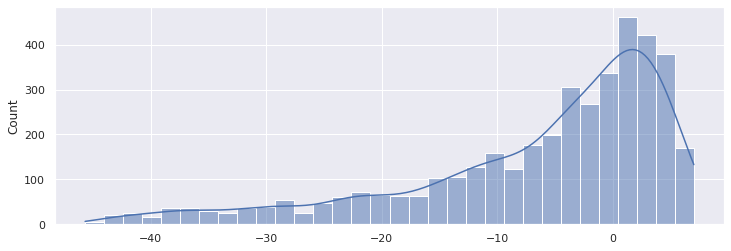

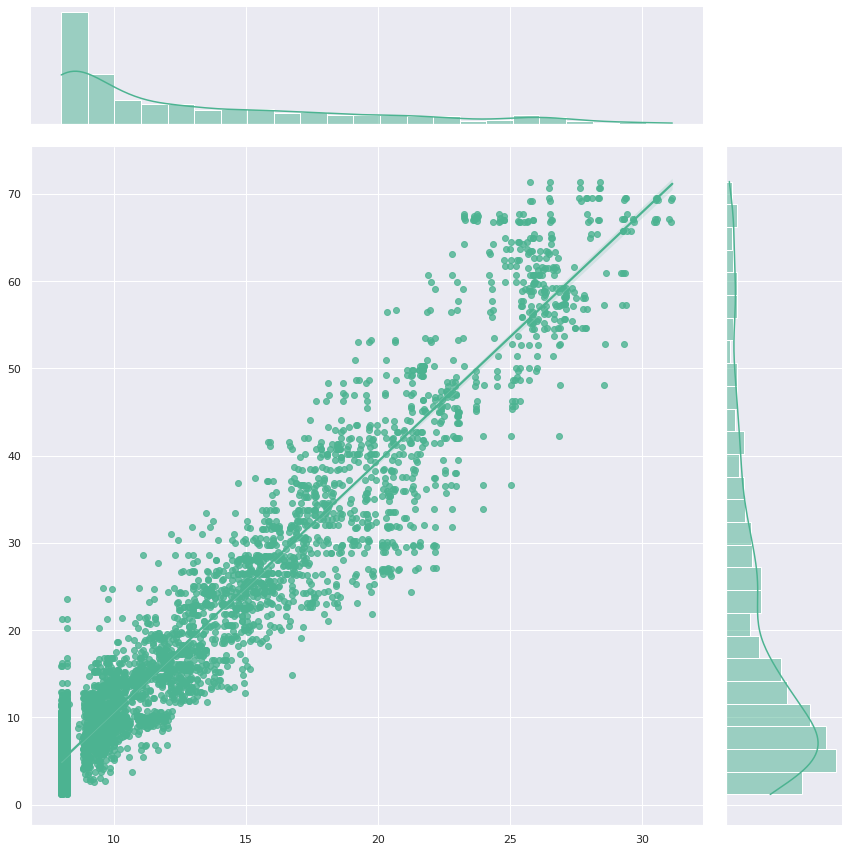

In [ ]:
def create_model(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',dropout = True, dropout_rate = 0.01):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)

    model.add(layers.Input(shape = (inputs_shape,)))

    model.add(layers.Flatten())
    
    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]



model_type_1, name = create_model(inputs_shape = np.shape(X_train_4)[1], 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.15)
version = "Dropout rate"
# version = input('Version Name :')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 8, #8 avant
                                 epochs = 50, 
                                 modele = model_type_1, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_type_1, X_test_4, y_test)

Model: "model_EDF_1024_512_256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_9 (Flatten)         (None, 4298)              0         
                                                                 
 dense_81 (Dense)            (None, 1024)              4402176   
                                                                 
 dropout_72 (Dropout)        (None, 1024)              0         
                                                                 
 dense_82 (Dense)            (None, 512)               524800    
                                                                 
 dropout_73 (Dropout)        (None, 512)               0         
                                                                 
 dense_83 (Dense)            (None, 256)               131328    
                                                                 
 dropout_74 (Dro

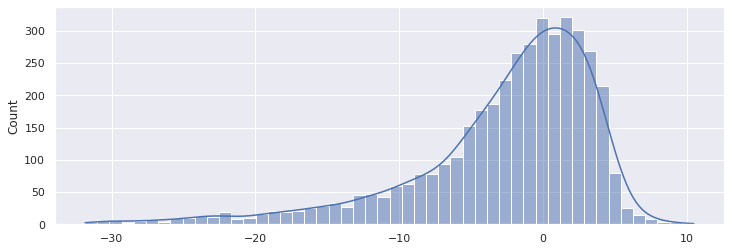

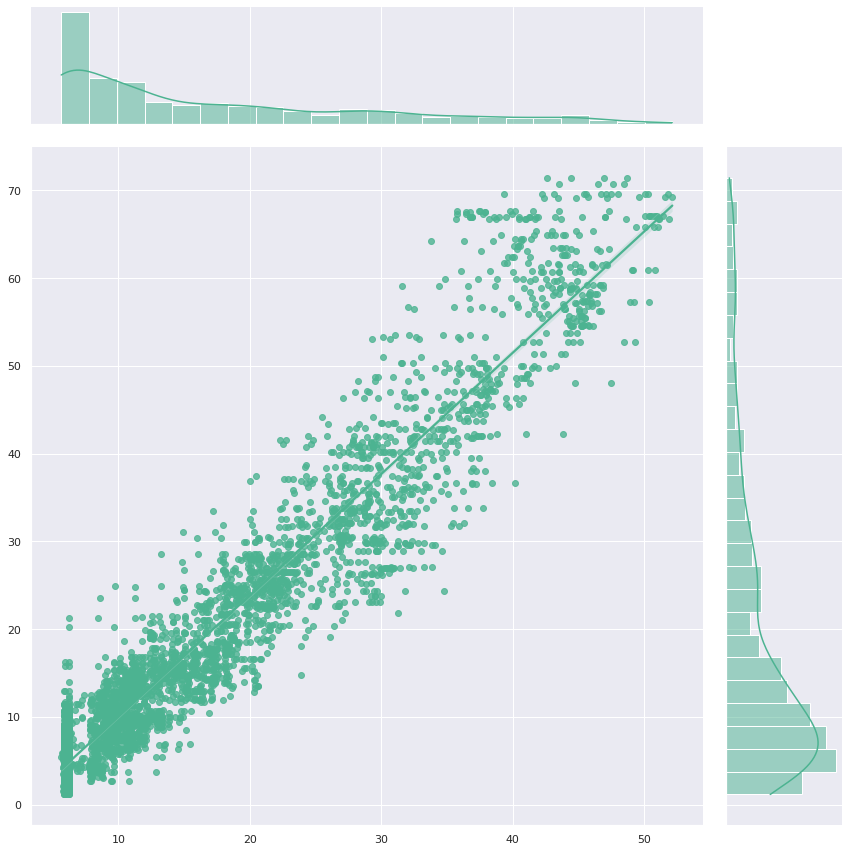

In [ ]:

model_type_1_3, name = create_model(inputs_shape = np.shape(X_train_4)[1], 
                           outputs_shape = 4, 
                           hidden_shape = (1024, 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)

# version = input('Version Name :')
version = 'b4_e50'
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 4, #8 avant
                                 epochs = 50, 
                                 modele = model_type_1_3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_type_1_3, X_test_4, y_test)

### Best Dense model
40 min of training


32/32 [==============================] - 0s 15ms/step
[17.54 13.07  9.78 ... 22.84 21.69 18.16]
[12.1071005 12.102192  11.952461  ... 18.138283  17.956879  17.888264 ]
Variance Score = 0.8953594392550057
Moyenne des biais = -3.3692643176273673
r2 score = 0.8552810243411526
RMSE score = 40.990678588298
Mean Absolute Percentage Error = 27.6313614659171


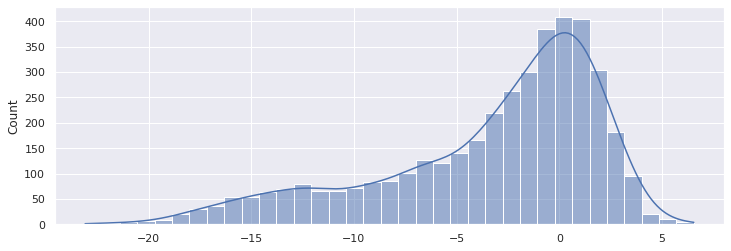

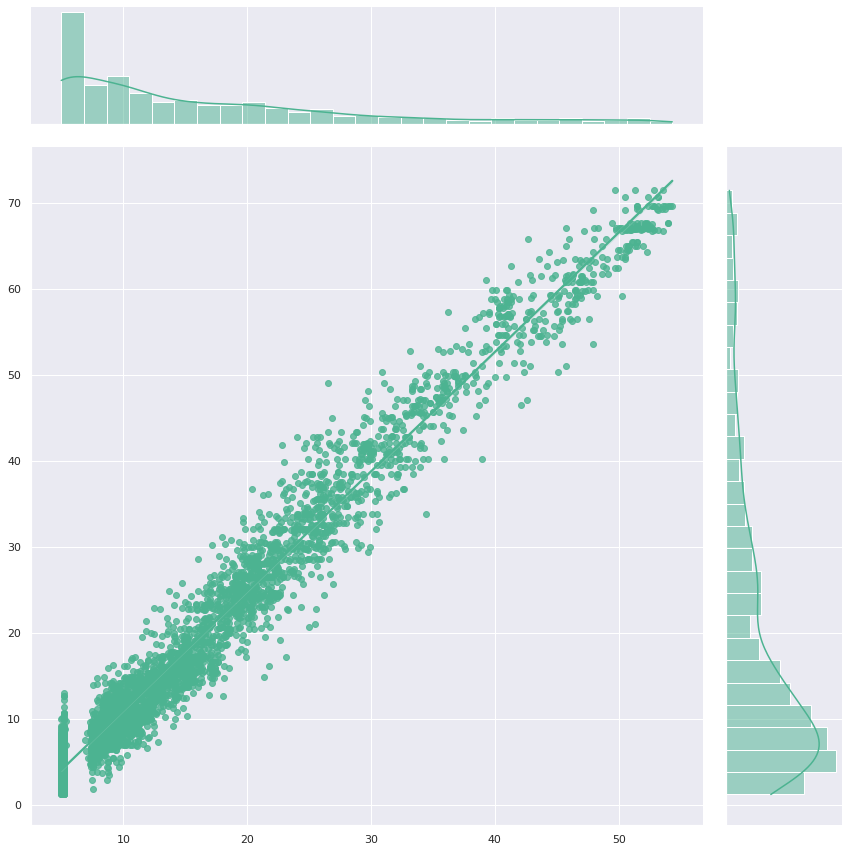

In [ ]:
def create_model(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',dropout = True, dropout_rate = 0.01):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)

    model.add(layers.Input(shape = (inputs_shape,)))

    model.add(layers.Flatten())
    
    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]



model_type_1_3, name = create_model(inputs_shape = np.shape(X_train_4)[1], 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)

# version = input('Version Name :')
version = 'b4_e50'
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 8, #8 avant
                                 epochs = 50, 
                                 modele = model_type_1_3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)


model_evaluate(model_type_1_3, X_test_4, y_test)



In [ ]:
def create_model(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',dropout = True, dropout_rate = 0.01):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)

    model.add(layers.Input(shape = (inputs_shape,)))

    model.add(layers.Flatten())
    
    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]



model_type_1_3, name = create_model(inputs_shape = np.shape(X_train_4)[1], 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32,16,8), 
                           dropout = True,
                           dropout_rate= 0.05)


Model: "model_EDF_512_256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 4298)              0         
                                                                 
 dense (Dense)               (None, 512)               2201088   
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dropout_2 (Dropout) 

## Convolutionnal Models

### Test on convolutionnal model

Model: "model_EDF_512__conv1d_conv1d_flatten256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_14 (Conv1D)          (None, 4293, 32)          224       
                                                                 
 max_pooling1d_14 (MaxPoolin  (None, 2146, 32)         0         
 g1D)                                                            
                                                                 
 conv1d_15 (Conv1D)          (None, 2141, 32)          6176      
                                                                 
 max_pooling1d_15 (MaxPoolin  (None, 1070, 32)         0         
 g1D)                                                            
                                                                 
 flatten_10 (Flatten)        (None, 34240)             0         
                                                                 

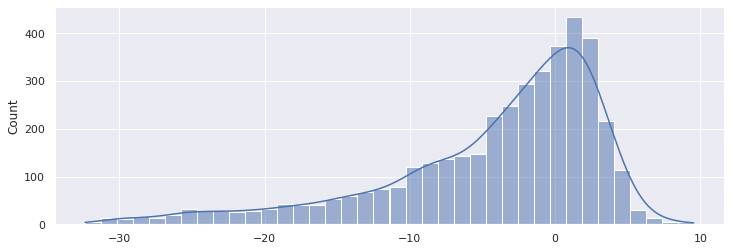

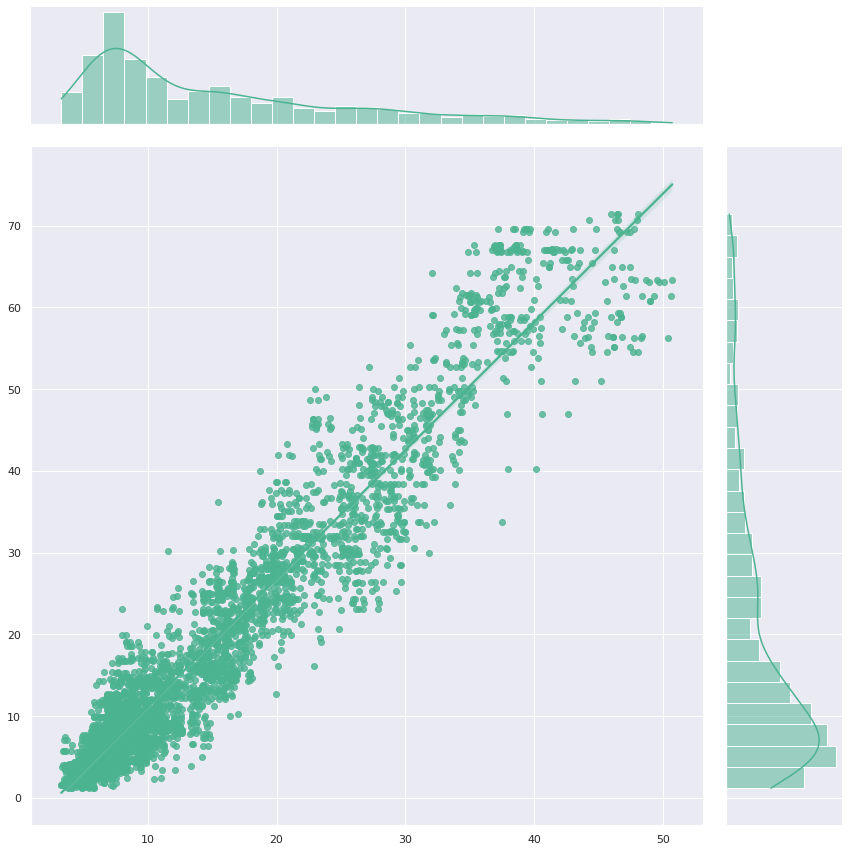

In [ ]:
def create_model_conv2(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',kernel_siz = 6,dropout = True, dropout_rate = 0.05,max_pool_size = 2):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    name += '_conv1d_conv1d_flatten'
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)
    # input_shape = (8, 3661, 4272)
    # model.add(layers.Input(shape = (inputs_shape,)))
    # model.add(layers.Reshape((4272, 1), (3661, 4272)))
    # model.add(layers.Conv1D(filters = 64, kernel_size = 6, activation = 'relu', input_shape = (None,4272, 1)))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_4.shape[1], X_train_4.shape[2])))
    model.add(layers.MaxPooling1D(pool_size = 2))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_4.shape[1], X_train_4.shape[2])))
    model.add(layers.MaxPooling1D(pool_size = 2))
    # model.add(Conv1D(filters = 64, kernel_size = 3, activation = 'relu'))
    # 
    model.add(layers.Flatten())

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]




model_conv3, name = create_model_conv2(inputs_shape = 4274, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 2)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 12, 
                                 epochs = 50, 
                                 modele = model_conv3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv3, X_test_4, y_test)

In [ ]:
def create_model_conv2(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',kernel_siz = 6,dropout = True, dropout_rate = 0.05,max_pool_size = 2, filter_size_1 = 32, filter_size_2 = 32):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    name += '_conv1d_conv1d_flatten'
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)
    # input_shape = (8, 3661, 4272)
    # model.add(layers.Input(shape = (inputs_shape,)))
    # model.add(layers.Reshape((4272, 1), (3661, 4272)))
    # model.add(layers.Conv1D(filters = 64, kernel_size = 6, activation = 'relu', input_shape = (None,4272, 1)))
    model.add(layers.Conv1D(filters=filter_size_1, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_4.shape[1], X_train_4.shape[2])))
    model.add(layers.MaxPooling1D(pool_size = 2))
    model.add(layers.Conv1D(filters=filter_size_2, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_4.shape[1], X_train_4.shape[2])))
    model.add(layers.MaxPooling1D(pool_size = 2))
    # model.add(Conv1D(filters = 64, kernel_size = 3, activation = 'relu'))
    # 
    model.add(layers.Flatten())

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]






####-

Model: "model_EDF_512__conv1d_conv1d_flatten256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 4293, 32)          224       
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 2146, 32)         0         
 1D)                                                             
                                                                 
 conv1d_3 (Conv1D)           (None, 2141, 32)          6176      
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 1070, 32)         0         
 1D)                                                             
                                                                 
 flatten_11 (Flatten)        (None, 34240)             0         
                                                                 

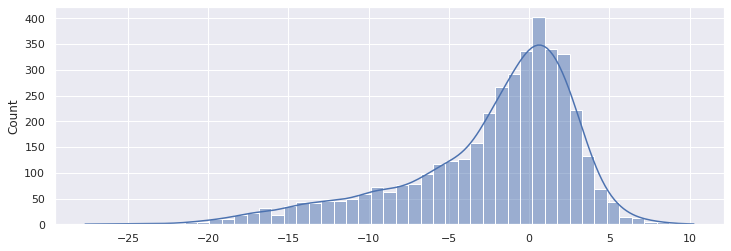

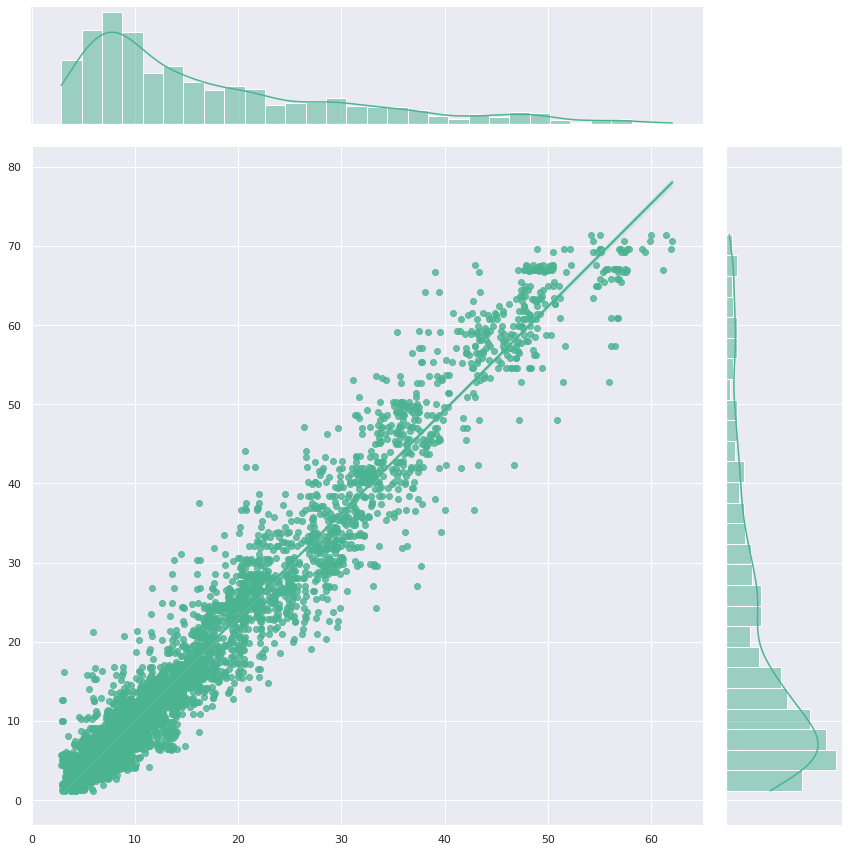

In [ ]:
model_conv3, name = create_model_conv2(inputs_shape = 4274, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 2,
                           filter_size_1 = 32,
                           filter_size_2 = 32)

# version = input('Changement effectué si même réseau de neurones ou version si différent : ')
version = "f132_f232"
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 12, 
                                 epochs = 50, 
                                 modele = model_conv3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv3, X_test_4, y_test)

#### WIP

Model: "model_EDF_512__conv1d_conv1d_flatten256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 4293, 64)          448       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 2146, 64)         0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 2141, 32)          12320     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 1070, 32)         0         
 1D)                                                             
                                                                 
 flatten (Flatten)           (None, 34240)             0         
                                                                 

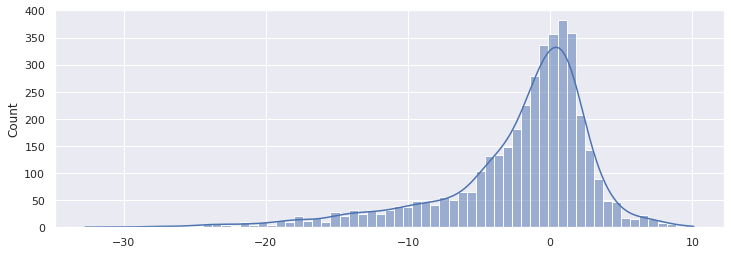

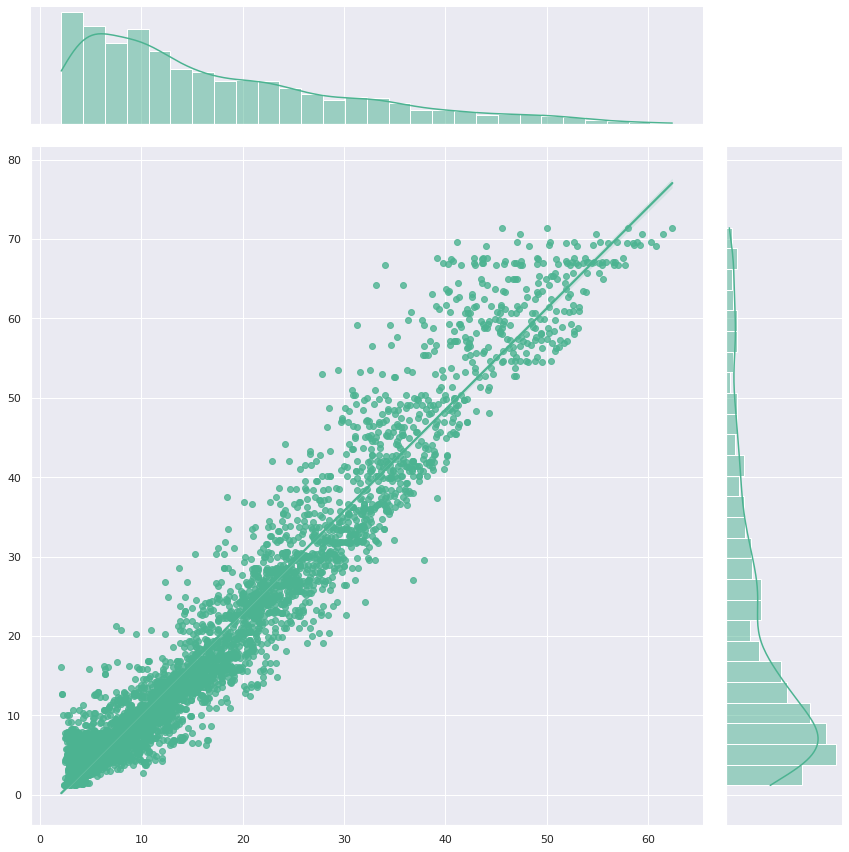

In [ ]:
model_conv3, name = create_model_conv2(inputs_shape = 4274, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 2,
                           filter_size_1 = 64,
                           filter_size_2 = 32)

version = "f164_f232"

loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 12, 
                                 epochs = 50, 
                                 modele = model_conv3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv3, X_test_4, y_test)

32/32 [==============================] - 5s 166ms/step
[12.9  10.61  6.83 ...  3.93  3.78  3.69]
[12.6951885 12.425259  12.1452465 ...  4.290756   4.557666   5.010285 ]
Variance Score = 0.8931696386933896
Moyenne des biais = -2.2711156509800468
r2 score = 0.8749387062076858
RMSE score = 35.3828274739548
Mean Absolute Percentage Error = 23.700932651877775


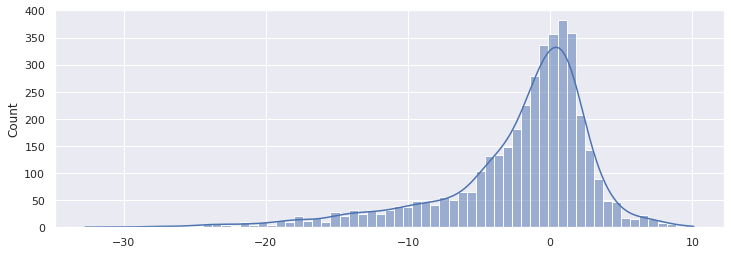

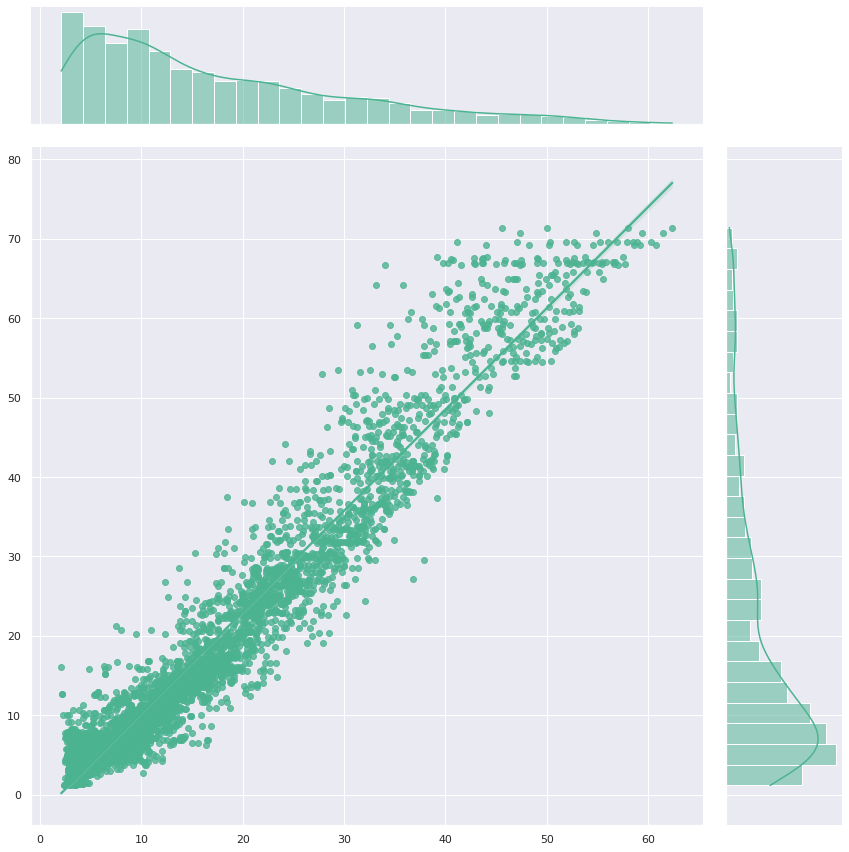

In [ ]:
model_evaluate(model_conv3, X_test_4, y_test)

Zone à spam click

In [ ]:
aaaa

Model: "model_EDF_512__conv1d_conv1d_flatten256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 4293, 64)          448       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 2146, 64)         0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 2141, 64)          24640     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 1070, 64)         0         
 1D)                                                             
                                                                 
 flatten (Flatten)           (None, 68480)             0         
                                                                 

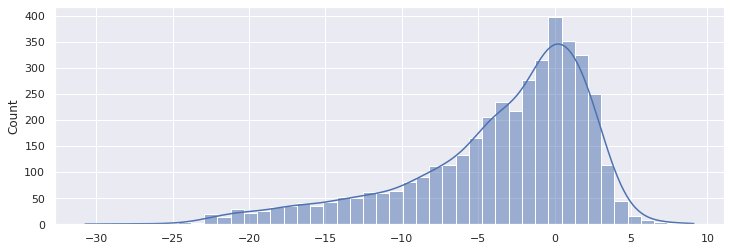

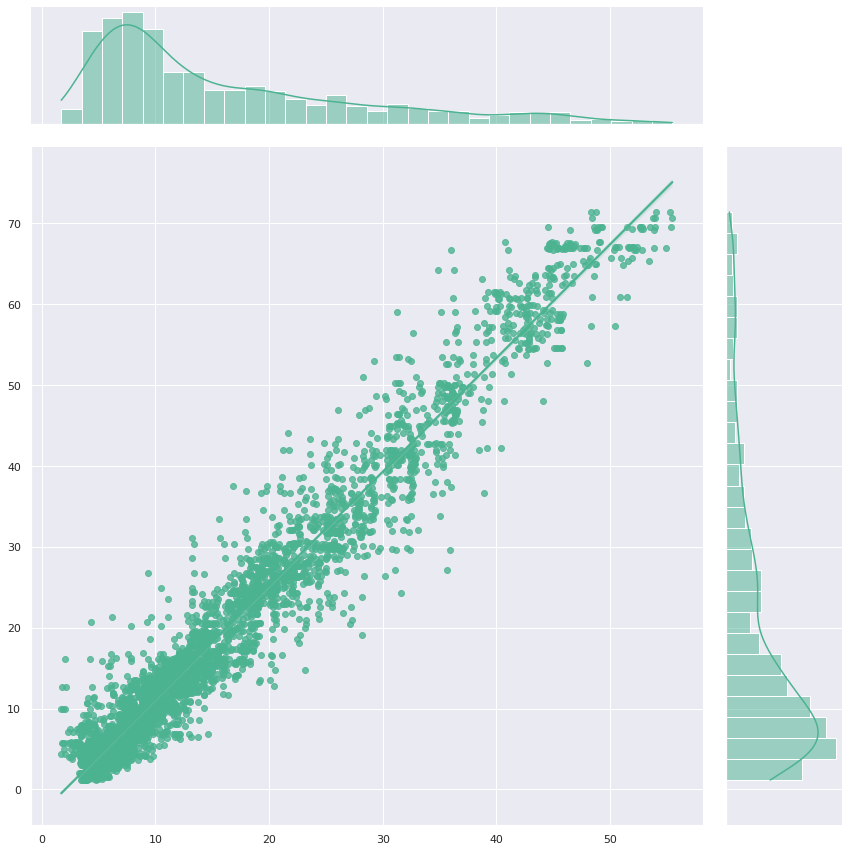

In [ ]:
model_conv4, name = create_model_conv2(inputs_shape = 4274, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 2,
                           filter_size_1 = 64,
                           filter_size_2 = 64)

version = "f164_f264"

loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 24, 
                                 epochs = 50, 
                                 modele = model_conv4, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv4, X_test_4, y_test)

Epoch 1/20
304/304 [==============================] - 232s 760ms/step - loss: 20.6706 - val_loss: 8.3806
Epoch 2/20
304/304 [==============================] - 221s 728ms/step - loss: 20.8306 - val_loss: 8.9023
Epoch 3/20
304/304 [==============================] - 240s 791ms/step - loss: 19.3600 - val_loss: 7.0436
Epoch 4/20
304/304 [==============================] - 223s 735ms/step - loss: 19.5436 - val_loss: 7.8793
Epoch 5/20
304/304 [==============================] - 229s 754ms/step - loss: 20.1498 - val_loss: 9.0931
Epoch 6/20
304/304 [==============================] - 221s 726ms/step - loss: 19.5183 - val_loss: 7.7884
Epoch 7/20
304/304 [==============================] - 213s 700ms/step - loss: 18.3854 - val_loss: 10.9135
Epoch 8/20
304/304 [==============================] - 221s 728ms/step - loss: 19.6036 - val_loss: 8.2108
Epoch 9/20
304/304 [==============================] - 221s 727ms/step - loss: 18.8018 - val_loss: 9.5265
Epoch 10/20
304/304 [==============================] -

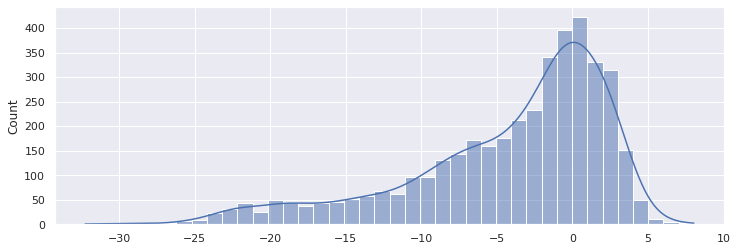

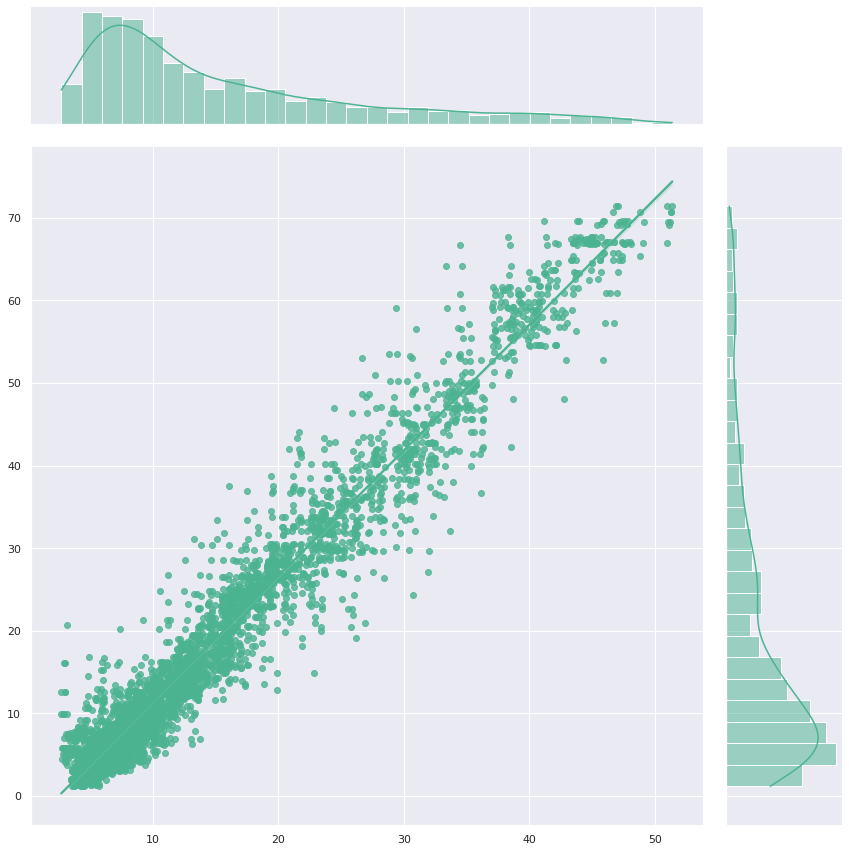

In [ ]:
history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 12, 
                                 epochs = 20, 
                                 modele = model_conv4, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv4, X_test_4, y_test)

Model: "model_EDF_512__conv1d_conv1d_flatten256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 4293, 16)          112       
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 2146, 16)         0         
 1D)                                                             
                                                                 
 conv1d_3 (Conv1D)           (None, 2141, 16)          1552      
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 1070, 16)         0         
 1D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 17120)             0         
                                                                 

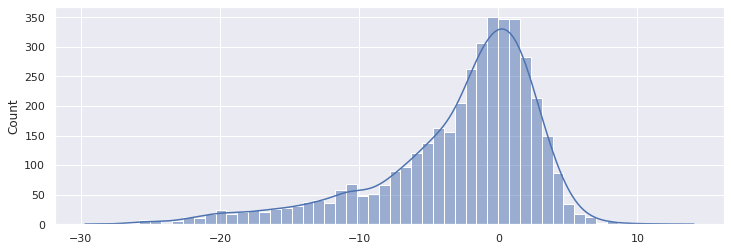

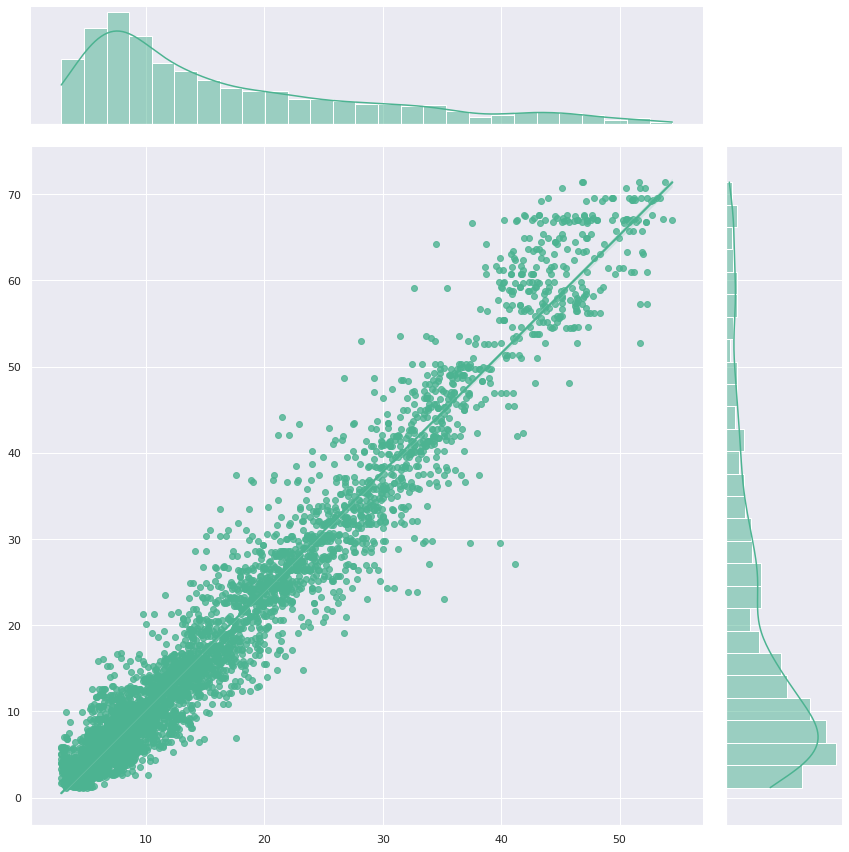

In [ ]:
model_conv5, name = create_model_conv2(inputs_shape = 4274, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 2,
                           filter_size_1 = 16,
                           filter_size_2 = 16)

version = "f116_f216"

loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 12, 
                                 epochs = 50, 
                                 modele = model_conv5, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv5, X_test_4, y_test)

Model: "model_EDF_512__conv1d_conv1d_flatten256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 4293, 128)         896       
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 2146, 128)        0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 2141, 32)          24608     
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 1070, 32)         0         
 1D)                                                             
                                                                 
 flatten_2 (Flatten)         (None, 34240)             0         
                                                                 

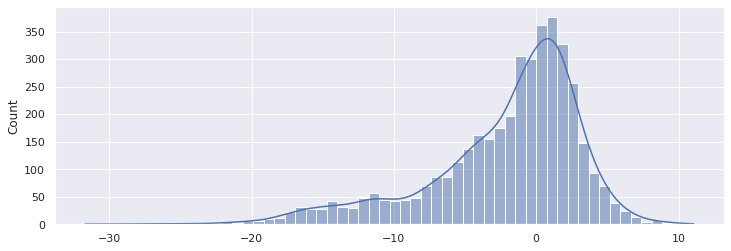

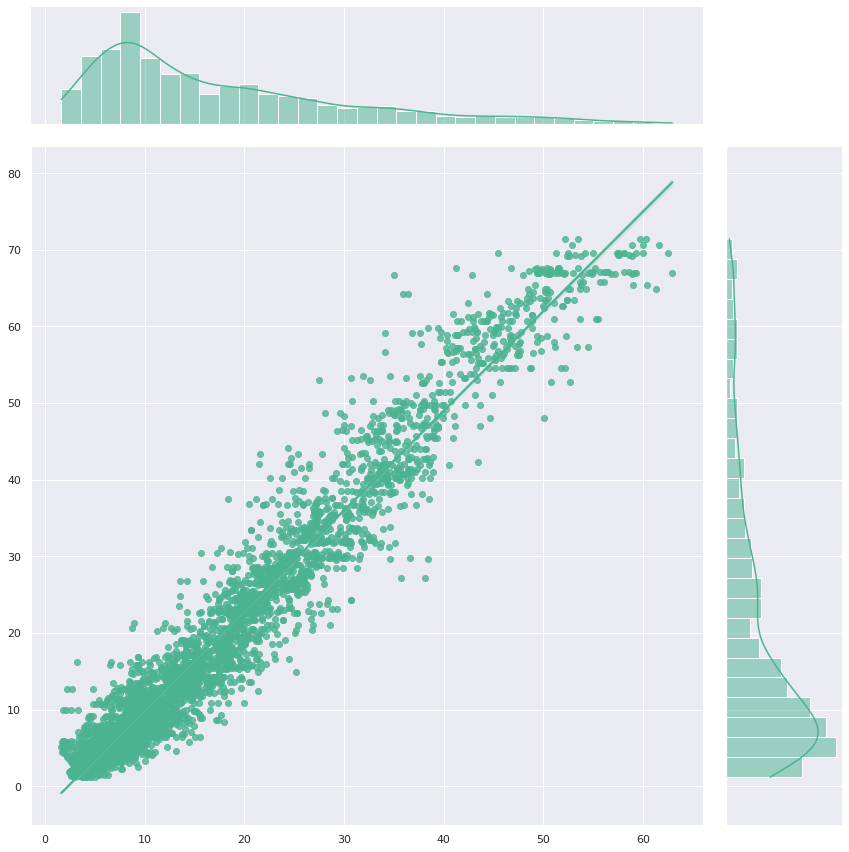

In [ ]:
model_conv3, name = create_model_conv2(inputs_shape = 4274, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 2,
                           filter_size_1 = 128,
                           filter_size_2 = 32)

version = "f1128_f232"

loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 24, 
                                 epochs = 50, 
                                 modele = model_conv3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv3, X_test_4, y_test)

In [ ]:
aaa

Model: "model_EDF_512__conv1d_conv1d_flatten256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_6 (Conv1D)           (None, 4293, 48)          336       
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 2146, 48)         0         
 1D)                                                             
                                                                 
 conv1d_7 (Conv1D)           (None, 2141, 48)          13872     
                                                                 
 max_pooling1d_7 (MaxPooling  (None, 1070, 48)         0         
 1D)                                                             
                                                                 
 flatten_3 (Flatten)         (None, 51360)             0         
                                                                 

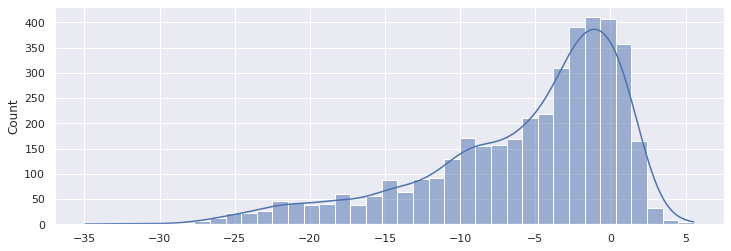

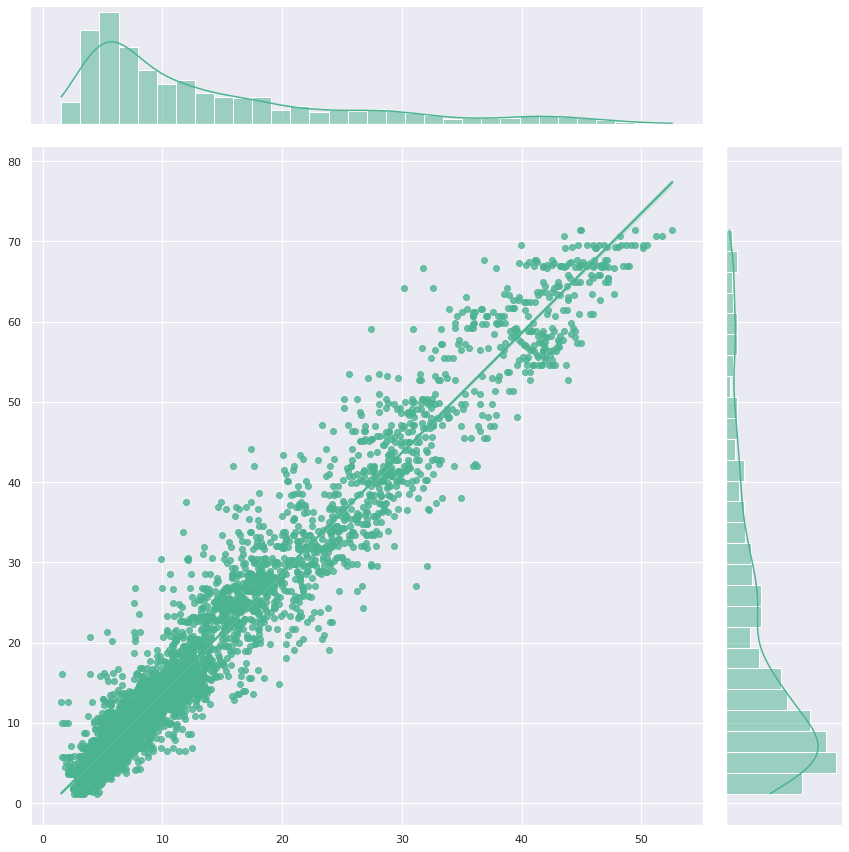

In [ ]:
model_conv5, name = create_model_conv2(inputs_shape = 4274, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 2,
                           filter_size_1 = 48,
                           filter_size_2 = 48)

version = "f148_f248"

loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 48, 
                                 epochs = 50, 
                                 modele = model_conv5, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv5, X_test_4, y_test)

Epoch 1/10
76/76 [==============================] - 91s 1s/step - loss: 23.9333 - val_loss: 7.7748
Epoch 2/10
76/76 [==============================] - 74s 976ms/step - loss: 21.4778 - val_loss: 7.3518
Epoch 3/10
76/76 [==============================] - 66s 872ms/step - loss: 21.7354 - val_loss: 10.1477
Epoch 4/10
76/76 [==============================] - 68s 902ms/step - loss: 19.8346 - val_loss: 6.9831
Epoch 5/10
76/76 [==============================] - 66s 875ms/step - loss: 22.1959 - val_loss: 7.9533
Epoch 6/10
76/76 [==============================] - 68s 890ms/step - loss: 20.7410 - val_loss: 7.0614
Epoch 7/10
76/76 [==============================] - 65s 854ms/step - loss: 22.2670 - val_loss: 10.1663
Epoch 8/10
76/76 [==============================] - 66s 863ms/step - loss: 19.4058 - val_loss: 7.3208
Epoch 9/10
76/76 [==============================] - 65s 858ms/step - loss: 22.0106 - val_loss: 12.0634
Epoch 10/10
32/32 [==============================] - 4s 123ms/step
[12.9  10.61  6

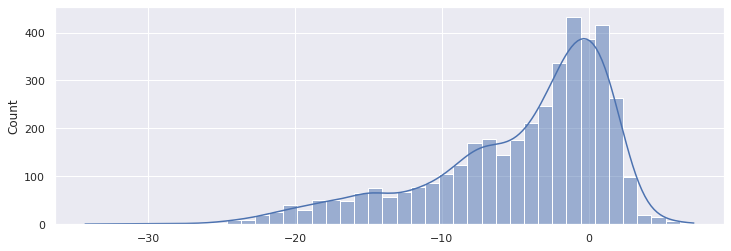

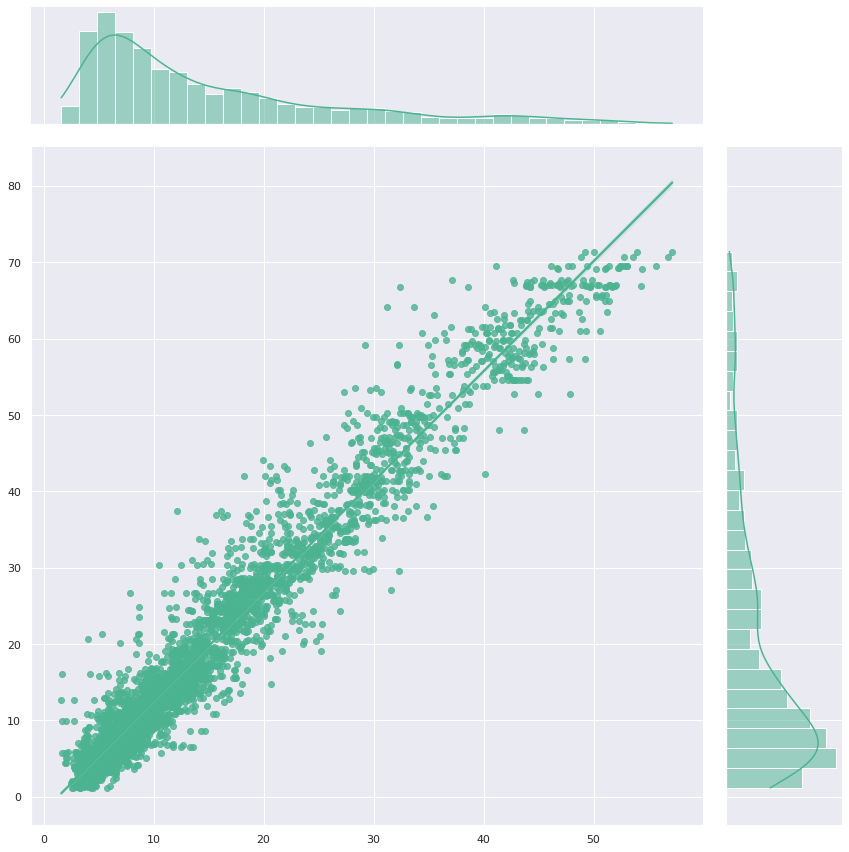

In [ ]:
history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 48, 
                                 epochs = 10, 
                                 modele = model_conv5, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv5, X_test_4, y_test)

In [ ]:
aaa

Model: "model_EDF_512__conv1d_conv1d_flatten256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_8 (Conv1D)           (None, 4293, 48)          336       
                                                                 
 max_pooling1d_8 (MaxPooling  (None, 2146, 48)         0         
 1D)                                                             
                                                                 
 conv1d_9 (Conv1D)           (None, 2141, 48)          13872     
                                                                 
 max_pooling1d_9 (MaxPooling  (None, 1070, 48)         0         
 1D)                                                             
                                                                 
 flatten_4 (Flatten)         (None, 51360)             0         
                                                                 

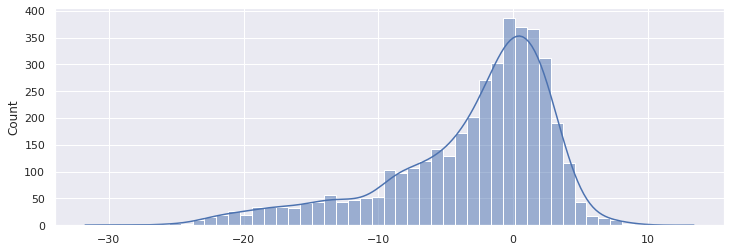

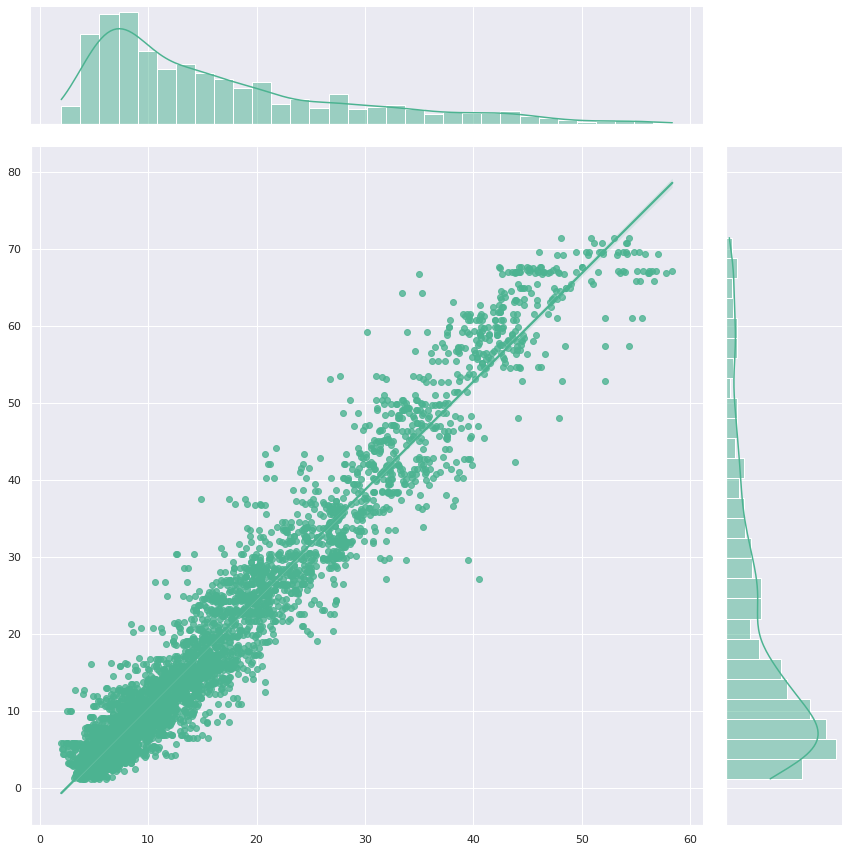

In [ ]:
model_conv6, name = create_model_conv2(inputs_shape = 4274, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 2,
                           filter_size_1 = 48,
                           filter_size_2 = 48)

version = "f148_f248_b24"

loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 24, 
                                 epochs = 50, 
                                 modele = model_conv6, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv6, X_test_4, y_test)

Epoch 1/20
152/152 [==============================] - 108s 702ms/step - loss: 16.7842 - val_loss: 7.2251
Epoch 2/20
152/152 [==============================] - 88s 580ms/step - loss: 17.1740 - val_loss: 8.3170
Epoch 3/20
152/152 [==============================] - 88s 581ms/step - loss: 17.2805 - val_loss: 8.9892
Epoch 4/20
152/152 [==============================] - 90s 590ms/step - loss: 17.0035 - val_loss: 7.6952
Epoch 5/20
152/152 [==============================] - 88s 582ms/step - loss: 16.2027 - val_loss: 8.3308
Epoch 6/20
152/152 [==============================] - 90s 591ms/step - loss: 18.0388 - val_loss: 7.4348
Epoch 7/20
152/152 [==============================] - 93s 612ms/step - loss: 14.2478 - val_loss: 7.8549
Epoch 8/20
152/152 [==============================] - 89s 586ms/step - loss: 15.4285 - val_loss: 8.5642
Epoch 9/20
152/152 [==============================] - 91s 600ms/step - loss: 15.3544 - val_loss: 7.8997
Epoch 10/20
152/152 [==============================] - 90s 594m

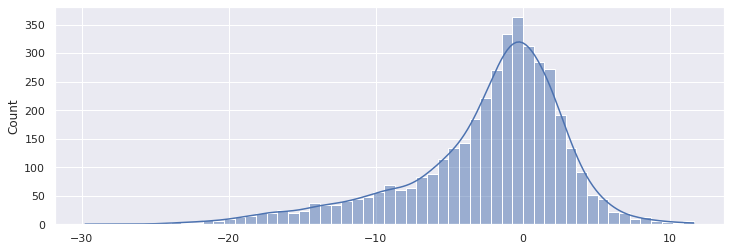

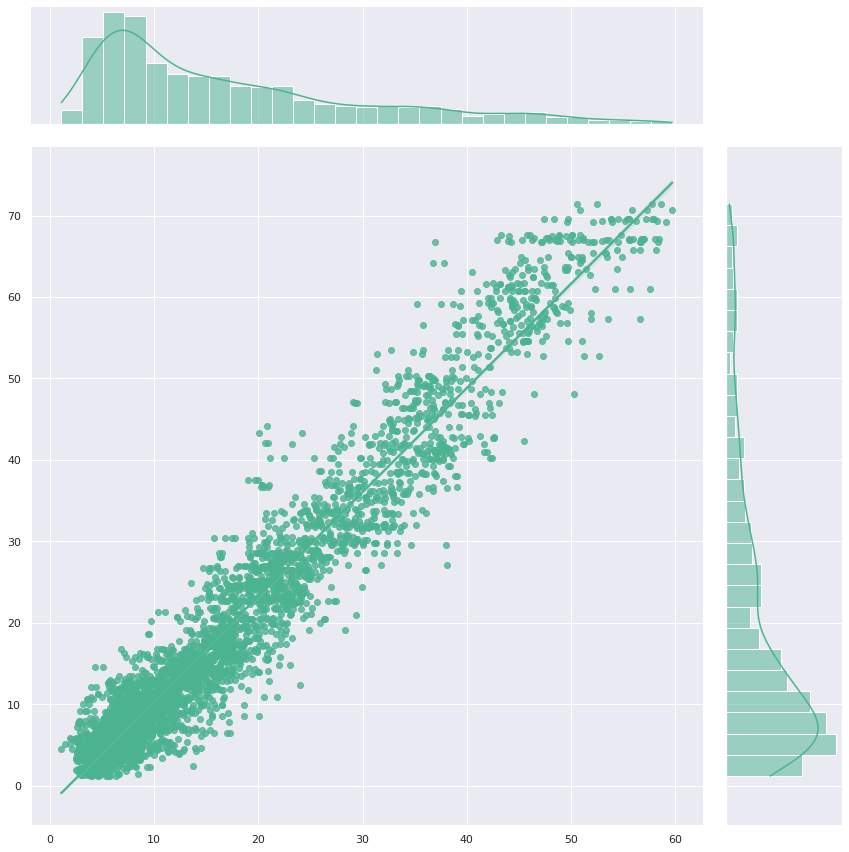

In [ ]:
history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 24, 
                                 epochs = 20, 
                                 modele = model_conv6, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv6, X_test_4, y_test)

Epoch 1/10
152/152 [==============================] - 103s 673ms/step - loss: 12.5824 - val_loss: 7.3888
Epoch 2/10
152/152 [==============================] - 83s 548ms/step - loss: 12.6338 - val_loss: 7.9443
Epoch 3/10
152/152 [==============================] - 83s 547ms/step - loss: 11.4956 - val_loss: 8.2192
Epoch 4/10
152/152 [==============================] - 86s 569ms/step - loss: 11.3284 - val_loss: 8.2316
Epoch 5/10
152/152 [==============================] - 84s 556ms/step - loss: 12.4574 - val_loss: 7.8799
Epoch 6/10
152/152 [==============================] - 89s 585ms/step - loss: 12.1558 - val_loss: 7.7258
Epoch 7/10
152/152 [==============================] - 86s 566ms/step - loss: 11.7005 - val_loss: 7.5982
Epoch 8/10
152/152 [==============================] - 84s 551ms/step - loss: 11.3252 - val_loss: 9.1061
Epoch 9/10
152/152 [==============================] - 83s 547ms/step - loss: 11.5693 - val_loss: 7.9226
Epoch 10/10
32/32 [==============================] - 4s 117ms/s

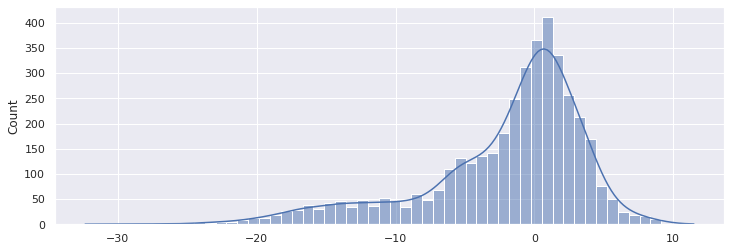

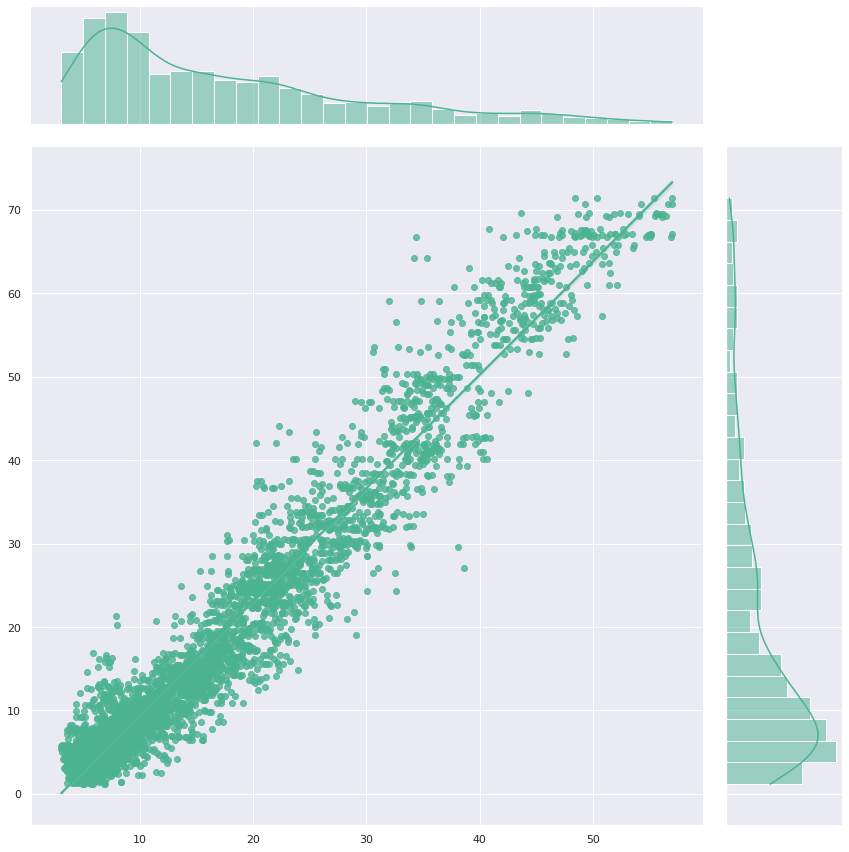

In [ ]:
model_conv6p=model_conv6

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 24, 
                                 epochs = 10, 
                                 modele = model_conv6p, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv6p, X_test_4, y_test)

Essayer avec moins d'epochs

In [ ]:
model_conv7, name = create_model_conv2(inputs_shape = 4274, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 2,
                           filter_size_1 = 48,
                           filter_size_2 = 48)

version = "f148_f248_b24"

loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 24, 
                                 epochs = 50, 
                                 modele = model_conv7, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv7, X_test_4, y_test)

In [ ]:
history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 24, 
                                 epochs = 20, 
                                 modele = model_conv7, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv7, X_test_4, y_test)

In [ ]:
model_conv5, name = create_model_conv2(inputs_shape = 4274, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 2,
                           filter_size_1 = 48,
                           filter_size_2 = 48)

version = "f148_f248"

loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 24, 
                                 epochs = 50, 
                                 modele = model_conv5, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv5, X_test_4, y_test)

In [ ]:

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 24, 
                                 epochs = 50, 
                                 modele = model_conv5, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv5, X_test_4, y_test)

In [ ]:

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 24, 
                                 epochs = 50, 
                                 modele = model_conv5, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv5, X_test_4, y_test)

Model: "model_EDF_512__conv1d_conv1d_flatten256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 4293, 48)          336       
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 2146, 48)         0         
 1D)                                                             
                                                                 
 conv1d_3 (Conv1D)           (None, 2141, 48)          13872     
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 1070, 48)         0         
 1D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 51360)             0         
                                                                 

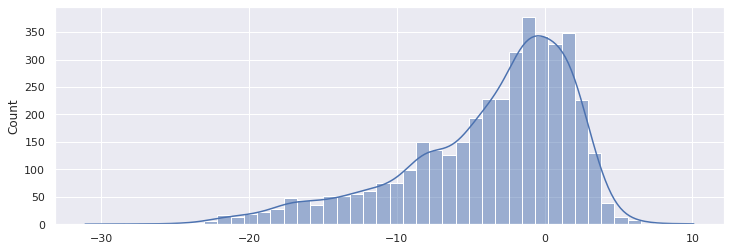

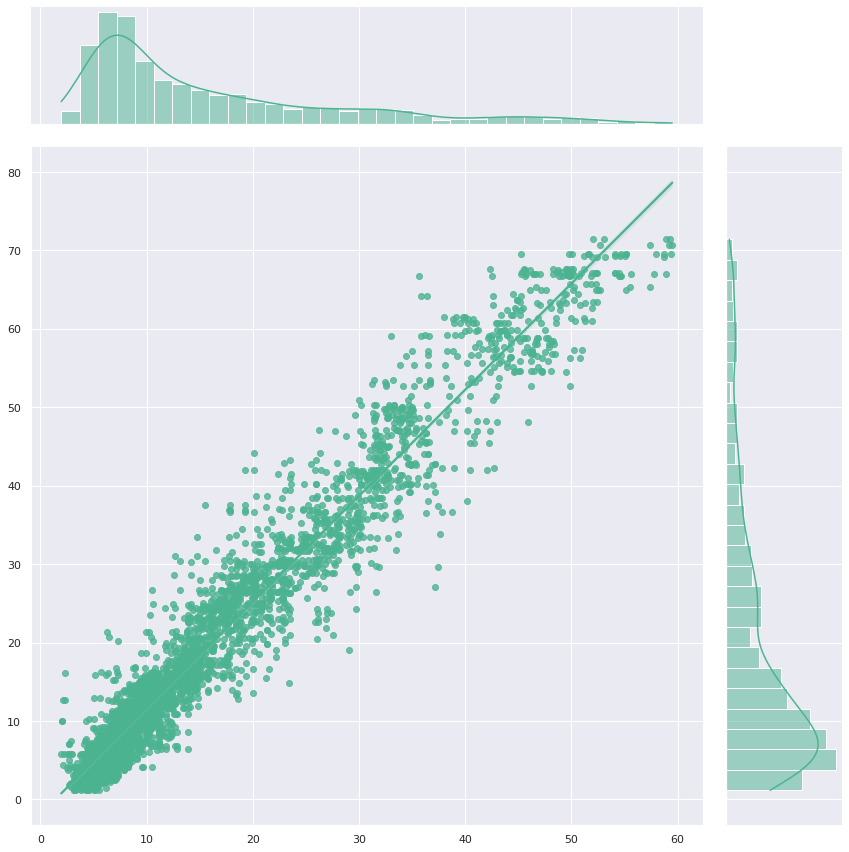

In [ ]:
model_conv4, name = create_model_conv2(inputs_shape = 4274, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 4,
                           filter_size_1 = 48,
                           filter_size_2 = 48)

version = "f148_f248_mp4"
# 60 epoch meilleur
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 24, 
                                 epochs = 50, 
                                 modele = model_conv4, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv4, X_test_4, y_test)

Epoch 1/10
152/152 [==============================] - 118s 768ms/step - loss: 18.6548 - val_loss: 7.6643
Epoch 2/10
152/152 [==============================] - 98s 647ms/step - loss: 20.2199 - val_loss: 7.1495
Epoch 3/10
152/152 [==============================] - 89s 587ms/step - loss: 18.9870 - val_loss: 8.4199
Epoch 4/10
152/152 [==============================] - 91s 598ms/step - loss: 18.2042 - val_loss: 10.4132
Epoch 5/10
152/152 [==============================] - 90s 596ms/step - loss: 19.3923 - val_loss: 9.0686
Epoch 6/10
152/152 [==============================] - 84s 550ms/step - loss: 20.0855 - val_loss: 8.4260
Epoch 7/10
152/152 [==============================] - 85s 562ms/step - loss: 17.1452 - val_loss: 8.6200
Epoch 8/10
152/152 [==============================] - 87s 573ms/step - loss: 21.0671 - val_loss: 9.1508
Epoch 9/10
152/152 [==============================] - 93s 610ms/step - loss: 17.4604 - val_loss: 6.7176
Epoch 10/10
32/32 [==============================] - 4s 119ms/

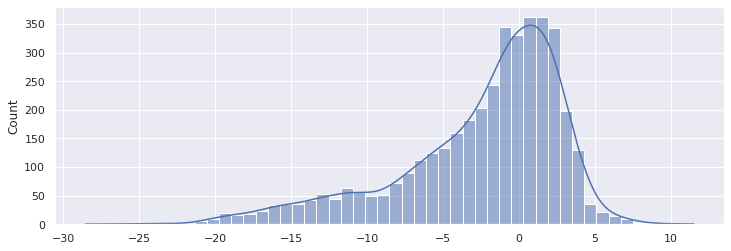

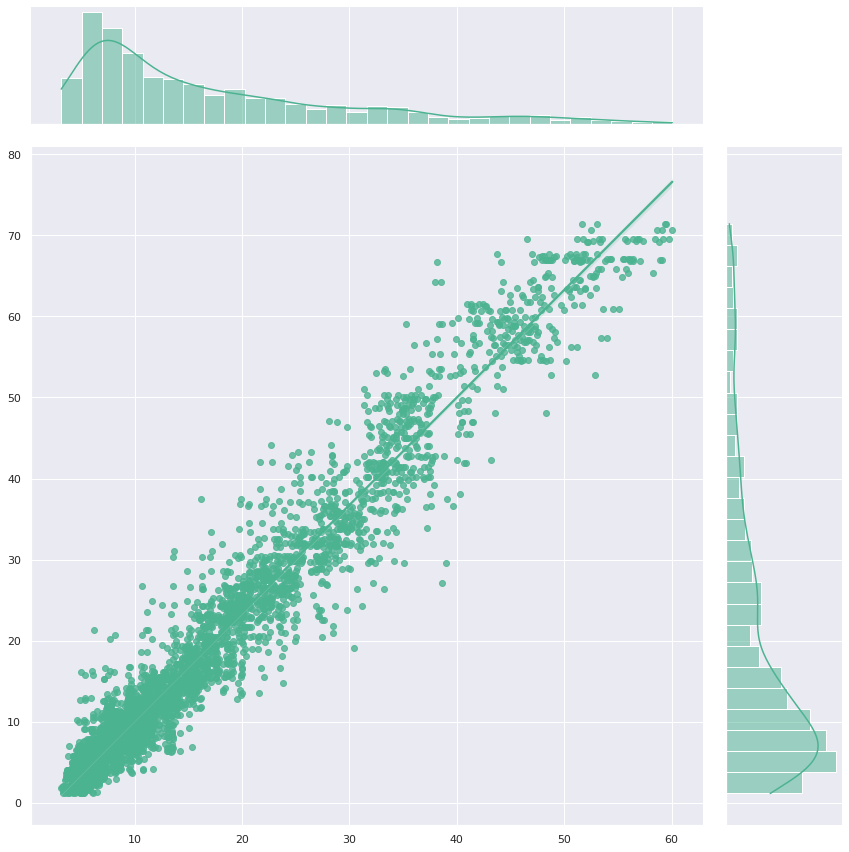

In [ ]:
history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 24, 
                                 epochs = 10, 
                                 modele = model_conv4, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv4, X_test_4, y_test)

Epoch 1/10
152/152 [==============================] - 93s 606ms/step - loss: 18.2939 - val_loss: 8.0497
Epoch 2/10
152/152 [==============================] - 93s 610ms/step - loss: 17.5636 - val_loss: 9.7393
Epoch 3/10
152/152 [==============================] - 84s 552ms/step - loss: 16.8571 - val_loss: 8.5575
Epoch 4/10
152/152 [==============================] - 89s 587ms/step - loss: 18.7545 - val_loss: 8.7199
Epoch 5/10
152/152 [==============================] - 85s 557ms/step - loss: 16.1461 - val_loss: 8.3633
Epoch 6/10
152/152 [==============================] - 84s 551ms/step - loss: 18.3621 - val_loss: 8.6785
Epoch 7/10
152/152 [==============================] - 85s 558ms/step - loss: 17.4529 - val_loss: 8.9649
Epoch 8/10
152/152 [==============================] - 88s 582ms/step - loss: 17.5783 - val_loss: 11.8849
Epoch 9/10
152/152 [==============================] - 92s 607ms/step - loss: 17.9412 - val_loss: 8.8236
Epoch 10/10
32/32 [==============================] - 4s 117ms/s

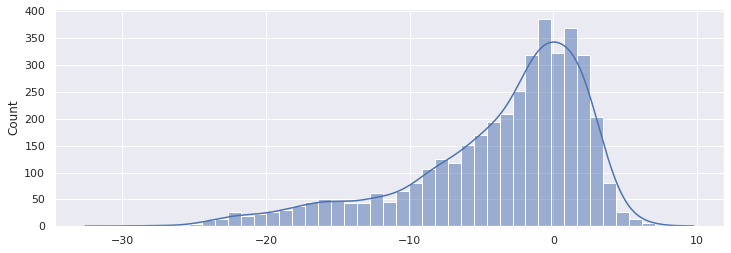

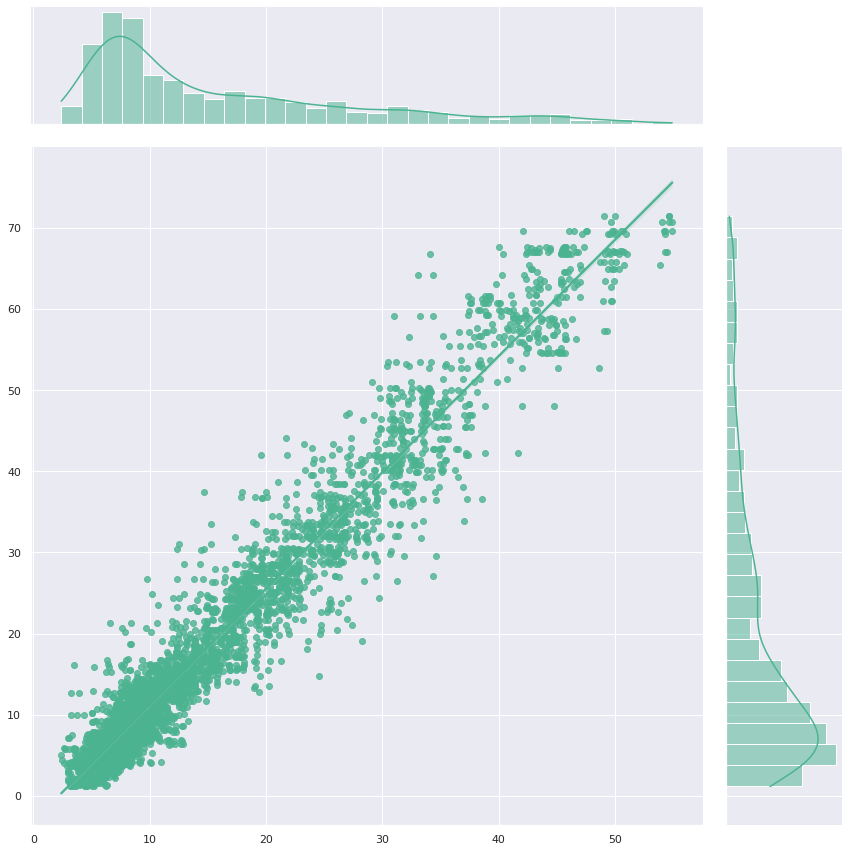

In [ ]:
history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 24, 
                                 epochs = 10, 
                                 modele = model_conv4, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv4, X_test_4, y_test)

Epoch 1/10
152/152 [==============================] - 91s 593ms/step - loss: 16.7110 - val_loss: 10.0217
Epoch 2/10
152/152 [==============================] - 86s 566ms/step - loss: 19.2689 - val_loss: 8.8965
Epoch 3/10
152/152 [==============================] - 83s 549ms/step - loss: 20.2231 - val_loss: 9.0859
Epoch 4/10
152/152 [==============================] - 87s 574ms/step - loss: 16.3016 - val_loss: 9.4741
Epoch 5/10
152/152 [==============================] - 105s 693ms/step - loss: 16.7209 - val_loss: 8.3569
Epoch 6/10
152/152 [==============================] - 90s 591ms/step - loss: 16.5527 - val_loss: 8.2474
Epoch 7/10
152/152 [==============================] - 89s 587ms/step - loss: 18.0133 - val_loss: 11.2277
Epoch 8/10
152/152 [==============================] - 86s 564ms/step - loss: 16.5804 - val_loss: 10.5735
Epoch 9/10
152/152 [==============================] - 85s 559ms/step - loss: 17.4633 - val_loss: 8.4838
Epoch 10/10
32/32 [==============================] - 4s 122m

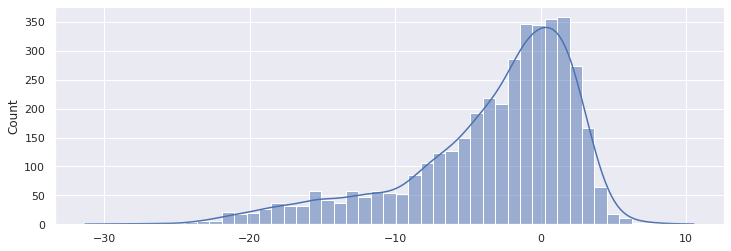

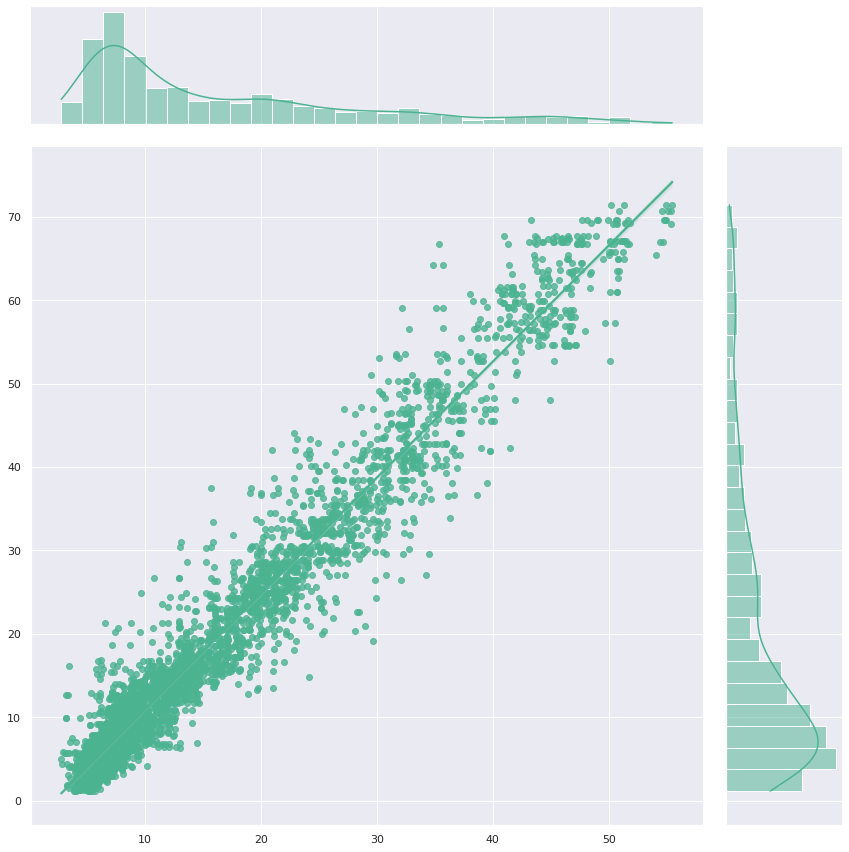

In [ ]:
history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 24, 
                                 epochs = 10, 
                                 modele = model_conv4, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv4, X_test_4, y_test)

### Best convolutionnal model
135 min training

Epoch 1/20
152/152 [==============================] - 93s 609ms/step - loss: 14.1467 - val_loss: 8.0934
Epoch 2/20
152/152 [==============================] - 92s 604ms/step - loss: 13.1017 - val_loss: 8.1806
Epoch 3/20
152/152 [==============================] - 92s 607ms/step - loss: 14.3804 - val_loss: 7.5752
Epoch 4/20
152/152 [==============================] - 96s 630ms/step - loss: 13.9058 - val_loss: 7.5704
Epoch 5/20
152/152 [==============================] - 92s 604ms/step - loss: 14.3716 - val_loss: 8.1386
Epoch 6/20
152/152 [==============================] - 90s 591ms/step - loss: 14.2940 - val_loss: 7.5831
Epoch 7/20
152/152 [==============================] - 100s 659ms/step - loss: 13.3065 - val_loss: 7.0890
Epoch 8/20
152/152 [==============================] - 87s 574ms/step - loss: 14.0922 - val_loss: 7.8213
Epoch 9/20
152/152 [==============================] - 88s 577ms/step - loss: 13.8716 - val_loss: 8.3291
Epoch 10/20
152/152 [==============================] - 89s 586m

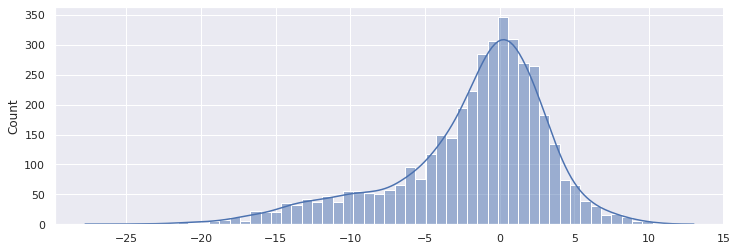

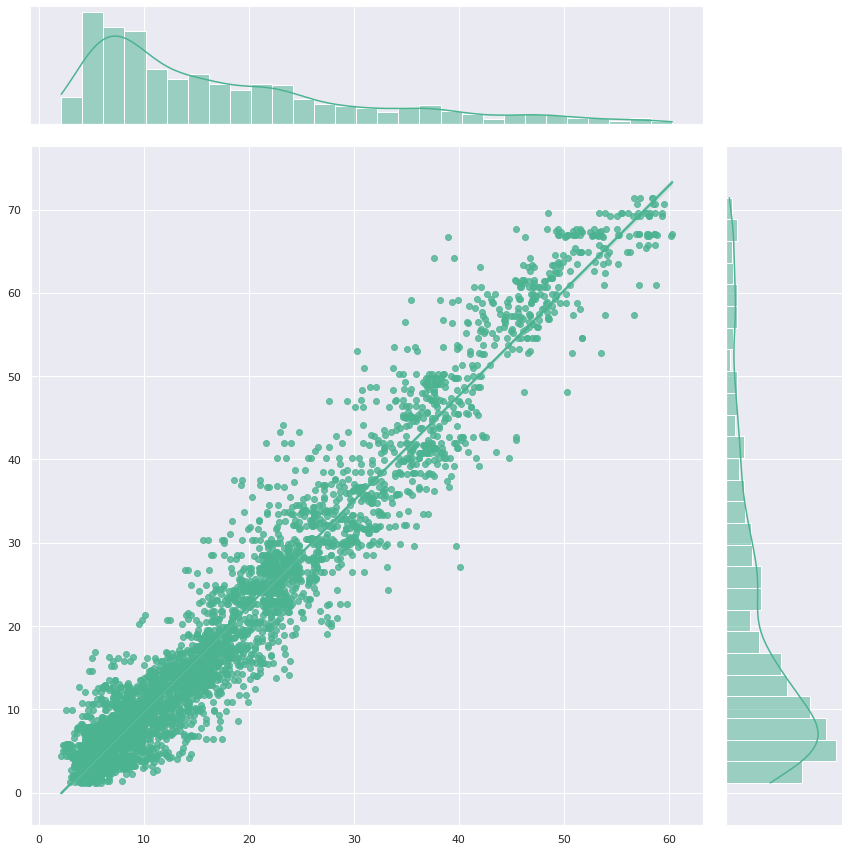

In [ ]:
model_conv6, name = create_model_conv2(inputs_shape = 4274, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.05,
                           max_pool_size = 2,
                           filter_size_1 = 48,
                           filter_size_2 = 48)

version = "f148_f248_b24"

loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()


model_conv6p=model_conv6

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 24, 
                                 epochs = 20, 
                                 modele = model_conv6p, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)
# 90 epoch
model_evaluate(model_conv6p, X_test_4, y_test)

## LSTM


### LSTM Testing

In [ ]:
def create_model_conv_lstm2(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',kernel_siz = 6,dropout = True, dropout_rate = 0.05,max_pool_size = 2):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    name += '_conv1d_conv1d_flatten'
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)

    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(tf.keras.layers.MaxPooling1D(2, padding="same"))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(tf.keras.layers.MaxPooling1D(2, padding="same"))

    model.add(tf.keras.layers.LSTM(64, activation="tanh", return_sequences=True))
    # model.add(tf.keras.layers.LSTM(64, activation="tanh", return_sequences=True))

    model.add(layers.Flatten())

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]



model_conv_lstm2, name = create_model_conv_lstm2(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 6,
                           dropout_rate= 0.1,
                           max_pool_size = 2)

version = input('Changement effectué si même réseau de neurones ou version si différent : ')
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 48, 
                                 epochs = 30, 
                                 modele = model_conv_lstm2, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv_lstm2, X_test_4, y_test)



Model: "model_EDF_512__conv1d_conv1d_flatten256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 4293, 32)          224       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 2147, 32)         0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 2142, 32)          6176      
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 1071, 32)         0         
 1D)                                                             
                                                                 
 lstm (LSTM)                 (None, 1071, 64)          24832     
                                                                 

KeyboardInterrupt: ignored

In [ ]:
def create_model_conv_lstm2(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',kernel_siz = 6,dropout = True, dropout_rate = 0.05,max_pool_size = 2):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    name += '_conv1d_conv1d_flatten'
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)

    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(tf.keras.layers.MaxPooling1D(2, padding="same"))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(tf.keras.layers.MaxPooling1D(2, padding="same"))

    model.add(tf.keras.layers.LSTM(64, activation="tanh", return_sequences=True))
    # model.add(tf.keras.layers.LSTM(64, activation="tanh", return_sequences=True))

    model.add(layers.Flatten())

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]

In [ ]:
aaa

Model: "model_EDF_512__conv1d_conv1d_flatten256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 4287, 32)          416       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 2144, 32)         0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 2133, 32)          12320     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 1067, 32)         0         
 1D)                                                             
                                                                 
 lstm (LSTM)                 (None, 1067, 64)          24832     
                                                                 

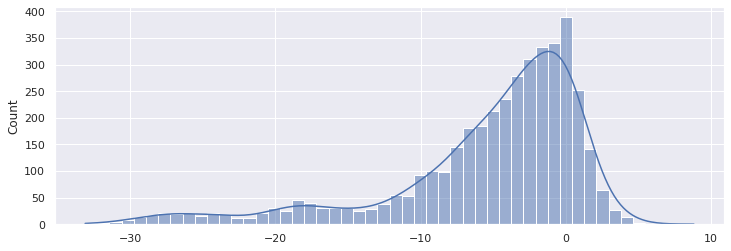

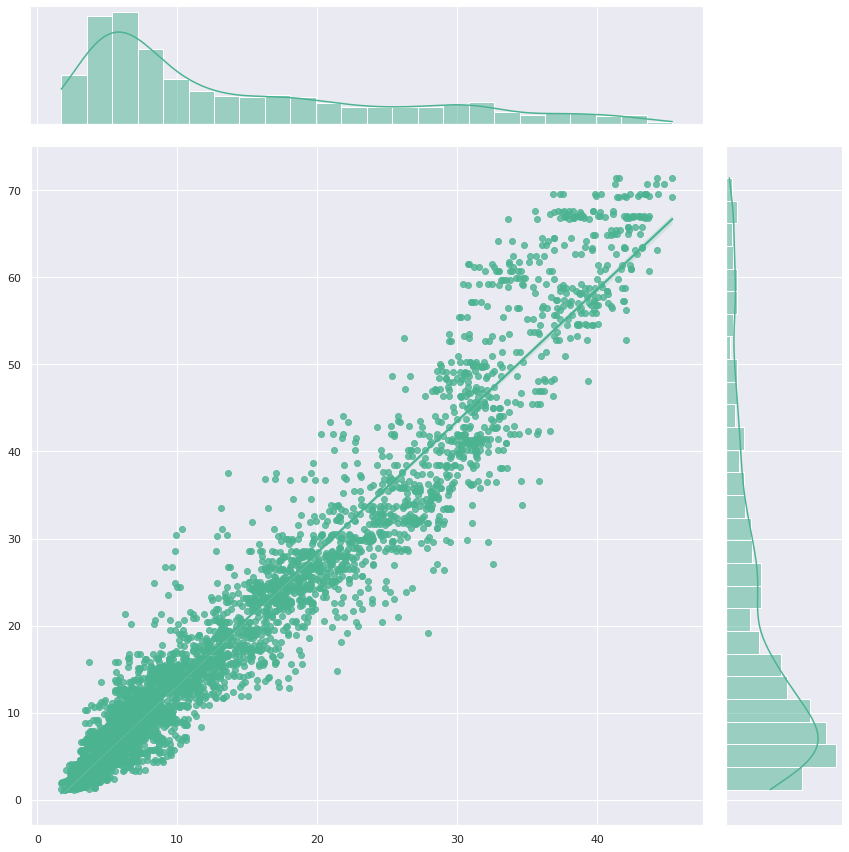

In [ ]:


# modifier directement X pour redefinir correctement X_test de manière aléatoire sans données successives


model_conv_lstm2, name = create_model_conv_lstm2(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 12,
                           dropout_rate= 0.05,
                           max_pool_size = 2)

version = "1.0"
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 64, 
                                 epochs = 30, 
                                 modele = model_conv_lstm2, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv_lstm2, X_test_4, y_test)

In [ ]:
# éventuellement réduire la taille du batch pour soulager la mémoire

Epoch 1/30
57/57 [==============================] - 142s 2s/step - loss: 30.4304 - val_loss: 12.9232
Epoch 2/30
57/57 [==============================] - 125s 2s/step - loss: 29.9945 - val_loss: 14.3071
Epoch 3/30
57/57 [==============================] - 132s 2s/step - loss: 31.6601 - val_loss: 17.4684
Epoch 4/30
57/57 [==============================] - 131s 2s/step - loss: 29.1089 - val_loss: 7.5642
Epoch 5/30
57/57 [==============================] - 127s 2s/step - loss: 27.3179 - val_loss: 19.4589
Epoch 6/30
57/57 [==============================] - 126s 2s/step - loss: 29.4735 - val_loss: 8.3569
Epoch 7/30
57/57 [==============================] - 131s 2s/step - loss: 29.4324 - val_loss: 8.2892
Epoch 8/30
57/57 [==============================] - 134s 2s/step - loss: 28.2235 - val_loss: 9.9343
Epoch 9/30
57/57 [==============================] - 128s 2s/step - loss: 27.2319 - val_loss: 8.8931
Epoch 10/30
57/57 [==============================] - 130s 2s/step - loss: 26.7458 - val_loss: 13

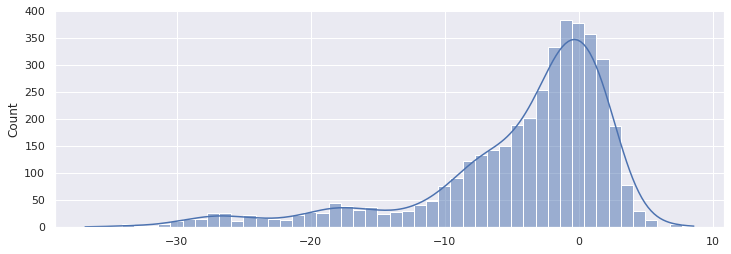

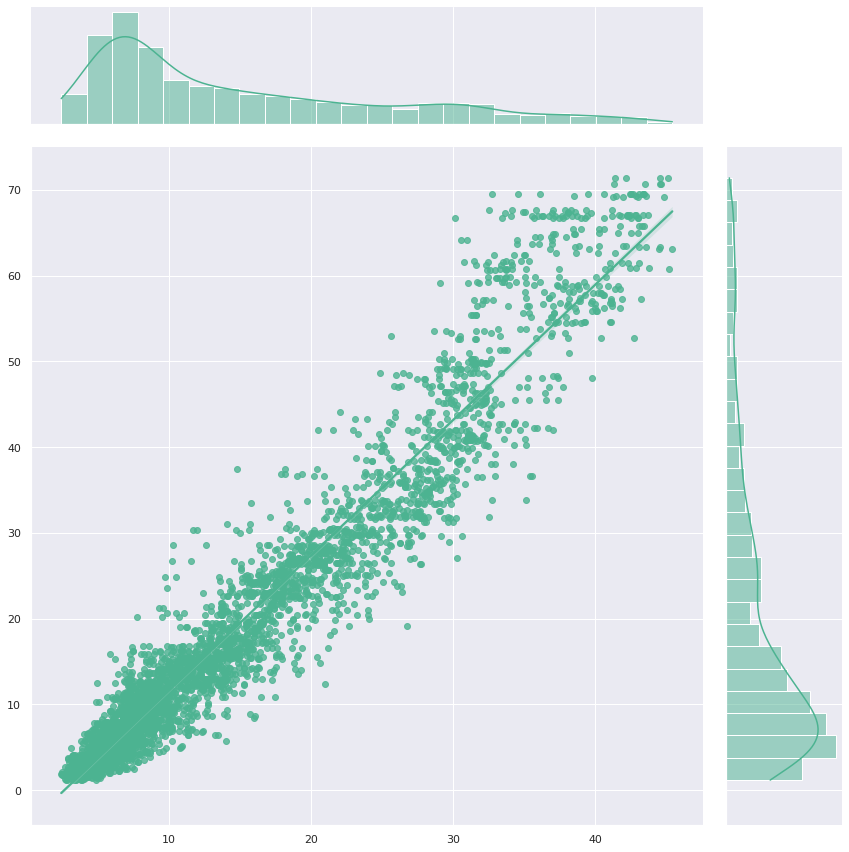

In [ ]:
history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 64, 
                                 epochs = 30, 
                                 modele = model_conv_lstm2, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv_lstm2, X_test_4, y_test)

In [ ]:
history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 64, 
                                 epochs = 30, 
                                 modele = model_conv_lstm2, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv_lstm2, X_test_4, y_test)

Epoch 1/30
57/57 [==============================] - 153s 3s/step - loss: 21.5724 - val_loss: 7.3847
Epoch 2/30
57/57 [==============================] - 131s 2s/step - loss: 19.7101 - val_loss: 8.6919
Epoch 3/30
57/57 [==============================] - 133s 2s/step - loss: 21.8365 - val_loss: 13.7881
Epoch 4/30
31/57 [===============>..............] - ETA: 51s - loss: 19.6309

Model: "model_EDF_512__conv1d_conv1d_flatten256_128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 4287, 32)          416       
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 2144, 32)         0         
 1D)                                                             
                                                                 
 conv1d_3 (Conv1D)           (None, 2133, 32)          12320     
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 1067, 32)         0         
 1D)                                                             
                                                                 
 lstm_1 (LSTM)               (None, 1067, 64)          24832     
                                                                 

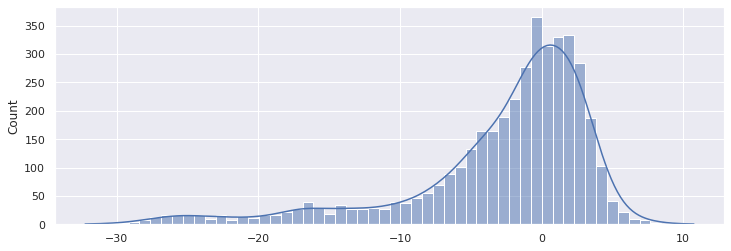

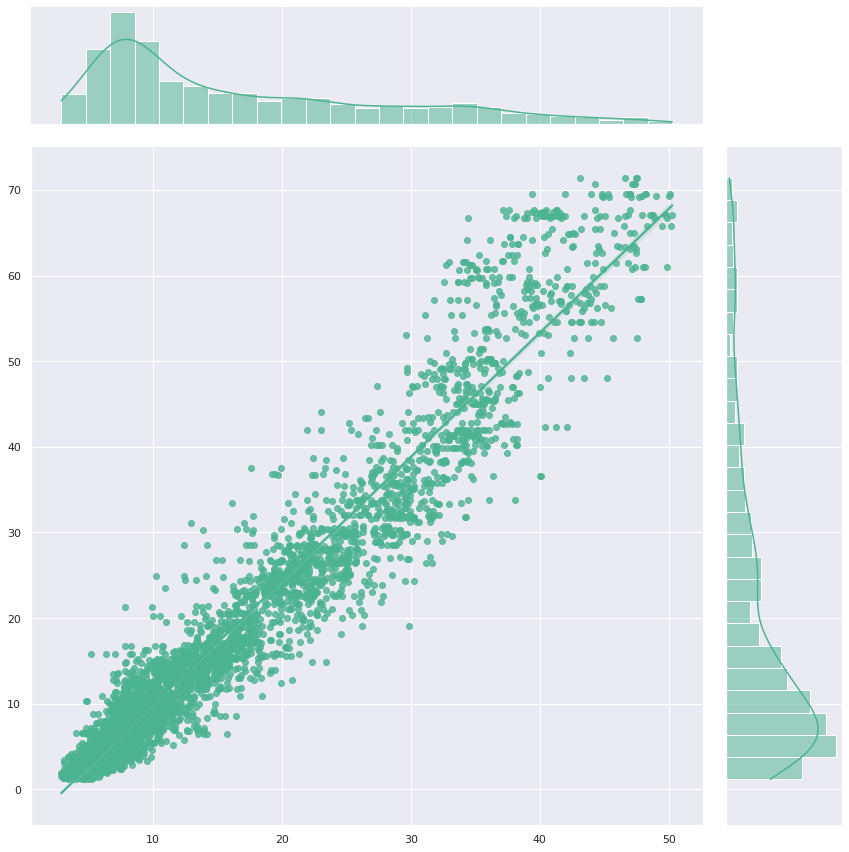

In [ ]:


# modifier directement X pour redefinir correctement X_test de manière aléatoire sans données successives


model_conv_lstm2, name = create_model_conv_lstm2(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = ( 512, 256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 12,
                           dropout_rate= 0.05,
                           max_pool_size = 2)

version = "1.1"
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 64, 
                                 epochs = 80, 
                                 modele = model_conv_lstm2, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv_lstm2, X_test_4, y_test)

Epoch 1/20
57/57 [==============================] - 123s 2s/step - loss: 21.9090 - val_loss: 7.3575
Epoch 2/20
57/57 [==============================] - 111s 2s/step - loss: 20.0411 - val_loss: 13.1489
Epoch 3/20
57/57 [==============================] - 119s 2s/step - loss: 17.7901 - val_loss: 12.6476
Epoch 4/20
57/57 [==============================] - 118s 2s/step - loss: 16.4926 - val_loss: 12.5226
Epoch 5/20
57/57 [==============================] - 116s 2s/step - loss: 18.1663 - val_loss: 9.3734
Epoch 6/20
57/57 [==============================] - 119s 2s/step - loss: 17.0543 - val_loss: 8.9342
Epoch 7/20
57/57 [==============================] - 120s 2s/step - loss: 17.1753 - val_loss: 8.4531
Epoch 8/20
57/57 [==============================] - 119s 2s/step - loss: 16.8879 - val_loss: 7.4153
Epoch 9/20
57/57 [==============================] - 117s 2s/step - loss: 17.3028 - val_loss: 8.6212
Epoch 10/20
57/57 [==============================] - 116s 2s/step - loss: 17.4510 - val_loss: 11.

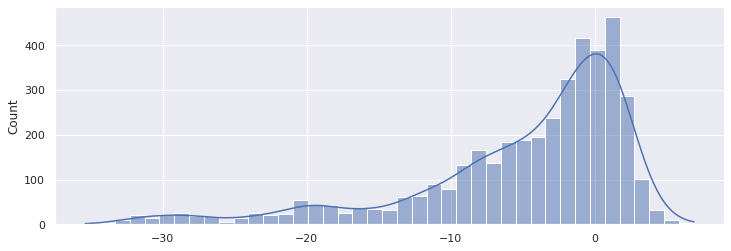

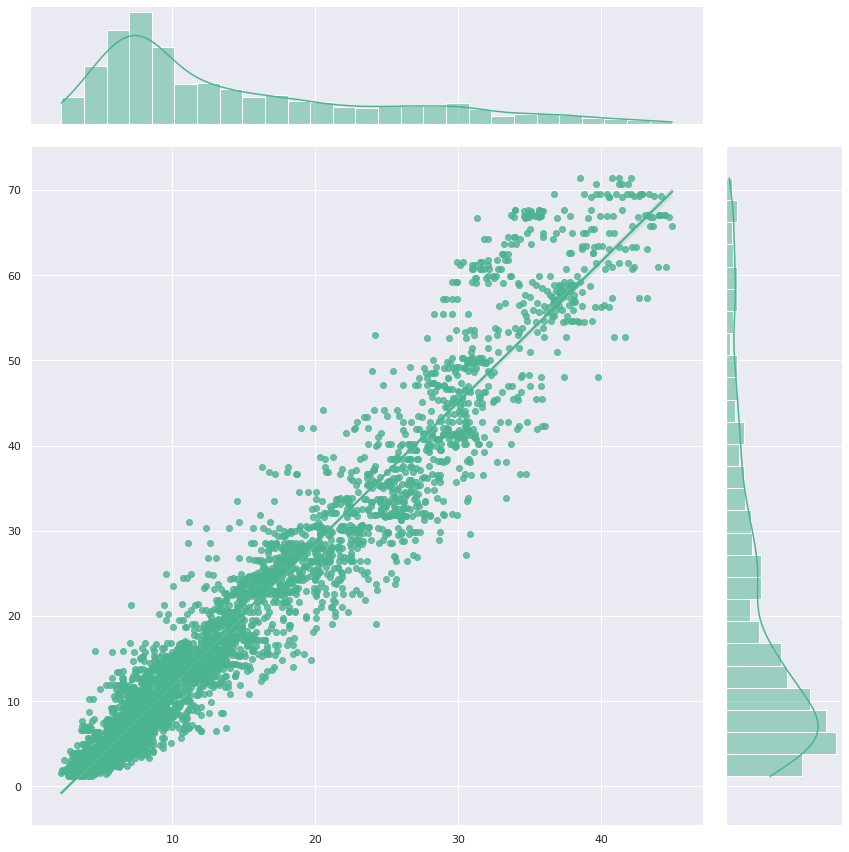

In [ ]:
version = "1.2"
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 64, 
                                 epochs = 20, 
                                 modele = model_conv_lstm2, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv_lstm2, X_test_4, y_test)

In [ ]:
history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 64, 
                                 epochs = 30, 
                                 modele = model_conv_lstm2, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv_lstm2, X_test_4, y_test)

In [ ]:
def create_model_conv_lstm3(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',kernel_siz = 6,dropout = True, dropout_rate = 0.05,max_pool_size = 2):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    name += '_conv1d_conv1d_flatten'
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)

    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(tf.keras.layers.MaxPooling1D(2, padding="same"))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(tf.keras.layers.MaxPooling1D(2, padding="same"))

    model.add(tf.keras.layers.LSTM(64, activation="tanh", return_sequences=True))
    model.add(tf.keras.layers.LSTM(64, activation="tanh", return_sequences=True))

    model.add(layers.Flatten())

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]





Model: "model_EDF_256__conv1d_conv1d_flatten128_64_32_16_8_True_dropout"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 4287, 32)          416       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 2144, 32)         0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 2133, 32)          12320     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 1067, 32)         0         
 1D)                                                             
                                                                 
 lstm (LSTM)                 (None, 1067, 64)          24832     
                                                                 
 ls

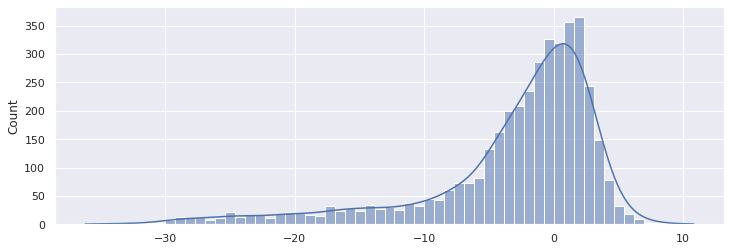

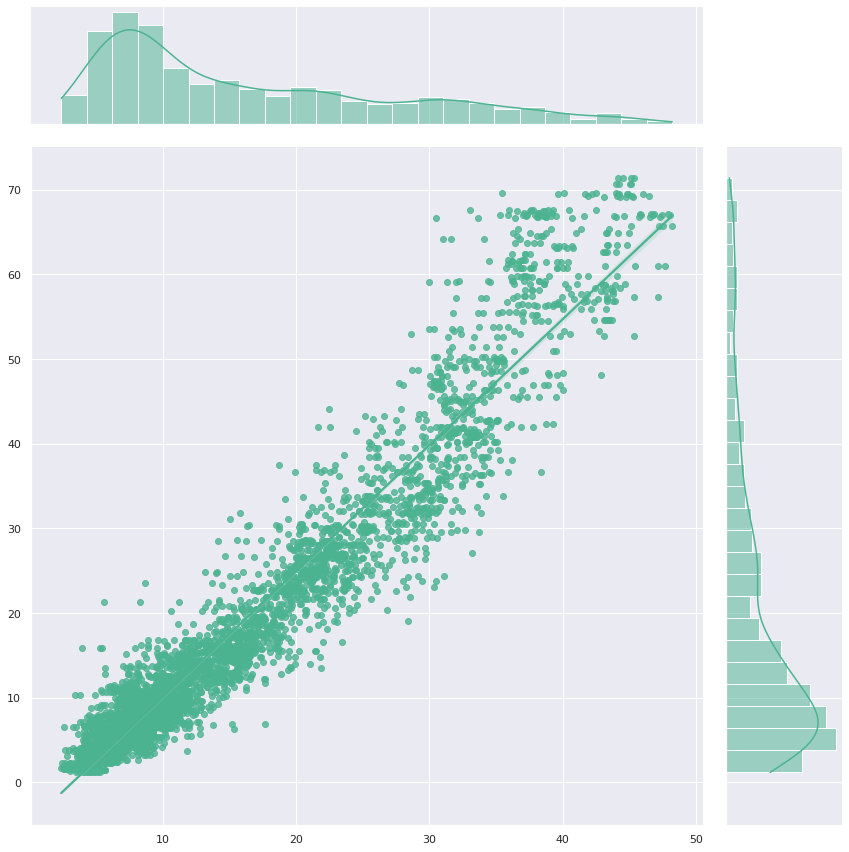

In [ ]:
model_conv_lstm3, name = create_model_conv_lstm3(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (  256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 12,
                           dropout_rate= 0.05,
                           max_pool_size = 2)

version = "2.0"
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 32, 
                                 epochs = 50, 
                                 modele = model_conv_lstm3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv_lstm3, X_test_4, y_test)

Epoch 1/20
114/114 [==============================] - 223s 2s/step - loss: 22.3356 - val_loss: 7.8136
Epoch 2/20
114/114 [==============================] - 217s 2s/step - loss: 21.2615 - val_loss: 8.3012
Epoch 3/20
114/114 [==============================] - 218s 2s/step - loss: 22.3315 - val_loss: 8.3665
Epoch 4/20
114/114 [==============================] - 219s 2s/step - loss: 19.9838 - val_loss: 10.6767
Epoch 5/20
114/114 [==============================] - 224s 2s/step - loss: 18.6192 - val_loss: 9.3864
Epoch 6/20
114/114 [==============================] - 215s 2s/step - loss: 20.2181 - val_loss: 8.9691
Epoch 7/20
114/114 [==============================] - 219s 2s/step - loss: 19.8185 - val_loss: 8.5603
Epoch 8/20
114/114 [==============================] - 225s 2s/step - loss: 19.1944 - val_loss: 9.1547
Epoch 9/20
114/114 [==============================] - 220s 2s/step - loss: 19.0605 - val_loss: 8.8180
Epoch 10/20
114/114 [==============================] - 224s 2s/step - loss: 19.37

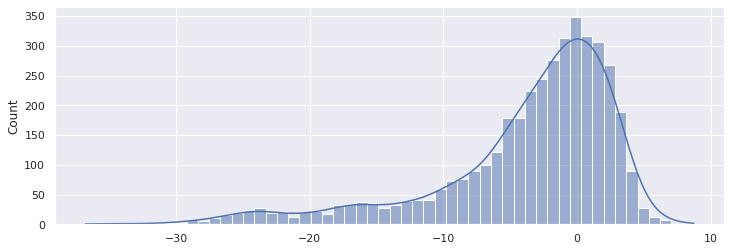

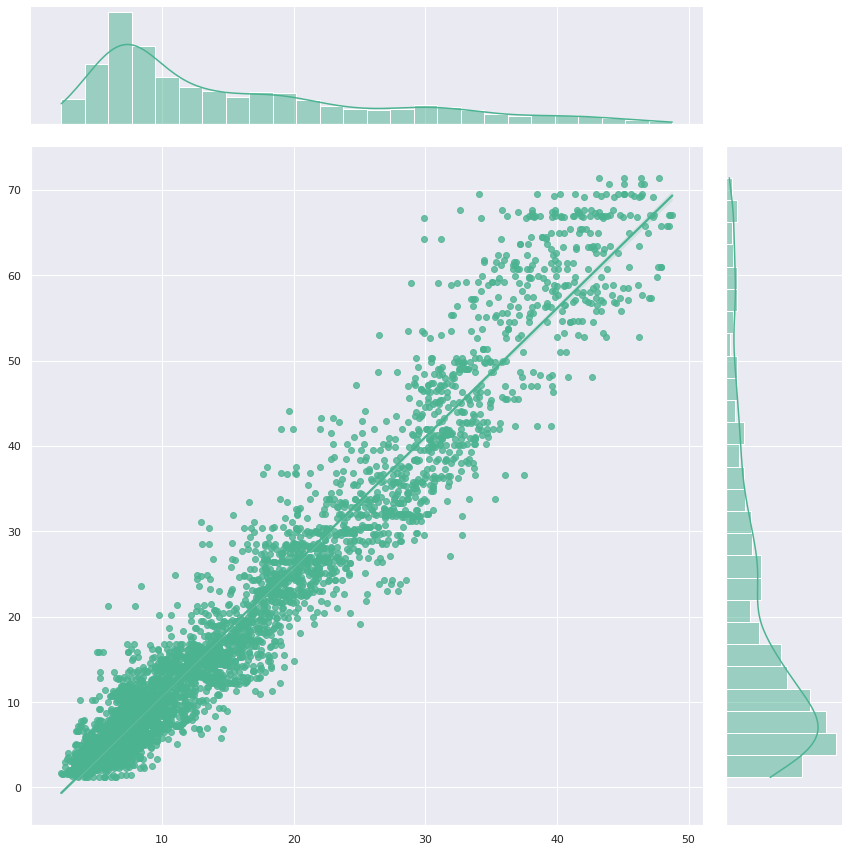

In [ ]:
version = "2.1"
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 32, 
                                 epochs = 20, 
                                 modele = model_conv_lstm3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv_lstm3, X_test_4, y_test)

Epoch 1/10
114/114 [==============================] - 228s 2s/step - loss: 19.0566 - val_loss: 10.7584
Epoch 2/10
114/114 [==============================] - 219s 2s/step - loss: 17.3574 - val_loss: 10.1223
Epoch 3/10
114/114 [==============================] - 210s 2s/step - loss: 17.2459 - val_loss: 9.9173
Epoch 4/10
114/114 [==============================] - 212s 2s/step - loss: 18.5050 - val_loss: 8.4911
Epoch 5/10
114/114 [==============================] - 217s 2s/step - loss: 17.5406 - val_loss: 11.8797
Epoch 6/10
114/114 [==============================] - 211s 2s/step - loss: 17.3144 - val_loss: 8.2115
Epoch 7/10
114/114 [==============================] - 210s 2s/step - loss: 16.1309 - val_loss: 8.6068
Epoch 8/10
114/114 [==============================] - 210s 2s/step - loss: 17.4599 - val_loss: 8.4107
Epoch 9/10
114/114 [==============================] - 203s 2s/step - loss: 15.9403 - val_loss: 9.4157
Epoch 10/10
32/32 [==============================] - 17s 494ms/step
[12.9  10.6

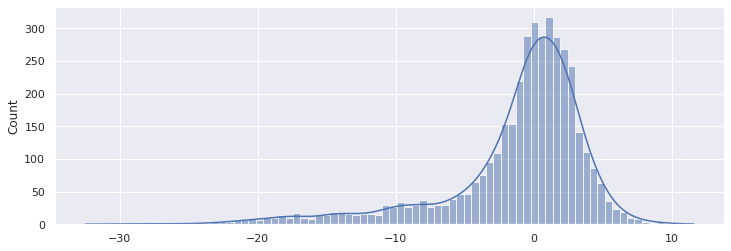

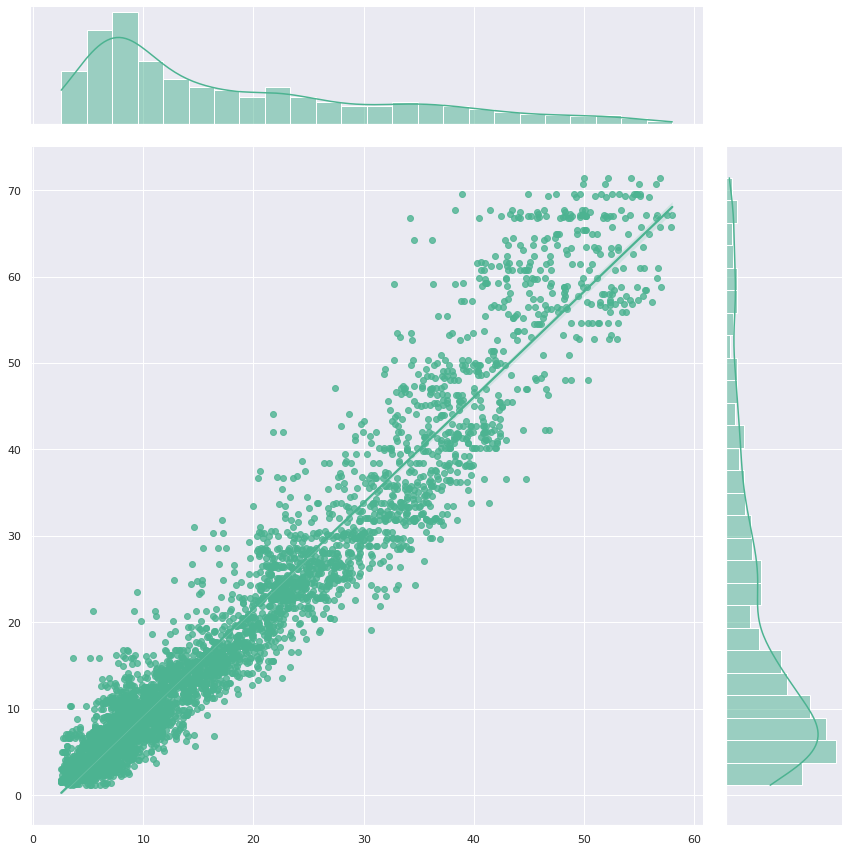

In [ ]:
version = "2.2"
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 32, 
                                 epochs = 10, 
                                 modele = model_conv_lstm3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv_lstm3, X_test_4, y_test)

Epoch 1/10
114/114 [==============================] - 214s 2s/step - loss: 17.0596 - val_loss: 8.4367
Epoch 2/10
114/114 [==============================] - 207s 2s/step - loss: 17.2336 - val_loss: 8.2752
Epoch 3/10
114/114 [==============================] - 211s 2s/step - loss: 17.3512 - val_loss: 9.4313
Epoch 4/10
114/114 [==============================] - 204s 2s/step - loss: 16.8293 - val_loss: 9.1157
Epoch 5/10
114/114 [==============================] - 209s 2s/step - loss: 17.9609 - val_loss: 9.0287
Epoch 6/10
114/114 [==============================] - 209s 2s/step - loss: 17.3974 - val_loss: 9.0165
Epoch 7/10
114/114 [==============================] - 202s 2s/step - loss: 15.9376 - val_loss: 9.9715
Epoch 8/10
114/114 [==============================] - 204s 2s/step - loss: 16.5941 - val_loss: 8.0482
Epoch 9/10
114/114 [==============================] - 209s 2s/step - loss: 18.1916 - val_loss: 9.4290
Epoch 10/10
32/32 [==============================] - 12s 332ms/step
[12.9  10.61  

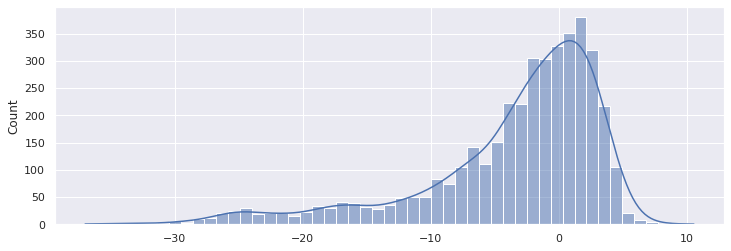

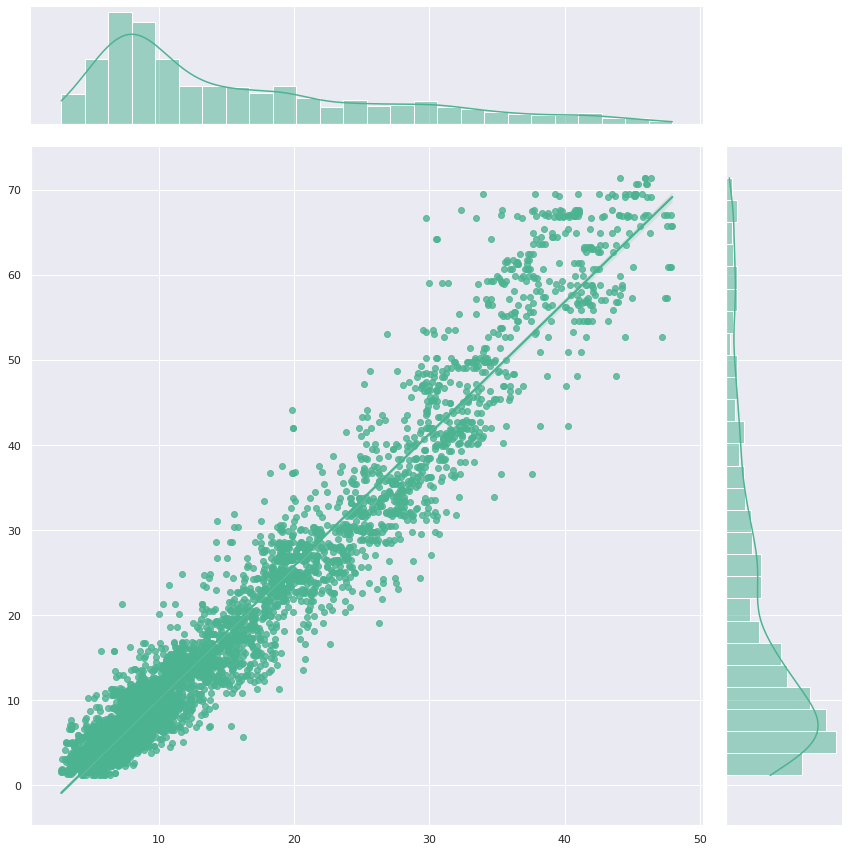

In [ ]:
version = "2.3"
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 32, 
                                 epochs = 10, 
                                 modele = model_conv_lstm3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv_lstm3, X_test_4, y_test)

### Best LSTM

Epoch 1/10
114/114 [==============================] - 228s 2s/step - loss: 19.0566 - val_loss: 10.7584
Epoch 2/10
114/114 [==============================] - 219s 2s/step - loss: 17.3574 - val_loss: 10.1223
Epoch 3/10
114/114 [==============================] - 210s 2s/step - loss: 17.2459 - val_loss: 9.9173
Epoch 4/10
114/114 [==============================] - 212s 2s/step - loss: 18.5050 - val_loss: 8.4911
Epoch 5/10
114/114 [==============================] - 217s 2s/step - loss: 17.5406 - val_loss: 11.8797
Epoch 6/10
114/114 [==============================] - 211s 2s/step - loss: 17.3144 - val_loss: 8.2115
Epoch 7/10
114/114 [==============================] - 210s 2s/step - loss: 16.1309 - val_loss: 8.6068
Epoch 8/10
114/114 [==============================] - 210s 2s/step - loss: 17.4599 - val_loss: 8.4107
Epoch 9/10
114/114 [==============================] - 203s 2s/step - loss: 15.9403 - val_loss: 9.4157
Epoch 10/10
32/32 [==============================] - 17s 494ms/step
[12.9  10.6

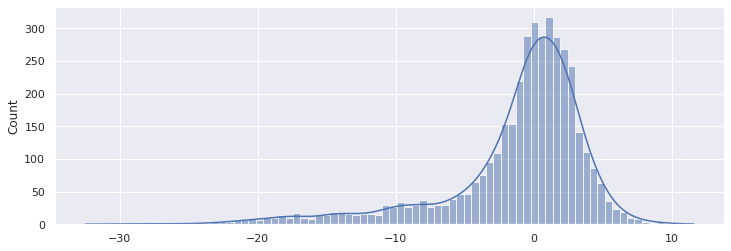

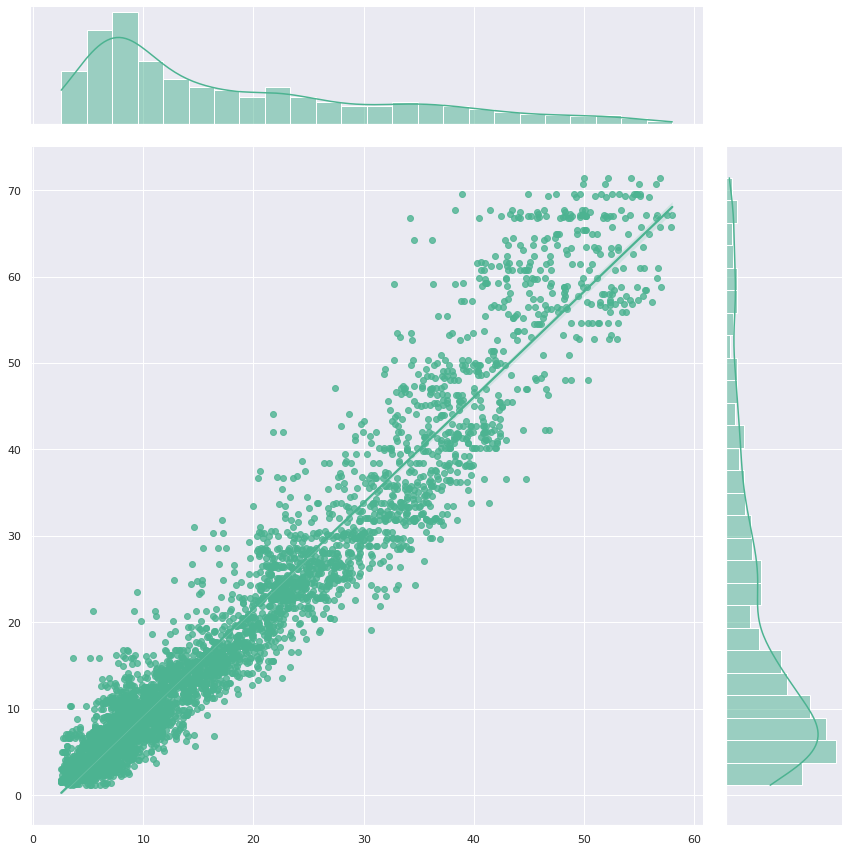

In [ ]:
def create_model_conv_lstm3(inputs_shape, outputs_shape, hidden_shape, activation ='relu', kernel_initializer = 'he_normal',kernel_siz = 6,dropout = True, dropout_rate = 0.05,max_pool_size = 2):
    
    name = 'model_EDF_' + str(hidden_shape[0]) + '_'
    name += '_conv1d_conv1d_flatten'
    for index in range(1, len(hidden_shape)):
      name = name + str(hidden_shape[index])+ '_'
    
    name = name + str(dropout) + '_dropout'

    model = keras.Sequential(name = name)

    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(tf.keras.layers.MaxPooling1D(2, padding="same"))
    model.add(layers.Conv1D(filters=32, kernel_size=kernel_siz, activation='relu', input_shape=(X_train_2.shape[1], X_train_2.shape[2])))
    model.add(tf.keras.layers.MaxPooling1D(2, padding="same"))

    model.add(tf.keras.layers.LSTM(64, activation="tanh", return_sequences=True))
    model.add(tf.keras.layers.LSTM(64, activation="tanh", return_sequences=True))

    model.add(layers.Flatten())

    for l in range(len(hidden_shape)):
      model.add(layers.Dense(units = hidden_shape[l], activation = activation, kernel_initializer = kernel_initializer))
      if dropout:
        model.add(layers.Dropout(dropout_rate))
    
    model.add(layers.Dense(units = outputs_shape))

    model.summary()

    return [model, name]





model_conv_lstm3, name = create_model_conv_lstm3(inputs_shape = 4272, 
                           outputs_shape = 4, 
                           hidden_shape = (  256, 128, 64, 32, 16, 8), 
                           dropout = True,
                           kernel_siz = 12,
                           dropout_rate= 0.05,
                           max_pool_size = 2)

version = "2.2" # 80 epochs
loss = keras.losses.MSE
optimizer = keras.optimizers.RMSprop()

history, dir_model_h5 = training_2(X_train_4, y_train, 
                                 batch_size = 32, 
                                 epochs = 80, 
                                 modele = model_conv_lstm3, 
                                 name = name + '_' + version, 
                                 loss = loss,
                                 optimizer = optimizer)

model_evaluate(model_conv_lstm3, X_test_4, y_test)

# Best models

### Dense


Acceptable for t+1, t+2 & t+3 

Very limited for t+4

**Score Recap :**

---
> t+1 || r2 score = 0.793 || RMSE score = 31.816 || MAPE score = 22.515
---
> t+2 || r2 score = 0.771 || RMSE score = 35.189 || MAPE score = 23.889
---
> t+1 || r2 score = 0.702 || RMSE score = 43.378 || MAPE score = 26.906
---
> t+1 || r2 score = 0.614 || RMSE score = 53.763 || MAPE score = 31.119
---



In [19]:
# model3 = keras.models.load_model('/content/gdrive/MyDrive/Deep Learning/Models/model_Dense.h5')
model3 = keras.models.load_model('Models/model_Dense.h5')
pred3 = model3.predict(X_test_4)

32/32 [==============================] - 1s 13ms/step


[12.9  10.61  6.83 ...  3.93  3.78  3.69]
[10.239719  10.198141  10.140436  ...  4.389311   5.179115   5.0152426]
Variance Score = 0.8672080203922578
Moyenne des biais = -1.86182977977651
r2 score = 0.8549559261849914
RMSE score = 41.03643329037277
Mean Absolute Percentage Error = 32.86322357367691


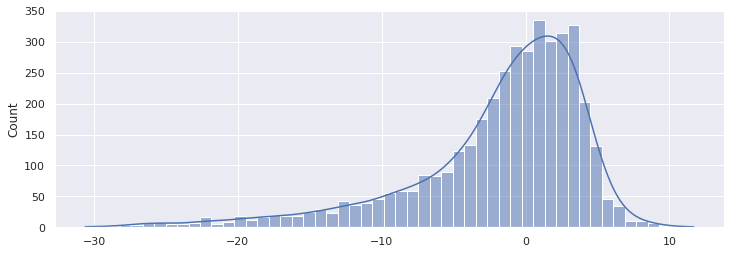

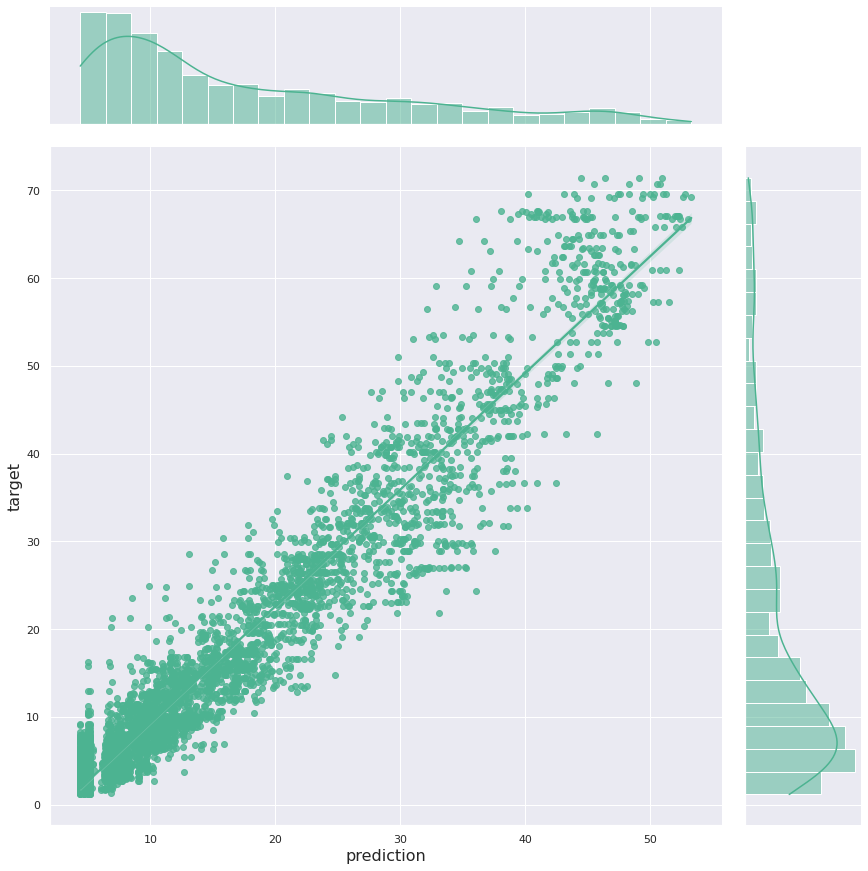

In [20]:
model_evaluateb(model3,pred3,test)

Wind Load Factor at t + 1
[12.9  10.61  6.83 ...  3.7   4.01  4.27]
[10.239719   9.936762   9.299117  ...  4.6496844  4.6496844  4.6496844]
Variance Score = 0.8976575955975163
Moyenne des biais = -1.6991363872780383
r2 score = 0.8874440392242863
RMSE score = 31.816176709804676
Mean Absolute Percentage Error = 29.733417765783543



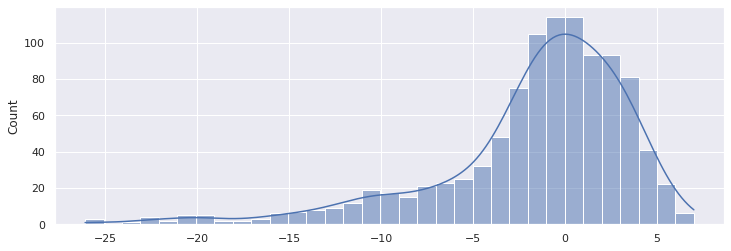

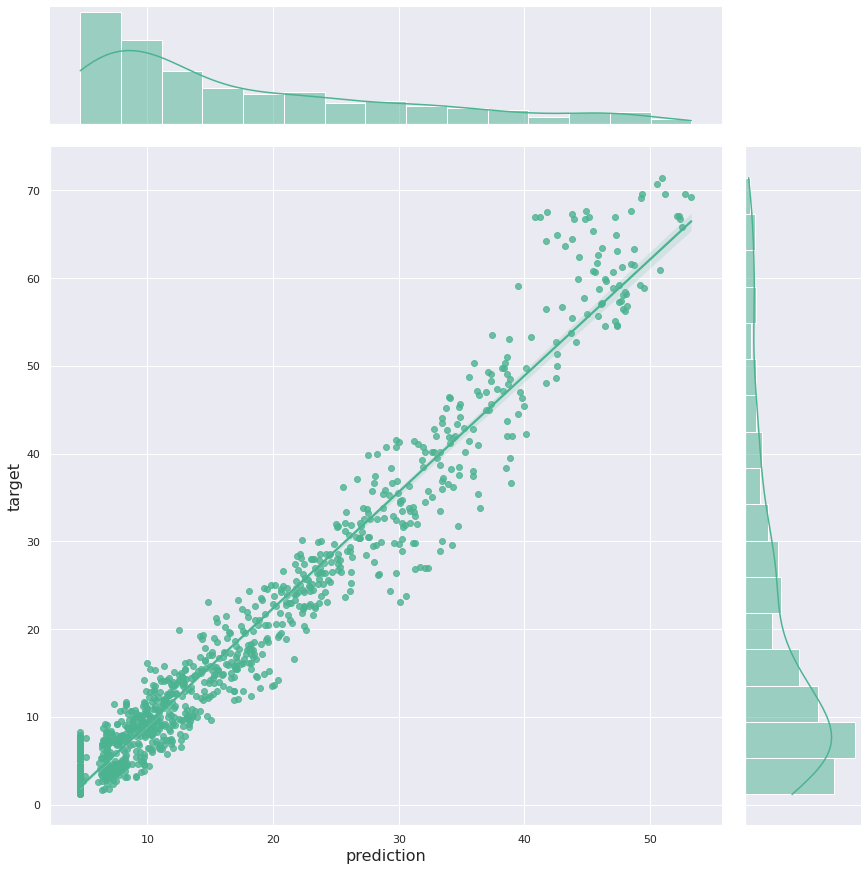

In [ ]:
i=0

print('Wind Load Factor at t + ' + str(i+1))
model_evaluateb(model3,pred3[:,i],test[:,i])
print()

Wind Load Factor at t + 2
[10.61  6.83  4.2  ...  4.01  4.27  3.93]
[10.198141  9.896486  9.261576 ...  4.389311  4.389311  4.389311]
Variance Score = 0.886992007217055
Moyenne des biais = -1.7951274788791551
r2 score = 0.8755998141951811
RMSE score = 35.1887860012741
Mean Absolute Percentage Error = 29.720886855456936



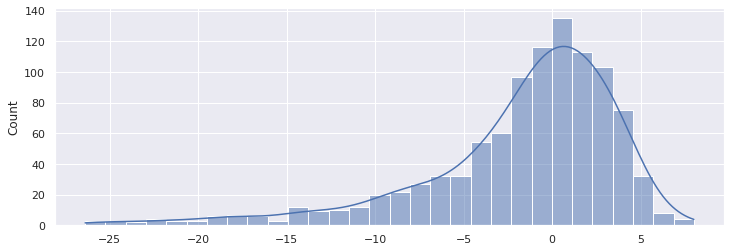

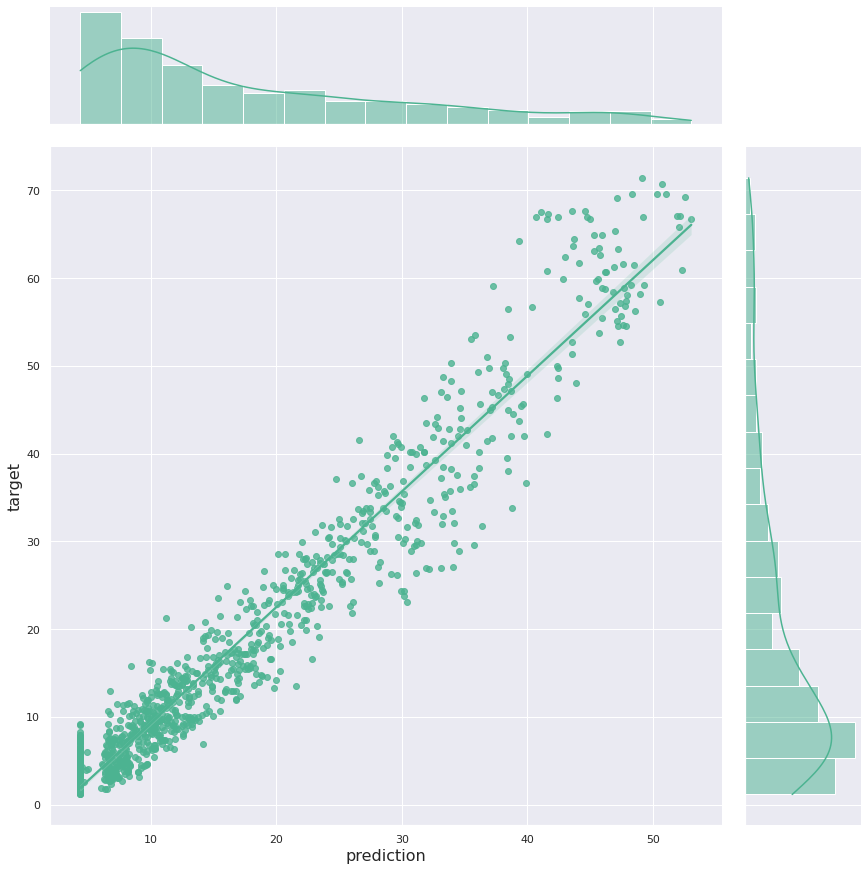

In [ ]:
i=1

print('Wind Load Factor at t + ' + str(i+1))
model_evaluateb(model3,pred3[:,i],test[:,i])
print()

Wind Load Factor at t + 3
[6.83 4.2  4.09 ... 4.27 3.93 3.78]
[10.140436  9.84428   9.220989 ...  5.179115  5.179115  5.179115]
Variance Score = 0.8593819741048324
Moyenne des biais = -1.8915381920184695
r2 score = 0.846740703174809
RMSE score = 43.37767978077996
Mean Absolute Percentage Error = 34.16655316337647



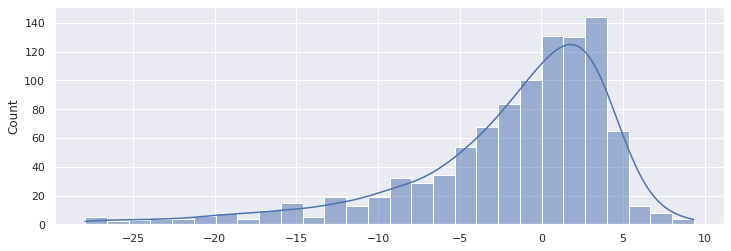

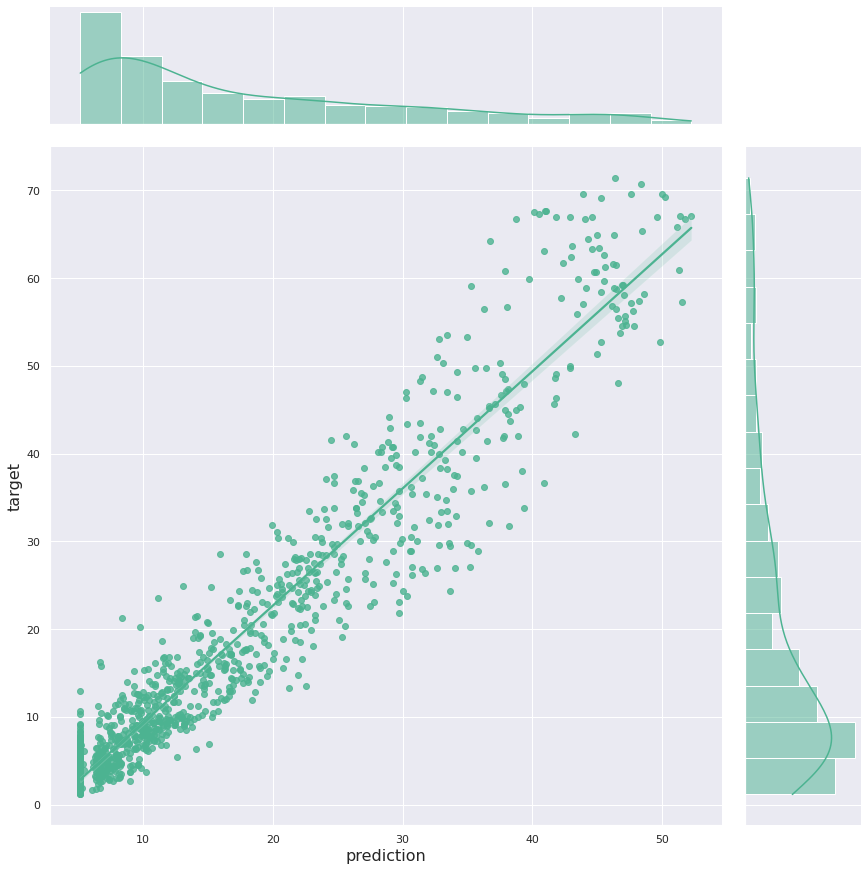

In [ ]:
i=2

print('Wind Load Factor at t + ' + str(i+1))
model_evaluateb(model3,pred3[:,i],test[:,i])
print()

Wind Load Factor at t + 4
[4.2  4.09 4.5  ... 3.93 3.78 3.69]
[10.207662   9.919184   9.312113  ...  5.0152426  5.0152426  5.0152426]
Variance Score = 0.8251177487485433
Moyenne des biais = -2.0615170609303783
r2 score = 0.8101071411266632
RMSE score = 53.763090669632334
Mean Absolute Percentage Error = 37.8320365100907



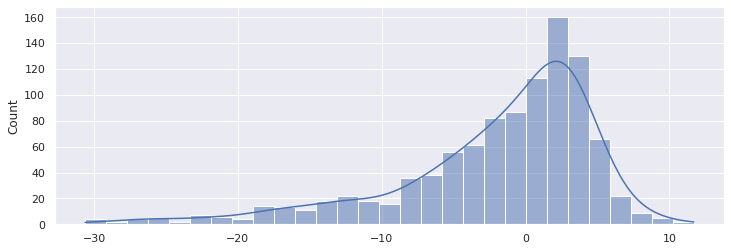

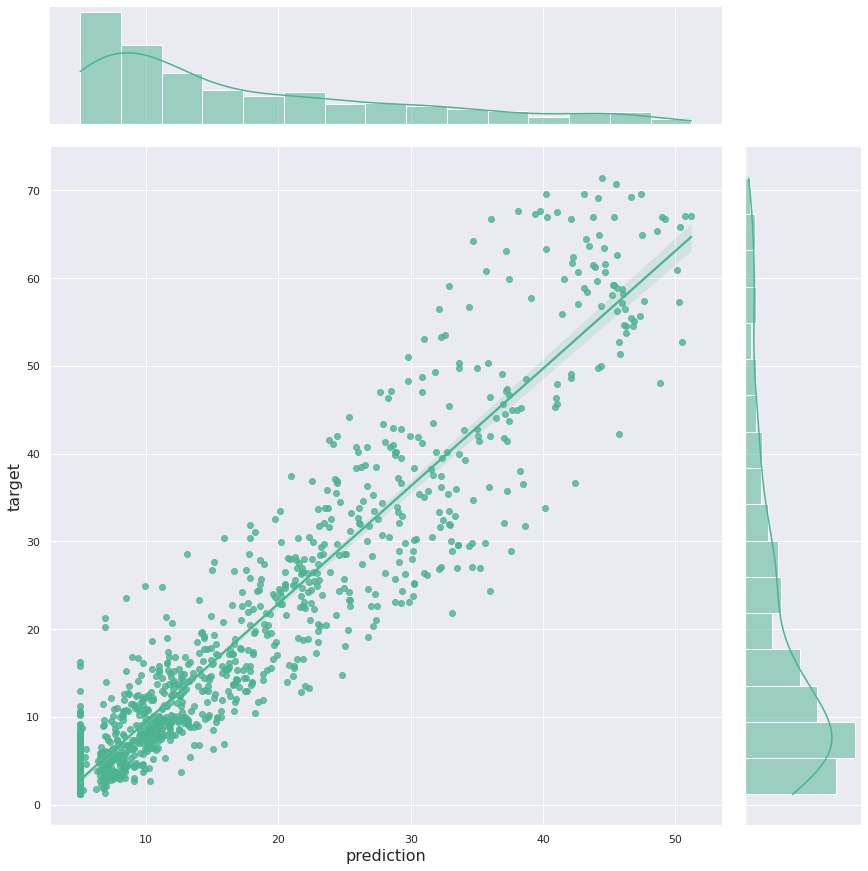

In [ ]:
i=3

print('Wind Load Factor at t + ' + str(i+1))
model_evaluateb(model3,pred3[:,i],test[:,i])
print()

### Conv + Dense



Good for t+1, t+2 & t+3 

Acceptable for t+4

**Score Recap :**

---
> t+1 || r2 score = 0.871 || RMSE score = 22.516 || MAPE score = 20.320
---
> t+2 || r2 score = 0.861 || RMSE score = 24.248 || MAPE score = 21.853
---
> t+1 || r2 score = 0.824 || RMSE score = 30.181 || MAPE score = 25.076
---
> t+1 || r2 score = 0.768 || RMSE score = 38.656 || MAPE score = 28.381
---













In [21]:
# model1 = keras.models.load_model('/content/gdrive/MyDrive/Deep Learning/Models/model_Conv_Dense.h5')
model1 = keras.models.load_model('Models/model_Conv_Dense.h5')
pred1 = model1.predict(X_test_4)

32/32 [==============================] - 4s 137ms/step


[12.9  10.61  6.83 ...  3.93  3.78  3.69]
[12.79689   13.078204  13.4518585 ...  5.963508   6.4177923  6.9036126]
Variance Score = 0.9050642886684541
Moyenne des biais = -1.4284892634342827
r2 score = 0.897851813290687
RMSE score = 28.900162132618735
Mean Absolute Percentage Error = 31.06760270140266


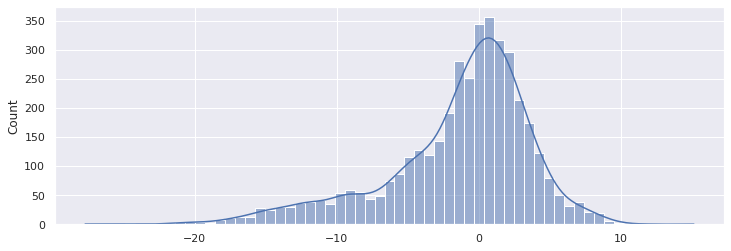

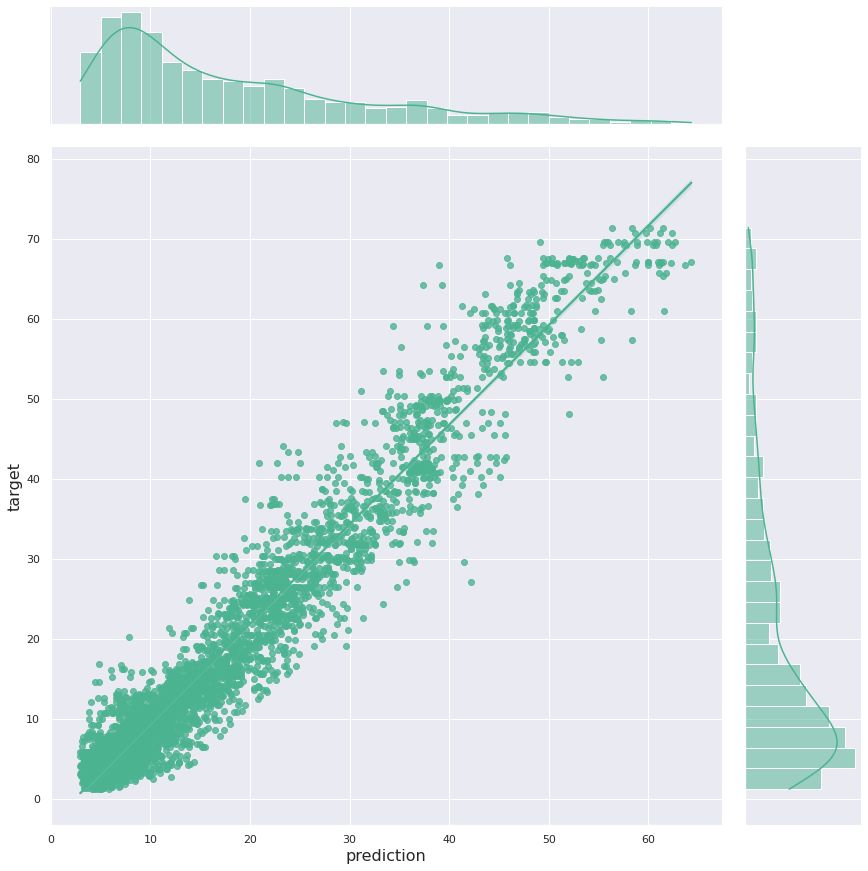

In [22]:
model_evaluateb(model1,pred1,test)

Wind Load Factor at t + 1
[12.9  10.61  6.83 ...  3.7   4.01  4.27]
[12.79689   10.176051   8.489629  ...  6.013464   6.1981173  5.655303 ]
Variance Score = 0.9344532165423959
Moyenne des biais = -1.9970869280861256
r2 score = 0.9203436248113208
RMSE score = 22.516455739875482
Mean Absolute Percentage Error = 24.19280573088235



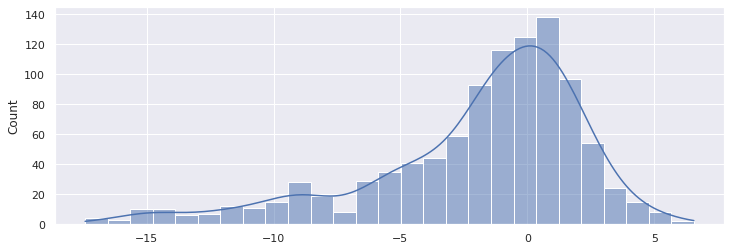

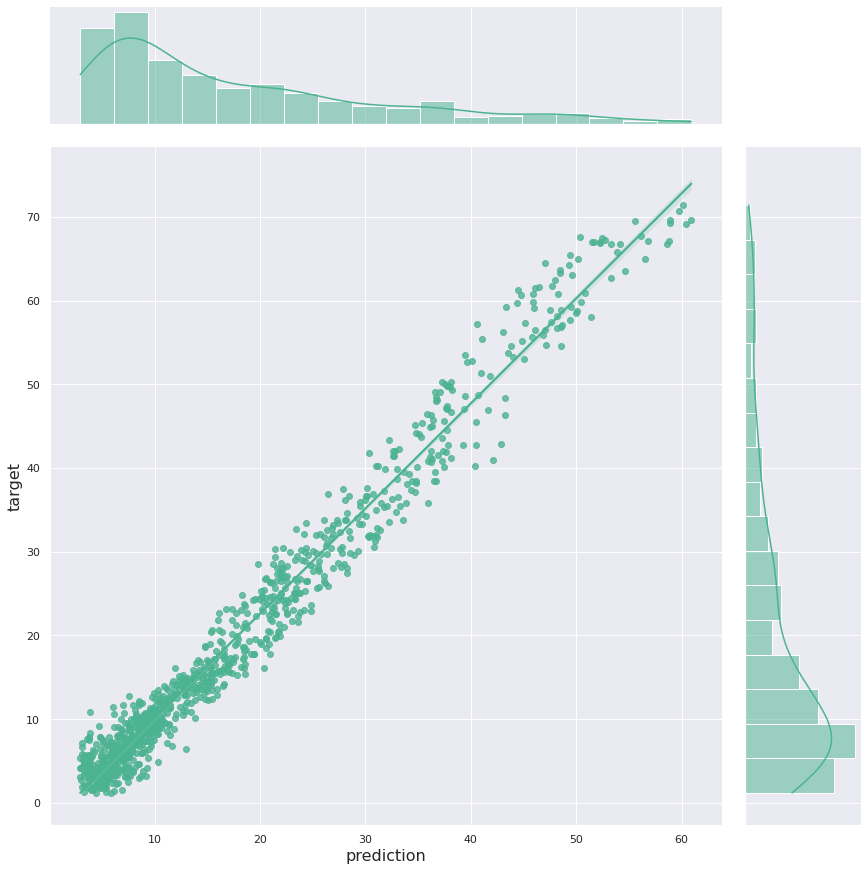

In [ ]:
i=0

print('Wind Load Factor at t + ' + str(i+1))
model_evaluateb(model1,pred1[:,i],test[:,i])
print()

Wind Load Factor at t + 2
[10.61  6.83  4.2  ...  4.01  4.27  3.93]
[13.078204 10.909126  9.487207 ...  6.38415   6.380023  5.963508]
Variance Score = 0.9239035237943217
Moyenne des biais = -1.6499916050111672
r2 score = 0.9142789786470649
RMSE score = 24.247702338095973
Mean Absolute Percentage Error = 27.171678772518455



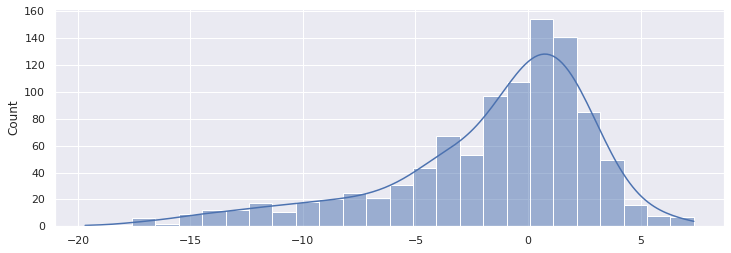

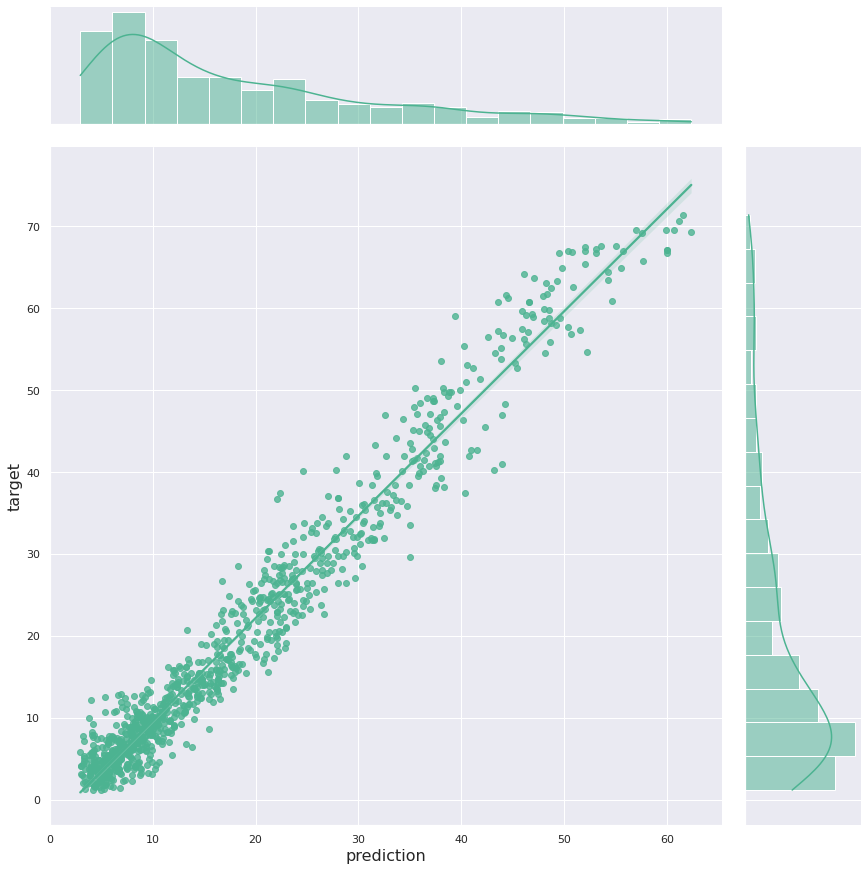

In [ ]:
i=1

print('Wind Load Factor at t + ' + str(i+1))
model_evaluateb(model1,pred1[:,i],test[:,i])
print()

Wind Load Factor at t + 3
[6.83 4.2  4.09 ... 4.27 3.93 3.78]
[13.4518585 11.832049  10.741969  ...  6.911395   6.6840105  6.4177923]
Variance Score = 0.8986442294303342
Moyenne des biais = -1.2222076649962386
r2 score = 0.8933664587483681
RMSE score = 30.18097891692524
Mean Absolute Percentage Error = 33.155507910898685



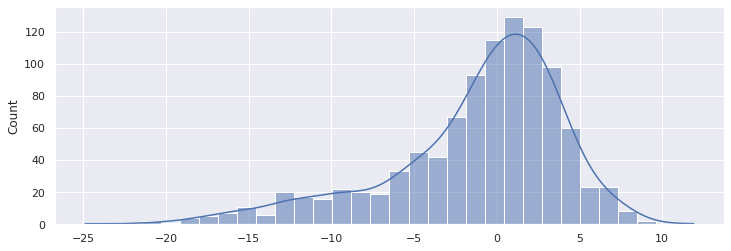

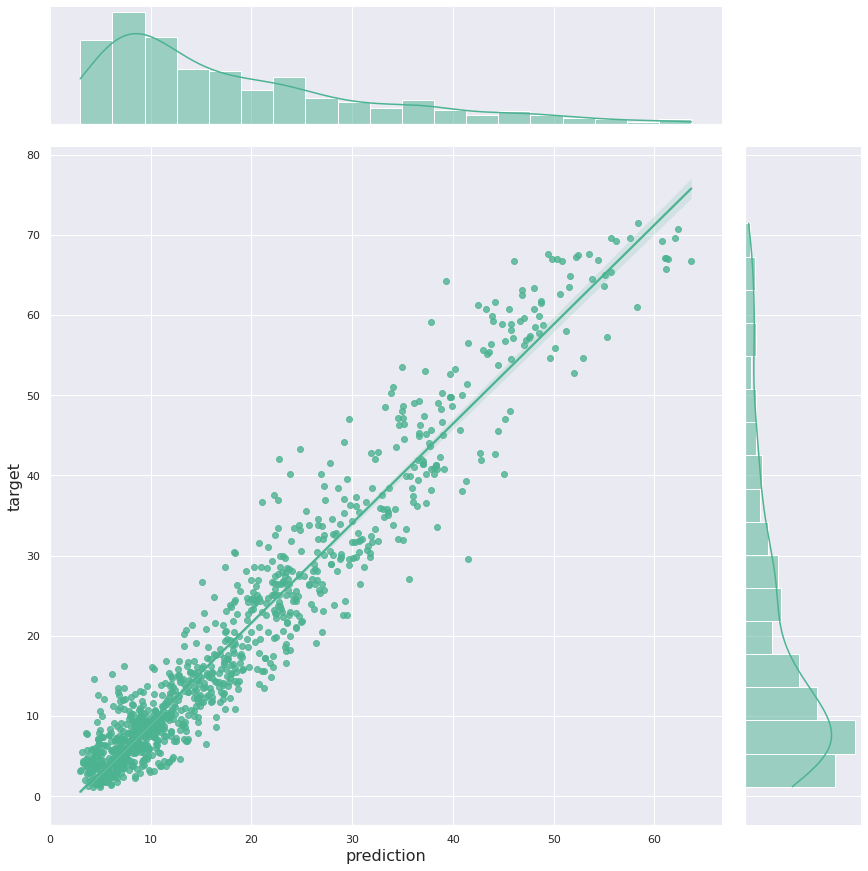

In [ ]:
i=2

print('Wind Load Factor at t + ' + str(i+1))
model_evaluateb(model1,pred1[:,i],test[:,i])
print()

Wind Load Factor at t + 4
[4.2  4.09 4.5  ... 3.93 3.78 3.69]
[13.798513  12.654261  11.860565  ...  7.45229    7.0461063  6.9036126]
Variance Score = 0.8659875601181212
Moyenne des biais = -0.8446708556436012
r2 score = 0.8634675665912119
RMSE score = 38.65551153557827
Mean Absolute Percentage Error = 39.75041839131116



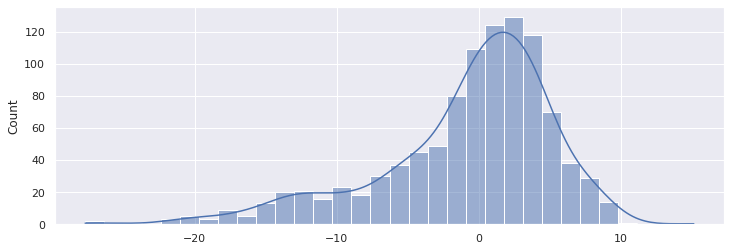

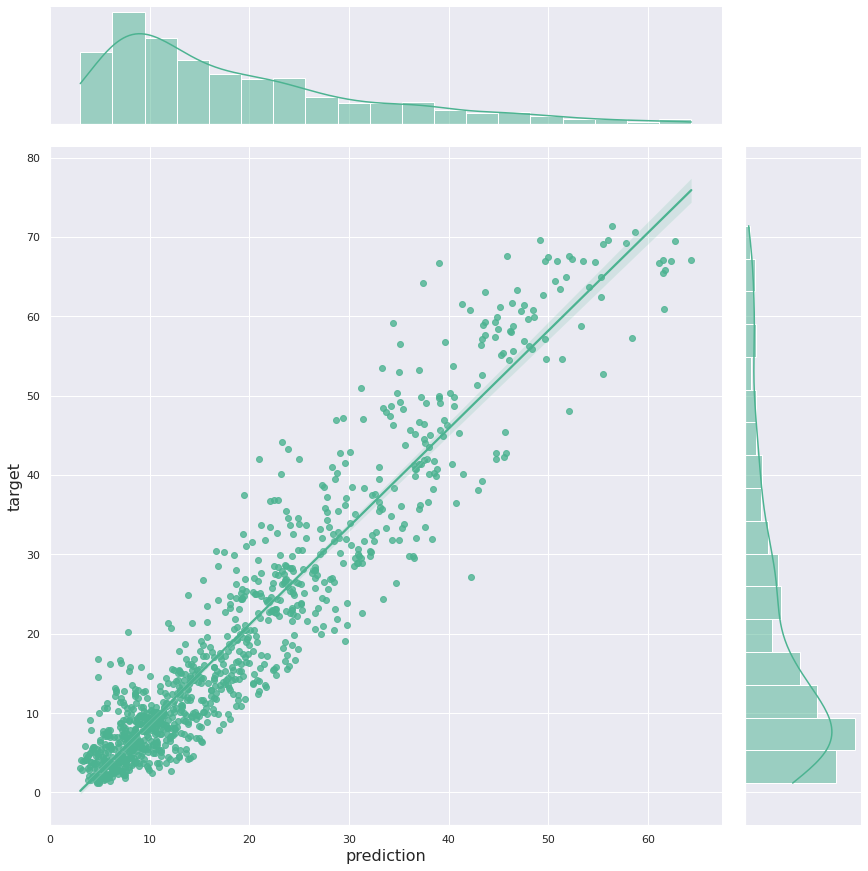

In [ ]:
i=3

print('Wind Load Factor at t + ' + str(i+1))
model_evaluateb(model1,pred1[:,i],test[:,i])
print()

### Conv + LSTM + Dense

Quite good for t+1 

Good for t+2 & t+3 

Limited for t+4

**Score Recap :**

---
> t+1 || r2 score = 0.919 || RMSE score = 16.062 || MAPE score = 15.792
---
> t+2 || r2 score = 0.882 || RMSE score = 21.927 || MAPE score = 18.582
---
> t+1 || r2 score = 0.801 || RMSE score = 33.534 || MAPE score = 23.415
---
> t+1 || r2 score = 0.688 || RMSE score = 47.295 || MAPE score = 28.590
---


In [23]:
# model = keras.models.load_model('/content/gdrive/MyDrive/Deep Learning/Models/model_Conv_LSTM_Dense.h5')
model = keras.models.load_model('Models/model_Conv_LSTM_Dense.h5')
pred = model.predict(X_test_4)

32/32 [==============================] - 15s 425ms/step


[12.9  10.61  6.83 ...  3.93  3.78  3.69]
[13.001575  12.191751  11.492464  ...  4.9949656  5.1439333  5.2807655]
Variance Score = 0.9004141566326764
Moyenne des biais = -1.2366599250734147
r2 score = 0.8950087178015136
RMSE score = 29.70454176227825
Mean Absolute Percentage Error = 26.231564836202896


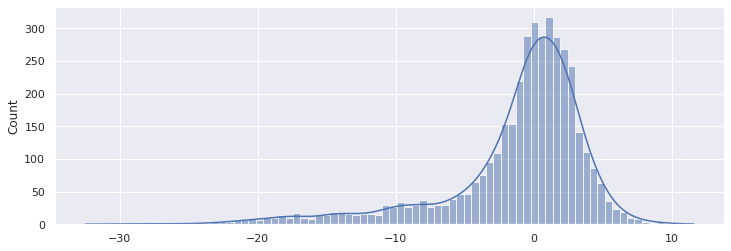

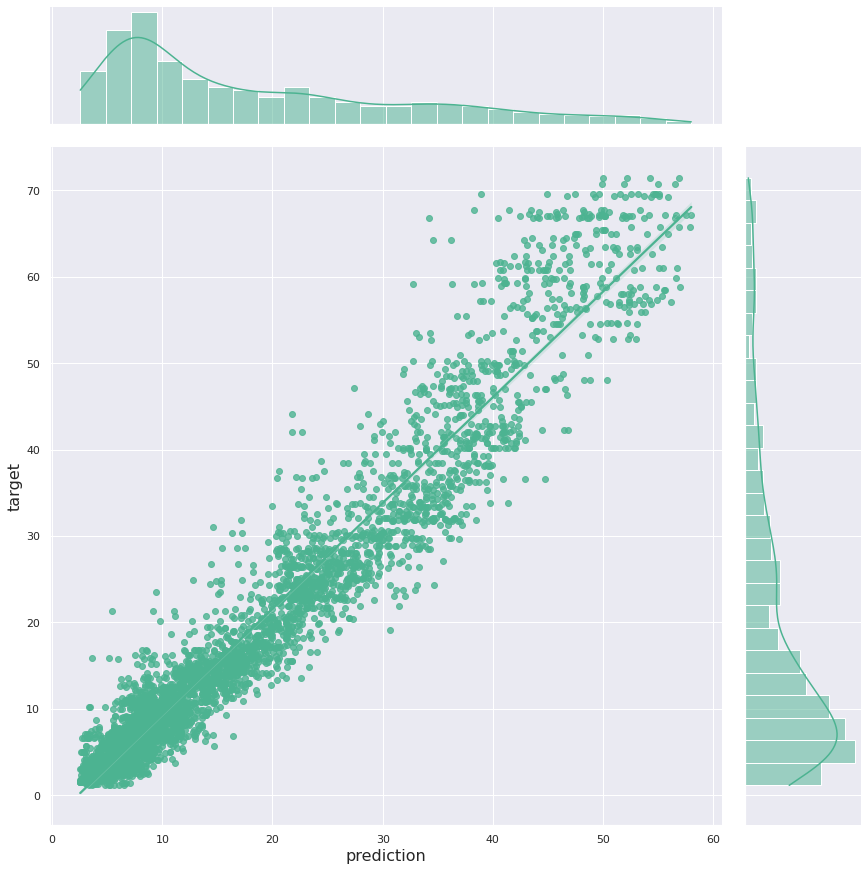

In [24]:
model_evaluateb(model,pred,test)

Wind Load Factor at t + 1
[12.9  10.61  6.83 ...  3.7   4.01  4.27]
[13.001575  11.444935   9.6923485 ...  4.871731   5.768014   5.128272 ]
Variance Score = 0.9443777840373087
Moyenne des biais = -0.5828281735856115
r2 score = 0.9431760687563577
RMSE score = 16.06241220219418
Mean Absolute Percentage Error = 21.58341053337183



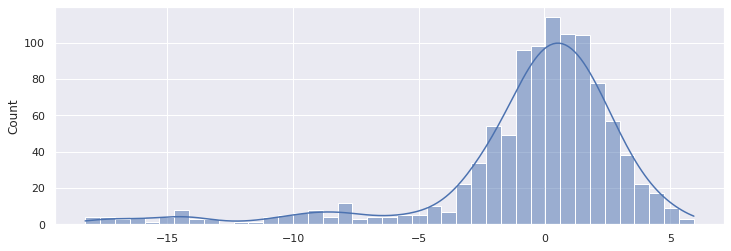

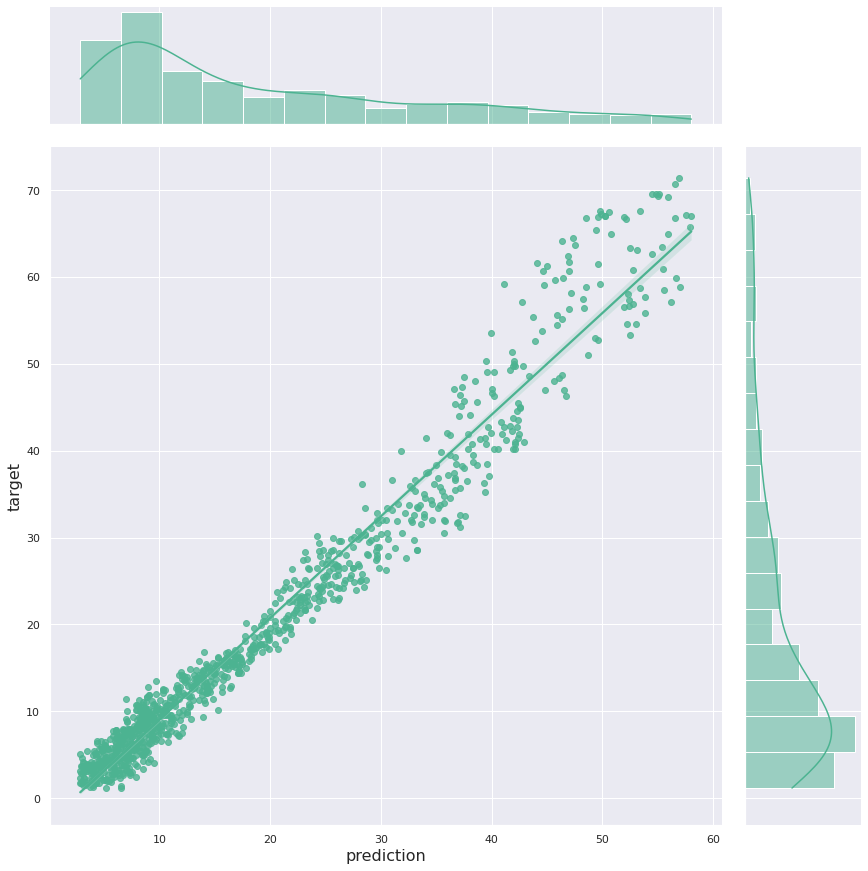

In [ ]:
i=0

print('Wind Load Factor at t + ' + str(i+1))
model_evaluateb(model,pred[:,i],test[:,i])
print()

Wind Load Factor at t + 2
[10.61  6.83  4.2  ...  4.01  4.27  3.93]
[12.191751  10.718652   9.093499  ...  4.817188   5.6891274  4.9949656]
Variance Score = 0.9262705409710046
Moyenne des biais = -1.0348928614688886
r2 score = 0.9224843063054549
RMSE score = 21.926680732111887
Mean Absolute Percentage Error = 23.18321358892987



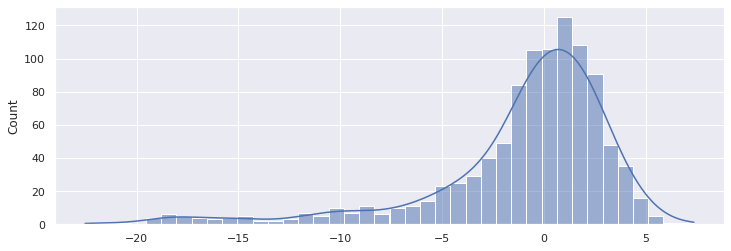

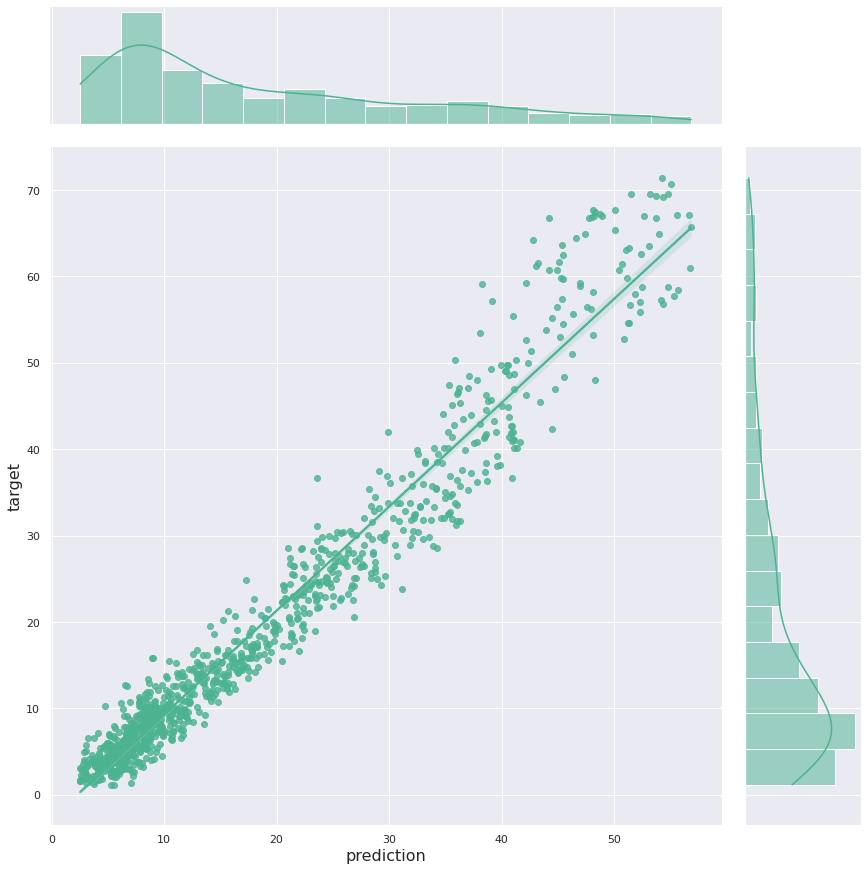

In [ ]:
i=1

print('Wind Load Factor at t + ' + str(i+1))
model_evaluateb(model,pred[:,i],test[:,i])
print()

Wind Load Factor at t + 3
[6.83 4.2  4.09 ... 4.27 3.93 3.78]
[11.492464  10.13272    8.671218  ...  5.0560575  5.886327   5.1439333]
Variance Score = 0.8889160038684786
Moyenne des biais = -1.4468674176301797
r2 score = 0.8815196448477947
RMSE score = 33.534036841937876
Mean Absolute Percentage Error = 27.68959526485722



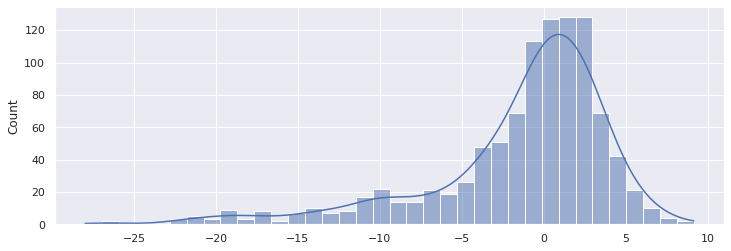

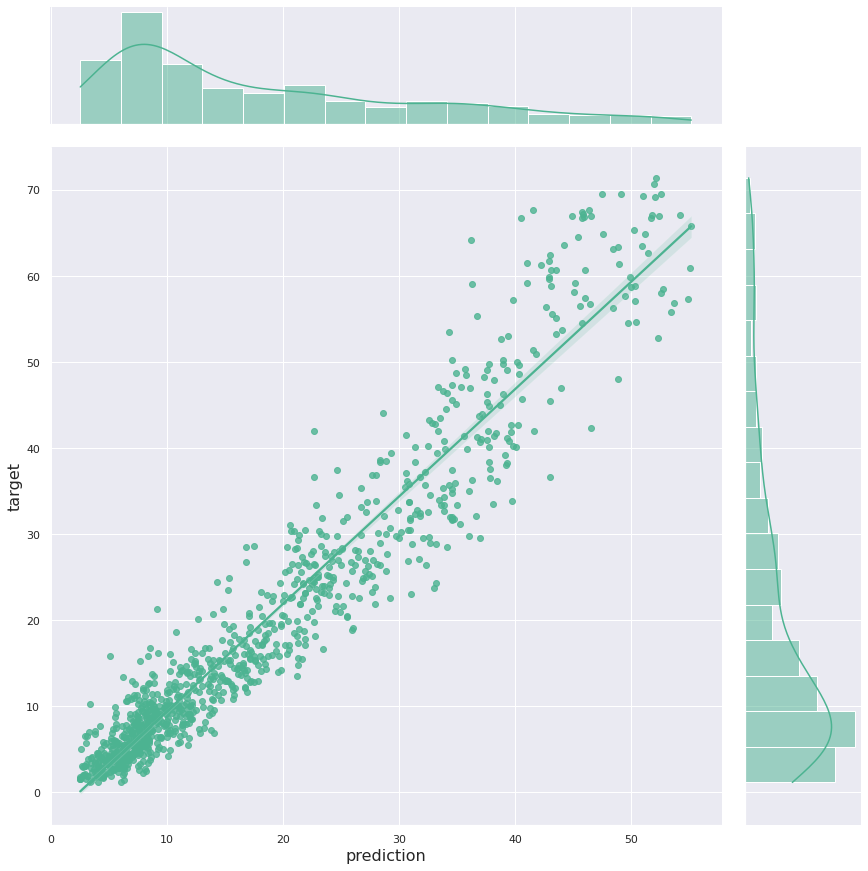

In [ ]:
i=2

print('Wind Load Factor at t + ' + str(i+1))
model_evaluateb(model,pred[:,i],test[:,i])
print()

Wind Load Factor at t + 4
[4.2  4.09 4.5  ... 3.93 3.78 3.69]
[10.844055   9.592391   8.284092  ...  5.2733774  6.0626974  5.2807655]
Variance Score = 0.8454633647277405
Moyenne des biais = -1.8820512476089797
r2 score = 0.8329525009368746
RMSE score = 47.29503727286908
Mean Absolute Percentage Error = 32.47003995765267



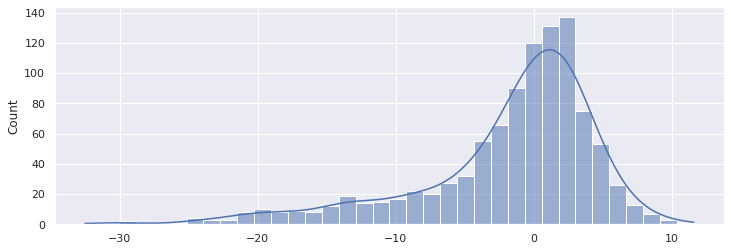

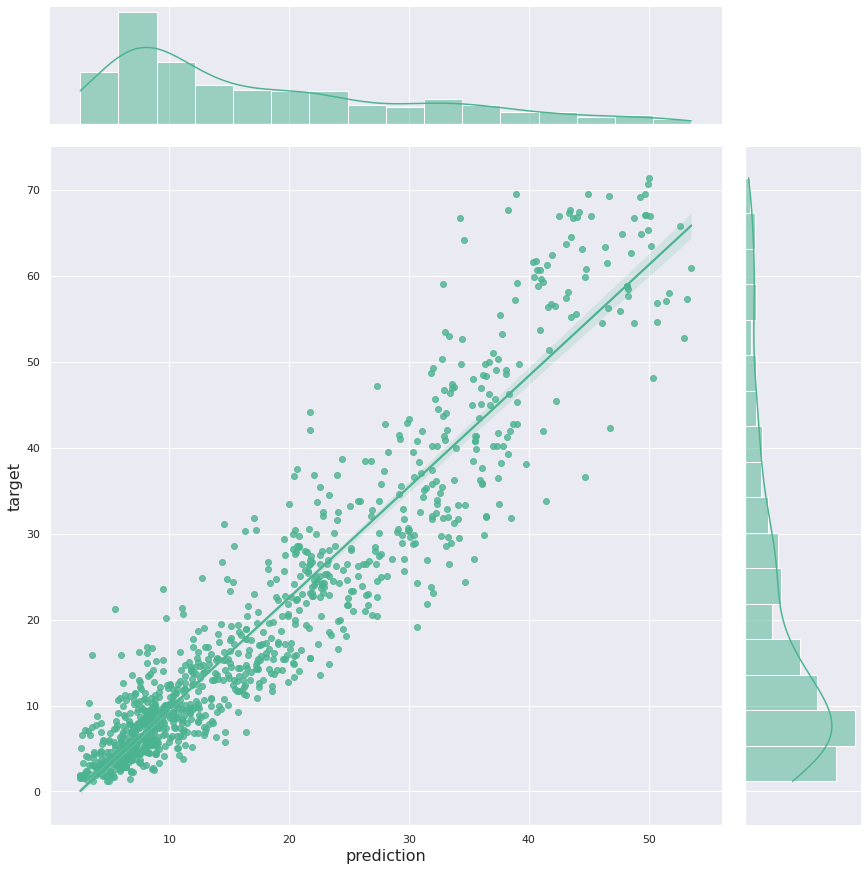

In [ ]:
i=3

print('Wind Load Factor at t + ' + str(i+1))
model_evaluateb(model,pred[:,i],test[:,i])
print()

# Combination of the best model for each time step ahead


[12.9  10.61  6.83 ...  3.93  3.78  3.69]
[13.001575  12.191751  11.492464  ...  4.9949656  5.1439333  6.9036126]
Variance Score = 0.9060188369114138
Moyenne des biais = -0.9773148270820698
r2 score = 0.9026428608561698
RMSE score = 27.544660327955548
Mean Absolute Percentage Error = 28.051659444617517


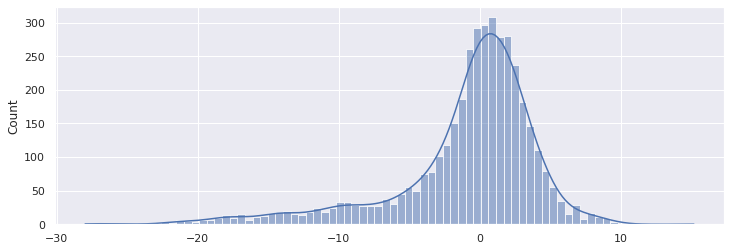

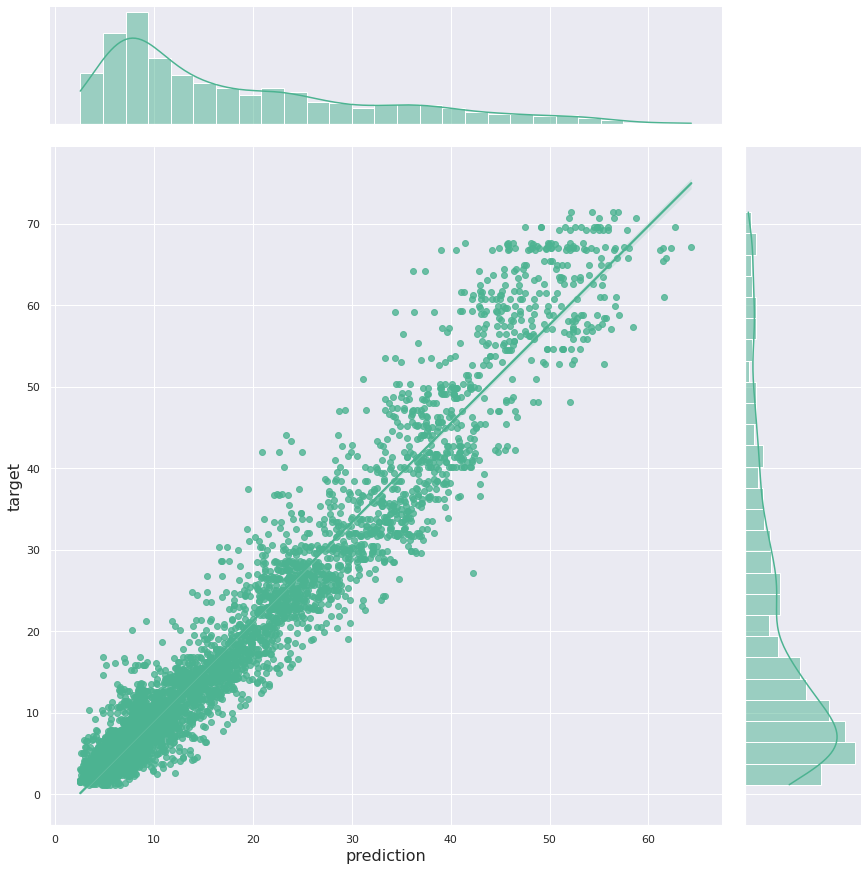

In [ ]:
tamp = np.concatenate((pred[:,:3],pred1[:,3:]), axis = 1)
model_evaluateb(model,tamp,test)

Wind Load Factor at t + 1
[12.9  10.61  6.83 ...  3.7   4.01  4.27]
[13.001575  11.444935   9.6923485 ...  4.871731   5.768014   5.128272 ]
Variance Score = 0.9443777840373087
Moyenne des biais = -0.5828281735856115
r2 score = 0.9431760687563577
RMSE score = 16.06241220219418
Mean Absolute Percentage Error = 21.58341053337183



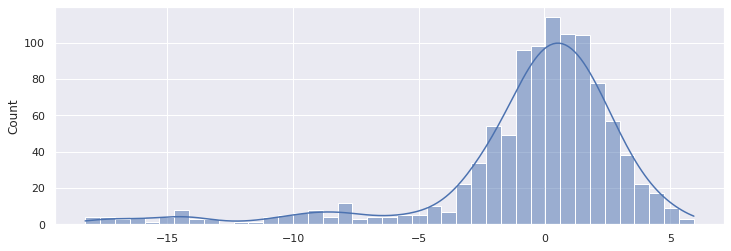

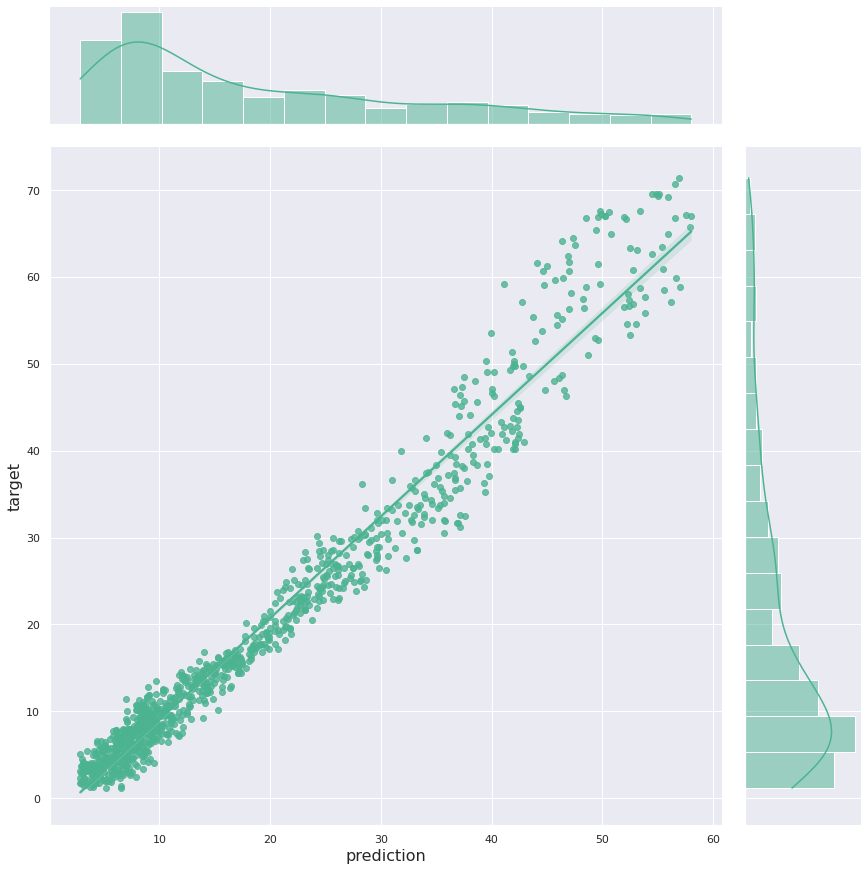

In [ ]:
i=0

print('Wind Load Factor at t + ' + str(i+1))
model_evaluateb(model,tamp[:,i],test[:,i])
print()

Wind Load Factor at t + 2
[10.61  6.83  4.2  ...  4.01  4.27  3.93]
[12.191751  10.718652   9.093499  ...  4.817188   5.6891274  4.9949656]
Variance Score = 0.9262705409710046
Moyenne des biais = -1.0348928614688886
r2 score = 0.9224843063054549
RMSE score = 21.926680732111887
Mean Absolute Percentage Error = 23.18321358892987



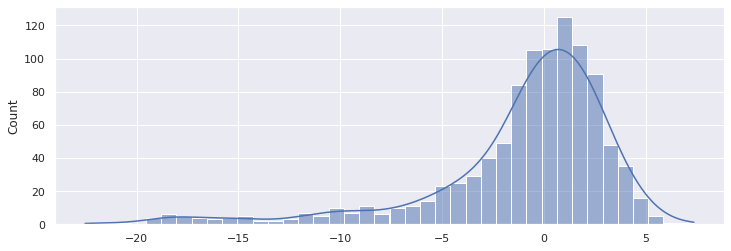

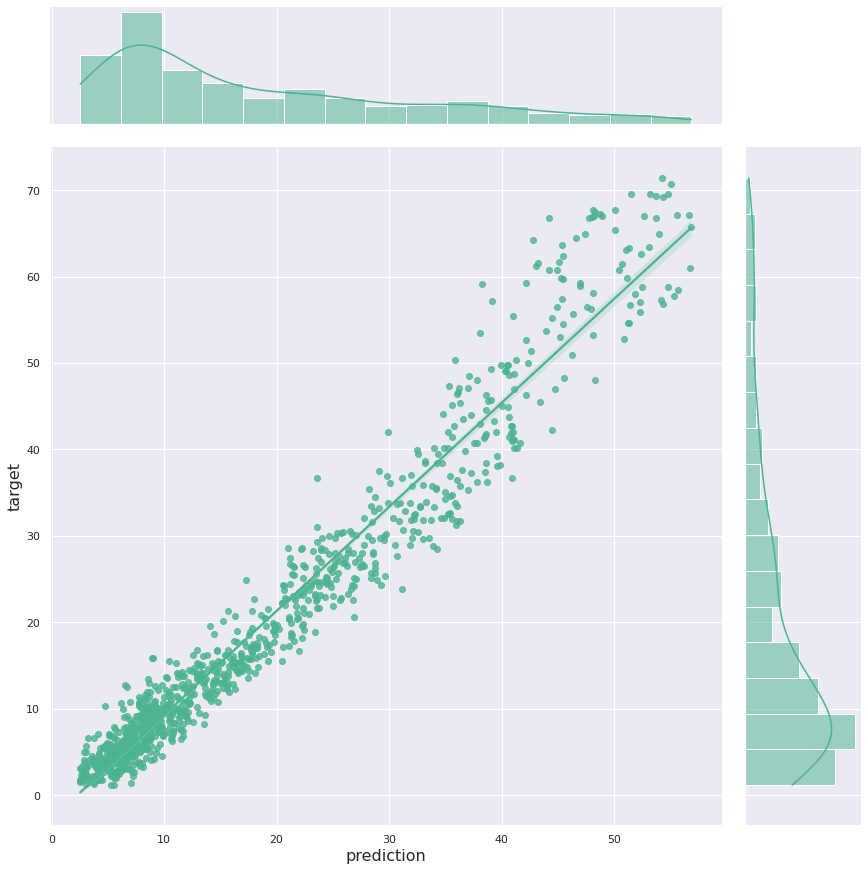

In [ ]:
i=1

print('Wind Load Factor at t + ' + str(i+1))
model_evaluateb(model,tamp[:,i],test[:,i])
print()

Wind Load Factor at t + 3
[6.83 4.2  4.09 ... 4.27 3.93 3.78]
[11.492464  10.13272    8.671218  ...  5.0560575  5.886327   5.1439333]
Variance Score = 0.8889160038684786
Moyenne des biais = -1.4468674176301797
r2 score = 0.8815196448477947
RMSE score = 33.534036841937876
Mean Absolute Percentage Error = 27.68959526485722



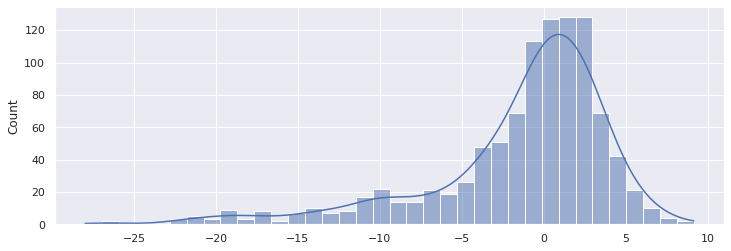

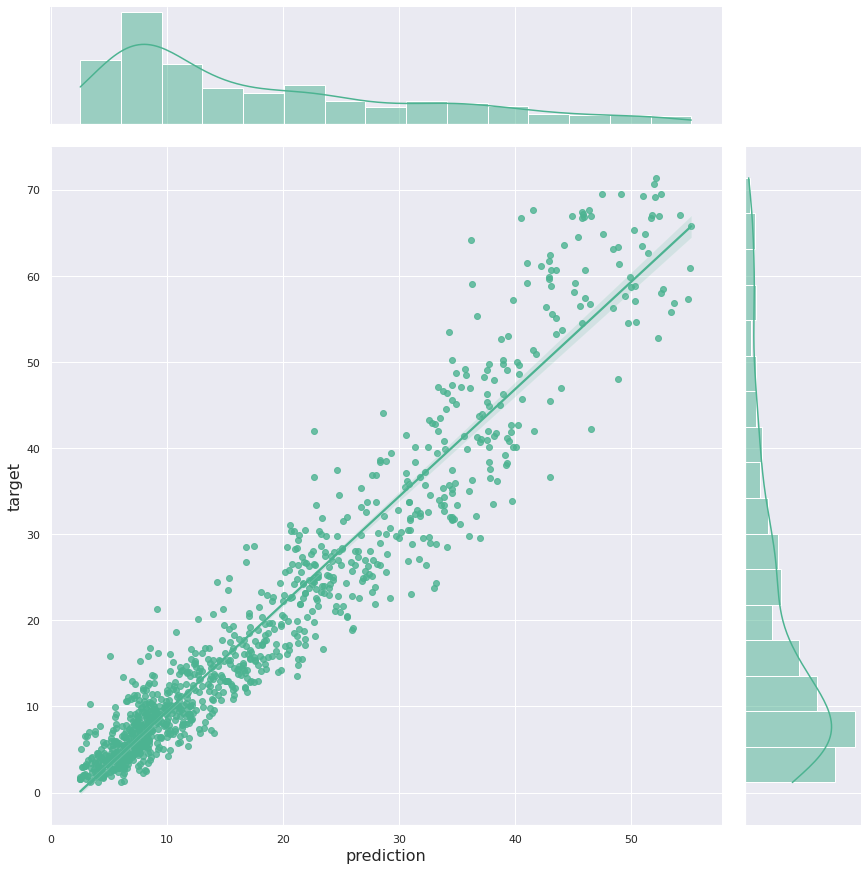

In [ ]:
i=2

print('Wind Load Factor at t + ' + str(i+1))
model_evaluateb(model,tamp[:,i],test[:,i])
print()

Wind Load Factor at t + 4
[4.2  4.09 4.5  ... 3.93 3.78 3.69]
[13.798513  12.654261  11.860565  ...  7.45229    7.0461063  6.9036126]
Variance Score = 0.8659875601181212
Moyenne des biais = -0.8446708556436012
r2 score = 0.8634675665912119
RMSE score = 38.65551153557827
Mean Absolute Percentage Error = 39.75041839131116



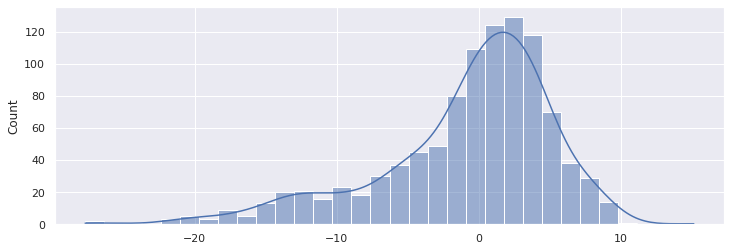

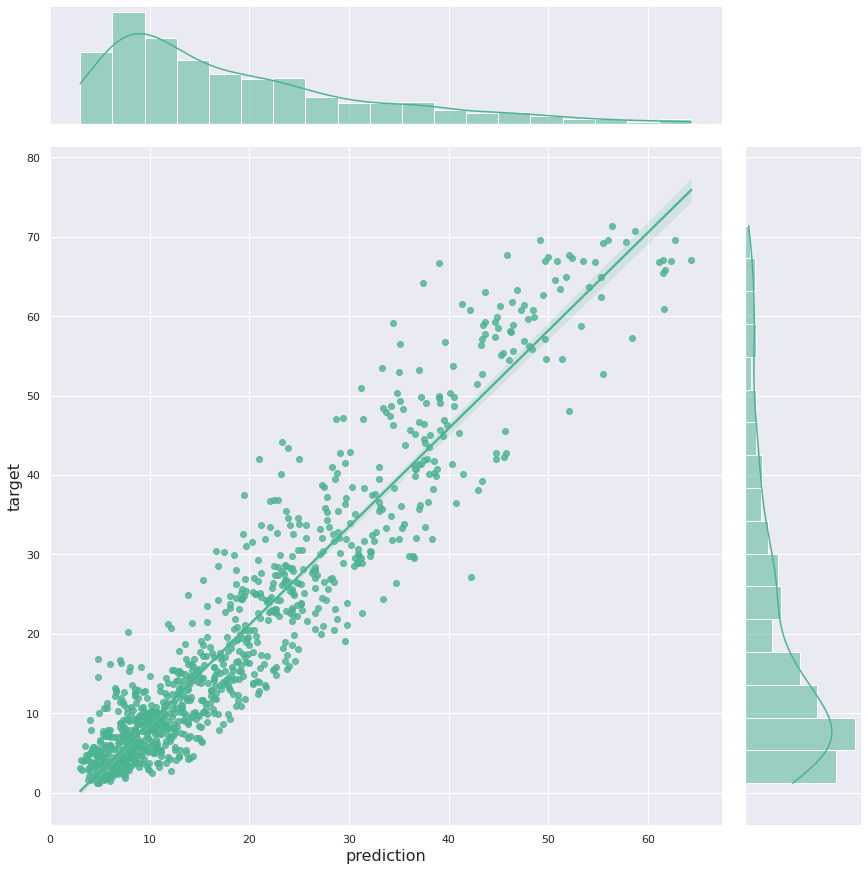

In [ ]:
i=3

print('Wind Load Factor at t + ' + str(i+1))
model_evaluateb(model,tamp[:,i],test[:,i])
print()

In [ ]:
np.shape(test)

(1013, 4)

[12.9  10.61  6.83 ...  3.93  3.78  3.69]
[13.001575  12.191751  13.4518585 ...  4.9949656  6.4177923  6.9036126]
Variance Score = 0.9086048233162343
Moyenne des biais = -0.9211498889235846
r2 score = 0.905605723014171
RMSE score = 26.706395846702392
Mean Absolute Percentage Error = 29.418137606127885


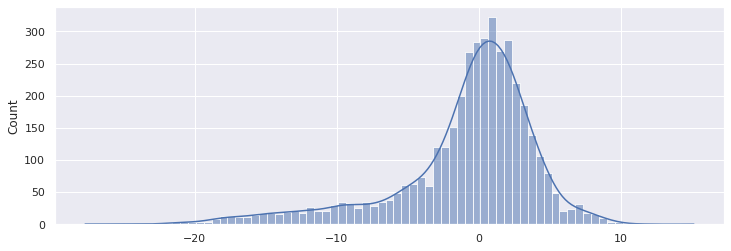

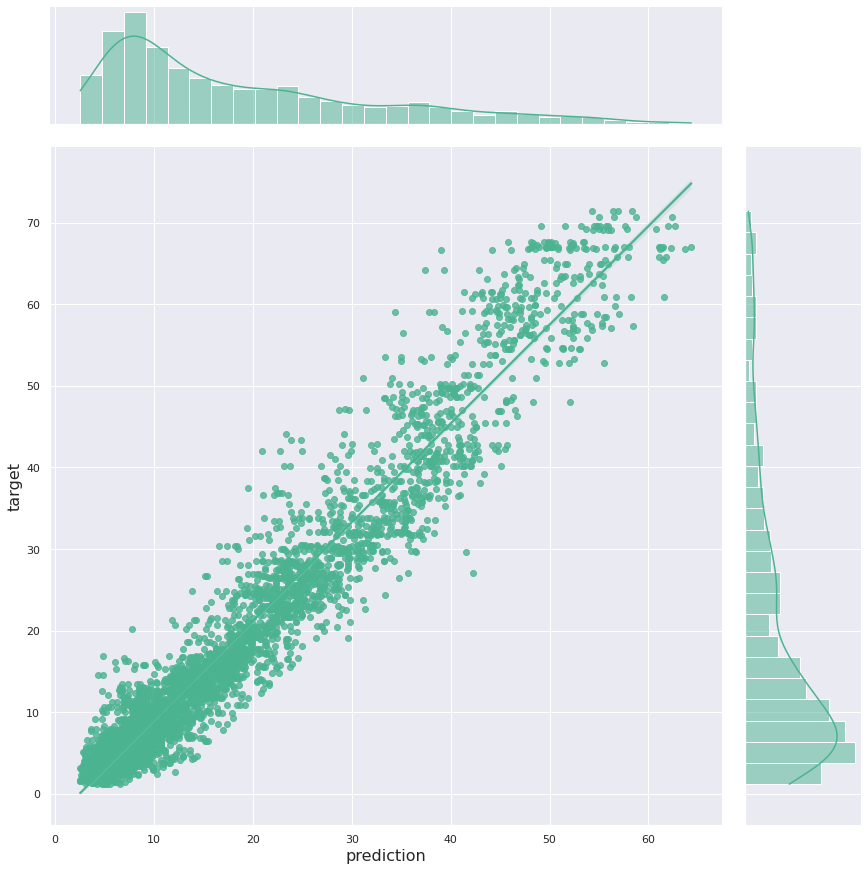

In [ ]:
tamp = np.concatenate((pred[:,:2],pred1[:,2:]), axis = 1)
model_evaluateb(model,tamp,test)

[12.9  10.61  6.83 ...  3.93  3.78  3.69]
[13.001575  12.191751  11.492464  ...  4.9949656  5.1439333  5.2807655]
Variance Score = 0.9004141566326764
Moyenne des biais = -1.2366599250734147
r2 score = 0.8950087178015136
RMSE score = 29.70454176227825
Mean Absolute Percentage Error = 26.231564836202896


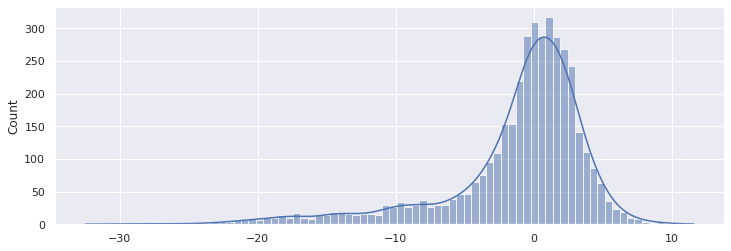

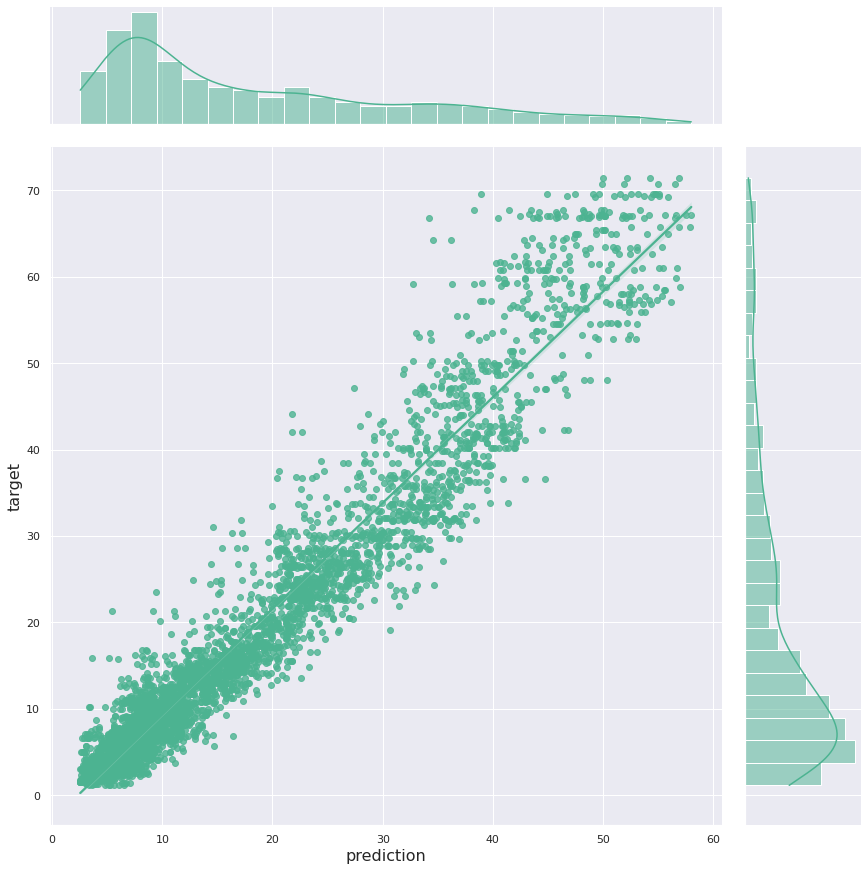

In [ ]:
# r2 score = 0.8950087178015136
# RMSE score = 29.70454176227825
# Mean Absolute Percentage Error = 26.231564836202896
model_evaluateb(model,pred,test)

# Few Graphs about the data
<!-- https://pyimagesearch.com/2019/02/04/keras-multiple-inputs-and-mixed-data/ -->


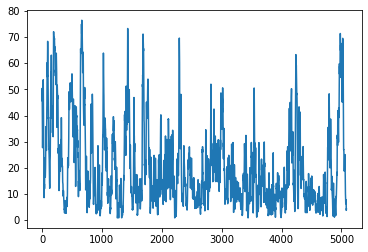

In [ ]:
ytilde = pd.DataFrame.to_numpy(y) 
X

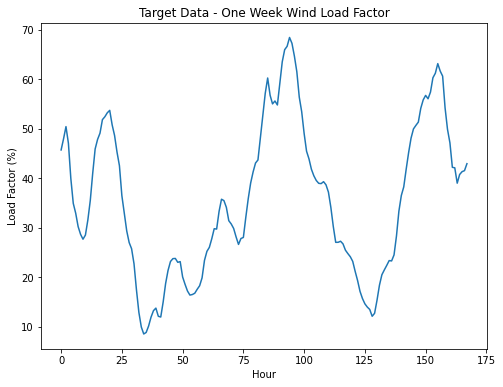

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(ytilde[:168,0])
plt.title("Target Data - One Week Wind Load Factor")
plt.ylabel("Load Factor (%)")
plt.xlabel('Hour')
plt.savefig("lf.png")

In [ ]:
import matplotlib.pyplot as plt
Xtilde=pd.DataFrame.to_numpy(X)

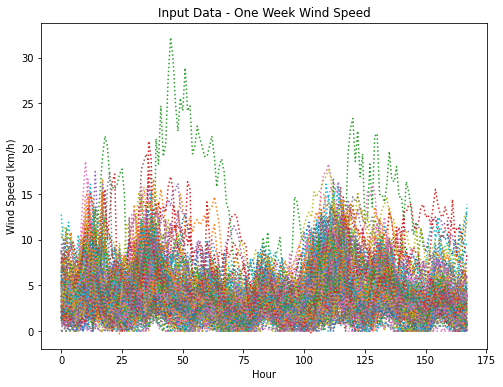

In [ ]:
tampon2 = Xtilde[:168,:175]
tampon2 = np.transpose(tampon2)

plt.figure(figsize=(8, 6))

for i in range(168):

  plt.plot(tampon2[i], linestyle=':')
plt.title("Input Data - One Week Wind Speed")
plt.ylabel("Wind Speed (km/h)")
plt.xlabel('Hour')
plt.savefig("wind.png")

In [ ]:
fig, ax1 = plt.subplots()

ax2 = ax1.twinx()
ax1.plot(x, y1, 'g-')
ax2.plot(x, y2, 'b-')

ax1.set_xlabel('X data')
ax1.set_ylabel('Y1 data', color='g')
ax2.set_ylabel('Y2 data', color='b')

plt.show()

array([[6.944     , 7.778     , 2.26892554, ..., 3.056     , 5.278     ,
        5.        ],
       [6.111     , 7.5       , 2.35015448, ..., 3.056     , 5.        ,
        4.444     ],
       [6.944     , 8.333     , 2.59551954, ..., 3.889     , 7.222     ,
        3.889     ],
       ...,
       [2.778     , 3.056     , 1.59466131, ..., 3.056     , 3.056     ,
        1.944     ],
       [3.333     , 3.611     , 1.49375171, ..., 3.333     , 2.778     ,
        1.667     ],
       [4.167     , 3.611     , 1.54460413, ..., 3.056     , 2.5       ,
        1.667     ]])

In [ ]:
np.transpose(tampon2)

array([[6.944     , 6.111     , 6.944     , ..., 2.778     , 3.333     ,
        4.167     ],
       [7.778     , 7.5       , 8.333     , ..., 3.056     , 3.611     ,
        3.611     ],
       [2.26892554, 2.35015448, 2.59551954, ..., 1.59466131, 1.49375171,
        1.54460413],
       ...,
       [3.056     , 3.056     , 3.889     , ..., 3.056     , 3.333     ,
        3.056     ],
       [5.278     , 5.        , 7.222     , ..., 3.056     , 2.778     ,
        2.5       ],
       [5.        , 4.444     , 3.889     , ..., 1.944     , 1.667     ,
        1.667     ]])

In [ ]:
X2=pd.DataFrame.to_numpy(X)

In [ ]:
X2=pd.DataFrame.to_numpy(X)

np.shape(X2)
X2 = X2.reshape([np.shape(X2)[0],np.shape(X2)[1],1])
np.shape(X2)

np.hstack((X2,tamp))

(5085, 4272, 1)

In [ ]:
ajouter les 24 derniers facteurs de charge